In [659]:
import pandas as pd

In [660]:
df = pd.read_csv('2024_Accidentalidad.csv', sep=';')

In [661]:
df

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,cod_lesividad,lesividad,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga
0,2023S040280,04/01/2024,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Motocicleta > 125cc,Conductor,De 55 a 59 años,Hombre,2.0,Ingreso inferior o igual a 24 horas,444913.0,4481427.0,N,NaN
1,2023S040280,04/01/2024,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Turismo,Conductor,De 55 a 59 años,Mujer,14.0,Sin asistencia sanitaria,444913.0,4481427.0,N,NaN
2,2023S040309,15/02/2024,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Bicicleta,Conductor,De 25 a 29 años,Hombre,7.0,Asistencia sanitaria sólo en el lugar del acci...,440123.0,4475170.0,N,NaN
3,2023S040309,15/02/2024,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Motocicleta hasta 125cc,Conductor,De 35 a 39 años,Hombre,14.0,Sin asistencia sanitaria,440123.0,4475170.0,N,NaN
4,2023S040310,18/02/2024,10:40:00,GTA. RUIZ JIMENEZ / CALL. SAN BERNARDO,3,7,CHAMBERÍ,Colisión lateral,Despejado,Turismo,Conductor,De 25 a 29 años,Hombre,NaN,NaN,440137.0,4475721.0,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40160,2024S030621,18/10/2024,17:05:00,PLAZA. LIMA / AVDA. CONCHA ESPINA,0,5,CHAMARTÍN,Colisión lateral,Se desconoce,Turismo,Conductor,De 45 a 49 años,Hombre,14.0,Sin asistencia sanitaria,441447.0,4478230.0,N,NaN
40161,2024S031786,11/10/2024,2:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67,9,MONCLOA-ARAVACA,Alcance,Se desconoce,Turismo,Conductor,Desconocido,Desconocido,NaN,NaN,439269.0,4475805.0,N,NaN
40162,2024S031786,11/10/2024,2:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67,9,MONCLOA-ARAVACA,Alcance,Se desconoce,Turismo,Conductor,Desconocido,Hombre,NaN,NaN,439269.0,4475805.0,N,NaN
40163,2024S031786,11/10/2024,2:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67,9,MONCLOA-ARAVACA,Alcance,Se desconoce,Turismo,Pasajero,De 21 a 24 años,Hombre,14.0,Sin asistencia sanitaria,439269.0,4475805.0,N,NaN


Podemos observar que es un dataset que muestra un registro de accidentes de tráfico en la Comunidad de Madrid. Hay tantas filas como personas implicadas en accidentes a lo largo del año 2024 (hasta el 11 de octubre de 2024).

# Tarea 1

In [662]:
df.columns

Index(['num_expediente', 'fecha', 'hora', 'localizacion', 'numero',
       'cod_distrito', 'distrito', 'tipo_accidente', 'estado_meteorológico',
       'tipo_vehiculo', 'tipo_persona', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'coordenada_x_utm', 'coordenada_y_utm', 'positiva_alcohol',
       'positiva_droga'],
      dtype='object')

El dataset se compone de 19 columnas de las cuales vamos a hacer una breve explicación sobre su contenido

In [663]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40165 entries, 0 to 40164
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   num_expediente        40165 non-null  object 
 1   fecha                 40165 non-null  object 
 2   hora                  40165 non-null  object 
 3   localizacion          40165 non-null  object 
 4   numero                40165 non-null  object 
 5   cod_distrito          40165 non-null  int64  
 6   distrito              40165 non-null  object 
 7   tipo_accidente        40162 non-null  object 
 8   estado_meteorológico  35507 non-null  object 
 9   tipo_vehiculo         39844 non-null  object 
 10  tipo_persona          40165 non-null  object 
 11  rango_edad            40165 non-null  object 
 12  sexo                  40165 non-null  object 
 13  cod_lesividad         22336 non-null  float64
 14  lesividad             22336 non-null  object 
 15  coordenada_x_utm   

In [664]:
df.isnull().sum()

num_expediente              0
fecha                       0
hora                        0
localizacion                0
numero                      0
cod_distrito                0
distrito                    0
tipo_accidente              3
estado_meteorológico     4658
tipo_vehiculo             321
tipo_persona                0
rango_edad                  0
sexo                        0
cod_lesividad           17829
lesividad               17829
coordenada_x_utm           10
coordenada_y_utm           10
positiva_alcohol          138
positiva_droga          39995
dtype: int64

- num_expediente: Está formado por el año del accidente y el identificador. Vemos cómo puede aparecer el mismo número varias veces, esto se debe a que cada persona involucrada en un accidente tiene una fila distinta del dataset.
- Fecha: Fecha del accidente en formato dd/mm/aaaa. Tendremos que pasarla a datetime seguramente.
- hora: La hora exacta del accidente.
- localización: aquí tenemos la ubicación del accidente, puede ser 1 calle o dos (cuando son dos, se refiere a un cruce o intersección).
- Número: el número de la calle para tener más detalle sobre el accidente
- cod_distrito: el código del distrito, cada distrito tiene uno distinto.
- distrito: aquí tenemos el nombre del distrito, para entrenar modelos lo haremos con su respectivo código.
- tipo_accidente: en esta columna se clasifican los accidentes en función de cómo se hayan producido.
- estado_meteorológico: tenemos la descripción meteorológica en el momento del accidente, vemos como tenemos bastantes valores Nan, así que más adelante veremos qué hacemos con ellos
- tipo_vehiculo: aquí obtenemos el tipo de vehículo implicado en el accidente con un string.
- tipo_persona: el tipo de persona implicada en el accidente. También está representada como string así que tendremos que tratarla
rango_edad:
- sexo: Es de tipo object pero solo hay dos valores distintos así que pasarlo a numérico no debería ser un problema.
- cod_lesividad: la codificación de la columna lesividad. Vemos que tiene muchos valores faltantes y son los mismos que en la columna lesividad, por lo que después observaremos qué es lo que está ocurriendo ahí.
- Lesividad: Strings que clasifican la gravedad de un accidente en función de las lesiones de un pasajero.
- coordenada_x_utm: columna numérica con las coordenadas x de los lugares donde se han producido accidentes.
- coordenada_y_utm: columna numérica con las coordenadas y de los lugares donde se han producido accidentes.
- positiva_alcohol: columna categórica que indica si la persona implicada en el accidente ha dado positivo en alcohol o no. Esta columna seguramente tengamos que convertirla en booleana en un futuro.
- positiva_droga: columna numérica que indica si la persona dio positivo en alcohol o no. Hay tantos valores nulos porque representan a los que no dieron positivo por lo que el tratamiento de datos faltantes en esta columna lo podremos completar con un simple fillna().


Vamos a tratar columna por columna el dataframe para estudiar a fondo nuestros datos

#### num_expediente

In [665]:
df['num_expediente'].nunique()

16935

Vemos como hay un total de 16935 accidentes registrados y no contamos con valores nulos. Esta columna nos va a servir más adelante para agrupar los datos por accidentes y poder entender mejor ciertas relaciones a través de gráficas. Por ahora la vamos a dejar así ya que para los algoritmos de clustering no la vamos a utilizar porque no nos aporta información valiosa para agrupar nuestros datos

#### fecha

Esta columna vamos a pasarla a datetime y de ella vamos a sacar características numéricas que nos pueden dervir de utilidad para agrupar los datos. Además, estas características nos van a ser de utilidad para graficar nuestros datos y observar tendencias de accidentes a lo largo del tiempo

In [666]:
df['fecha'] = pd.to_datetime(df['fecha'], format='%d/%m/%Y')

In [667]:
df.fecha

0       2024-01-04
1       2024-01-04
2       2024-02-15
3       2024-02-15
4       2024-02-18
           ...    
40160   2024-10-18
40161   2024-10-11
40162   2024-10-11
40163   2024-10-11
40164   2024-10-11
Name: fecha, Length: 40165, dtype: datetime64[ns]

In [668]:
df['año'] = df['fecha'].dt.year
df['mes'] = df['fecha'].dt.month
df['dia_semana'] = df['fecha'].dt.weekday  # Lunes = 0, Domingo = 6
df['es_fin_semana'] = df['dia_semana'].isin([5, 6])  # Sábado y Domingo


#### hora

De la hora, podemos hacer una clasificación por rango horario, es decir: madrugada, mañana, tarde y noche. Así agrupamos los accidentes manteniendo información relevante de la columna hora original. Posteriormente codificaremos la columna con un one hot encoding.

In [669]:
df.hora

0        14:09:00
1        14:09:00
2        14:05:00
3        14:05:00
4        10:40:00
           ...   
40160    17:05:00
40161     2:00:00
40162     2:00:00
40163     2:00:00
40164     2:00:00
Name: hora, Length: 40165, dtype: object

In [670]:
df['hora'] = pd.to_datetime(df['hora'], format='%H:%M:%S').dt.time

In [671]:
df['hora_entera'] = pd.to_datetime(df['hora'], format='%H:%M:%S').dt.hour

def clasificar_rango_horario(hora):
    if 6 <= hora <= 12:
        return 'mañana'
    elif 12 < hora < 20:
        return 'tarde'
    elif 20 <= hora < 24:
        return 'noche'
    else:
        return 'madrugada'

df['rango_horario'] = df['hora_entera'].apply(clasificar_rango_horario)

In [672]:
rango_horario_map = {'madrugada': 0, 'mañana': 1, 'tarde': 2, 'noche': 3}
df['rango_horario_cod'] = df['rango_horario'].map(rango_horario_map)
df = df.drop('hora_entera', axis = 1)

#### Localizacion

La localización es algo más compleja, ya que tenemos cruces. Los cruces están representados de la siguiente forma: 'calle / calle'.   
A parte de los cruces, tenemos accidentes en calles o carreteras sin necesidad de un cruce por lo que vamos a añadir una columna booleana que nos diga si el accidente se produce en un cruce o no.

In [673]:
df.localizacion

0        AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11
1        AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11
2                      CALL. TESORO / CALL. MINAS
3                      CALL. TESORO / CALL. MINAS
4          GTA. RUIZ JIMENEZ / CALL. SAN BERNARDO
                           ...                   
40160           PLAZA. LIMA / AVDA. CONCHA ESPINA
40161     CALL. PRINCESA / CALL. ALBERTO AGUILERA
40162     CALL. PRINCESA / CALL. ALBERTO AGUILERA
40163     CALL. PRINCESA / CALL. ALBERTO AGUILERA
40164     CALL. PRINCESA / CALL. ALBERTO AGUILERA
Name: localizacion, Length: 40165, dtype: object

In [674]:
df.localizacion.value_counts()

localizacion
AUTOV. A-2, +00500E                      95
AUTOV. A-42, +00500E                     82
AVDA. ANDALUCIA / AUTOV. M-40            63
CALL. FUENTE CARRANTONA / AUTOV. M-23    56
AUTOV. A-42, +00500S                     44
                                         ..
CALL. JOSE DEL HIERRO, 7                  1
CALL. PRUDENCIO ALVARO, 35                1
CALL. BRUJAS, 3D                          1
PASEO. ERMITA DEL SANTO, 25               1
AUTOV. M-30, 15XC20                       1
Name: count, Length: 12866, dtype: int64

In [675]:
df[['calle_1', 'calle_2']] = df['localizacion'].str.split(' / ', expand=True)

Una vez tenemos separadas las calles, aplicamos labelencoding a las calles para codificar la información. Son muchas calles distintas para aplicar one-hot-encodign así que hemos decidido que esta es la mejor opción para representar las calles de forma numérica.

In [676]:
from sklearn.preprocessing import LabelEncoder
import numpy as np

encoder = LabelEncoder()

# Combinar todas las calles únicas y agregar 'SIN_CRUCE' explícitamente
todas_calles = pd.concat([df['calle_1'], df['calle_2']]).dropna().unique()
todas_calles = np.append(todas_calles, 'SIN_CRUCE')  # Agregar 'SIN_CRUCE'

encoder.fit(todas_calles)

# Transformar las columnas
df['calle_1_cod'] = encoder.transform(df['calle_1'])
df['calle_2_cod'] = encoder.transform(df['calle_2'].fillna('SIN_CRUCE'))



In [677]:
df['calle_1_cod']

0         1886
1         1886
2         8867
3         8867
4         9995
         ...  
40160    10937
40161     7712
40162     7712
40163     7712
40164     7712
Name: calle_1_cod, Length: 40165, dtype: int64

Columna que nos indica si el accidente se ha producido en un cruce o no.

In [678]:
df['es_cruce'] = df['calle_2'].notna()

In [679]:
df

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,mes,dia_semana,es_fin_semana,rango_horario,rango_horario_cod,calle_1,calle_2,calle_1_cod,calle_2_cod,es_cruce
0,2023S040280,2024-01-04,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Motocicleta > 125cc,...,1,3,False,tarde,2,AVDA. NICETO ALCALA ZAMORA,AUTOV. M-11,1886,151,True
1,2023S040280,2024-01-04,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3,16,HORTALEZA,Colisión fronto-lateral,Lluvia débil,Turismo,...,1,3,False,tarde,2,AVDA. NICETO ALCALA ZAMORA,AUTOV. M-11,1886,151,True
2,2023S040309,2024-02-15,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Bicicleta,...,2,3,False,tarde,2,CALL. TESORO,CALL. MINAS,8867,6929,True
3,2023S040309,2024-02-15,14:05:00,CALL. TESORO / CALL. MINAS,18,1,CENTRO,Colisión fronto-lateral,Lluvia débil,Motocicleta hasta 125cc,...,2,3,False,tarde,2,CALL. TESORO,CALL. MINAS,8867,6929,True
4,2023S040310,2024-02-18,10:40:00,GTA. RUIZ JIMENEZ / CALL. SAN BERNARDO,3,7,CHAMBERÍ,Colisión lateral,Despejado,Turismo,...,2,6,True,mañana,1,GTA. RUIZ JIMENEZ,CALL. SAN BERNARDO,9995,8236,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40160,2024S030621,2024-10-18,17:05:00,PLAZA. LIMA / AVDA. CONCHA ESPINA,0,5,CHAMARTÍN,Colisión lateral,Se desconoce,Turismo,...,10,4,False,tarde,2,PLAZA. LIMA,AVDA. CONCHA ESPINA,10937,1420,True
40161,2024S031786,2024-10-11,02:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67,9,MONCLOA-ARAVACA,Alcance,Se desconoce,Turismo,...,10,4,False,madrugada,0,CALL. PRINCESA,CALL. ALBERTO AGUILERA,7712,2455,True
40162,2024S031786,2024-10-11,02:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67,9,MONCLOA-ARAVACA,Alcance,Se desconoce,Turismo,...,10,4,False,madrugada,0,CALL. PRINCESA,CALL. ALBERTO AGUILERA,7712,2455,True
40163,2024S031786,2024-10-11,02:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67,9,MONCLOA-ARAVACA,Alcance,Se desconoce,Turismo,...,10,4,False,madrugada,0,CALL. PRINCESA,CALL. ALBERTO AGUILERA,7712,2455,True


In [680]:
df.calle_2 = df.calle_2.fillna('SIN CRUCE')

#### Número

Para esta columna, vamos a pasarla a numérica sin embargo cuando lo hacemos nos topamos con un pequeño problema.

In [681]:
any(df['numero'].isnull())

False

In [682]:
prueba = pd.to_numeric(df['numero'], errors='coerce')

In [683]:
indice = prueba[prueba.isnull()].index

In [684]:
df['numero'].iloc[indice]

11       08NL00
12       08NL00
13       08NL00
14       08NL00
15       08NL00
          ...  
40149    10NL70
40150    10NL70
40151    10NL70
40152       12A
40153       12A
Name: numero, Length: 5250, dtype: object

Vemos que hay valores de la columna número que no han sido convertidos correctamente ya que no tienen mucho sentido para representar el número de una calle, así que los pasamos a Nan y ya veremos que hacemos con ellos cuando terminemos de preprocesar las columnas individualmente.

In [685]:
df['numero'] = pd.to_numeric(df['numero'], errors='coerce')

In [686]:
df['numero']

0         3.0
1         3.0
2        18.0
3        18.0
4         3.0
         ... 
40160     0.0
40161    67.0
40162    67.0
40163    67.0
40164    67.0
Name: numero, Length: 40165, dtype: float64

#### Distrito

Esta columna no contiene valores faltantes y ya tenemos la codificación hecha, así que lo único que tenemos que hacer es convertir a int la codificación del distrito.a

In [687]:
df['cod_distrito'] = df['cod_distrito'].astype('int', errors='raise')

In [688]:
df.cod_distrito

0        16
1        16
2         1
3         1
4         7
         ..
40160     5
40161     9
40162     9
40163     9
40164     9
Name: cod_distrito, Length: 40165, dtype: int64

Sin embargo, estamos añadiendo ordinalidad a los distritos cuando no tiene nada que ver y para calcular distancias puede que se generen relaciones erróneas. Por ello vamos a hacer one hot encodign de esta columna, pero vamos a hacerlo más adelante para primero graficar ciertas relaciones con los nombres originales de la columna distrito.

In [689]:
df['distrito']

0              HORTALEZA
1              HORTALEZA
2                 CENTRO
3                 CENTRO
4               CHAMBERÍ
              ...       
40160          CHAMARTÍN
40161    MONCLOA-ARAVACA
40162    MONCLOA-ARAVACA
40163    MONCLOA-ARAVACA
40164    MONCLOA-ARAVACA
Name: distrito, Length: 40165, dtype: object

#### tipo_accidente

En esta columna observamos que tan sólo tenemos 3 valores faltantes. Al tratarse de una cantidad tan insignificante respecto a los más de 40000 datos que tenemos, podemos eliminar dichas filas para evitarnos problemas.

In [690]:
df.tipo_accidente[df.tipo_accidente.isna()]

39767    NaN
39768    NaN
39957    NaN
Name: tipo_accidente, dtype: object

In [691]:
df = df.drop(df['tipo_accidente'][df['tipo_accidente'].isna()].index, axis=0)

A continuación, vamos a mapear ciertos valores de la columna siguiendo las reglas adjuntadas en el pdf donde se explica la estructura del código.

In [692]:
valores_a_reemplazar = ['Colisión fronto-lateral', 'Colisión frontal', 'Colisión lateral']
nuevo_valor = 'Colisión doble'

df['tipo_accidente'] = df['tipo_accidente'].replace(valores_a_reemplazar, nuevo_valor)

In [693]:
df.tipo_accidente.value_counts()

tipo_accidente
Colisión doble                  18230
Alcance                          9659
Choque contra obstáculo fijo     4298
Atropello a persona              2488
Caída                            2176
Colisión múltiple                2034
Otro                              845
Solo salida de la vía             202
Vuelco                            164
Atropello a animal                 66
Name: count, dtype: int64

In [694]:
valores_a_reemplazar = ['Atropello a animal', 'Otro', 'Solo salida de la vía']
nuevo_valor = 'Otras causas'

df['tipo_accidente'] = df['tipo_accidente'].replace(valores_a_reemplazar, nuevo_valor)

In [695]:
df['tipo_accidente'] = df['tipo_accidente'].replace('Choque contra obstáculo fijo', 'Choque contra obstáculo o elemento de la vía')

In [696]:
df.tipo_accidente.value_counts()

tipo_accidente
Colisión doble                                  18230
Alcance                                          9659
Choque contra obstáculo o elemento de la vía     4298
Atropello a persona                              2488
Caída                                            2176
Colisión múltiple                                2034
Otras causas                                     1113
Vuelco                                            164
Name: count, dtype: int64

Una vez reemplazados los valores necesarios, nos quedamos con tan sólo 8 categorías de accidentes. Así que podemos aplicar one hot encoding ya que no son muchas características y codificamos la información.

In [697]:
ohe = pd.get_dummies(df['tipo_accidente'], prefix='tipo_accidente', drop_first=False)
df = pd.concat([df, ohe], axis=1)


A pesar de hacer one hot encoding, nos vamos a guardar la columna original para hacer gráficas más adelante y entender mejor los datos y así ver relaciones más facilmente

#### estado_meteorológico

En esta columna vemos que contamos con muchos datos faltantes y tenemos una categoría llamada 'Se desconoce' la cual interpretamos como dato faltante también, ya que no aporta nada de información. Por ello, vamos a pasarlos a nan para rellenar todos los datos faltantes en proporcion a los datos que conocemos. Son demasiadas filas como para eliminarlas de golpe y rellenar de esa forma tiene bsatante sentido ya que conocemos más de 35000 valores de esta columna. 

In [698]:
df['estado_meteorológico'].isna().sum()

np.int64(4655)

In [699]:
df['estado_meteorológico'].value_counts()

estado_meteorológico
Despejado         29846
Nublado            2724
Lluvia débil       2204
LLuvia intensa      436
Se desconoce        287
Granizando            8
Nevando               2
Name: count, dtype: int64

In [700]:
df['estado_meteorológico'] = df['estado_meteorológico'].replace('Se desconoce', np.nan)

In [701]:
df['estado_meteorológico'].value_counts()

estado_meteorológico
Despejado         29846
Nublado            2724
Lluvia débil       2204
LLuvia intensa      436
Granizando            8
Nevando               2
Name: count, dtype: int64

In [702]:
import numpy as np

datos_conocidos = df[~df['estado_meteorológico'].isna()]['estado_meteorológico']
distribucion = datos_conocidos.value_counts(normalize=True)  # Normalizamos el contador para obtener la distribución

# Número de valores "Desconocido"
n_desconocidos = df[df['estado_meteorológico'].isna()].shape[0]

# Muestreo aleatorio según la distribución
valores_asignados = np.random.choice(distribucion.index, size=n_desconocidos, p=distribucion.values)

# Reemplazamos "Desconocido" con los valores asignados
df.loc[df['estado_meteorológico'].isna(), 'estado_meteorológico'] = valores_asignados

print(df['estado_meteorológico'].value_counts())


estado_meteorológico
Despejado         34011
Nublado            3138
Lluvia débil       2496
LLuvia intensa      507
Granizando            8
Nevando               2
Name: count, dtype: int64


Una vez hemos tratado los valores faltantes, tenemos que pasar la información a numérica. Siempre que podamos vamos a utilizar one hot encoding, ya que es el mejor método para que algoritmos de clustering como kmeans, dbscan... calculen mejor las distancias. Por ello, posteriormente haremos un get_dummies de esta columna.

#### tipo_vehiculo

En esta columna, vemos que tenemos muchos tipos de vehiculos, 32 en total. Hemos pensado en varias estrategias:
- Agrupar por tipos de vehiculos: Hay ciertas categorías como Remolque, Semiremolque, Ambulancia Samur... que tienen muy pocos datos y no son representativas. Por ello vamos a agruparlas con categorías más pobladas.

- labelencoder: Con esta estrategia generaríamos un orden entre los diferentes valores y no son datos pensados para ello.

- one hot encoding: es una buena estrategia para mantener la mayor información posible sin añadir ordinalidad a los datos, sin embargo primero tenemos que mapear los diferentes valores de esta columna para reducir dimensiones y la complejidad de problemas posteriores. 

In [703]:
df.tipo_vehiculo.value_counts()

tipo_vehiculo
Turismo                              27405
Motocicleta hasta 125cc               2667
Furgoneta                             2667
Motocicleta > 125cc                   1468
Autobús                               1264
Camión rígido                          973
Todo terreno                           706
Bicicleta                              670
VMU eléctrico                          665
Ciclomotor                             387
Bicicleta EPAC (pedaleo asistido)      211
Tractocamión                           187
Maquinaria de obras                    151
Otros vehículos con motor              131
Vehículo articulado                     70
Autobús articulado                      69
Sin especificar                         40
Cuadriciclo ligero                      32
Autobus EMT                             17
Ciclo                                   13
Cuadriciclo no ligero                   12
Autocaravana                            11
Otros vehículos sin motor               

Además, contamos con 321 valores faltantes que vamos a eliminar de nuestro DataFrame ya que supone un porcentaje de filas muy bajo respecto al total de los datos

In [704]:
nulos_tipo_vehiculos = df.tipo_vehiculo[df.tipo_vehiculo.isna()] 
nulos_tipo_vehiculos

79       NaN
181      NaN
498      NaN
499      NaN
517      NaN
        ... 
39799    NaN
39811    NaN
39853    NaN
39928    NaN
39995    NaN
Name: tipo_vehiculo, Length: 321, dtype: object

In [705]:
df = df.drop(nulos_tipo_vehiculos.index, axis=0)

In [706]:
df = df[df['tipo_vehiculo'] != 'Sin especificar']

In [707]:
df['tipo_vehiculo'] = df['tipo_vehiculo'].replace({
    'Patinete no eléctrico': 'Otros vehículos sin motor',
    'Moto de tres ruedas > 125cc': 'Otros vehículos con motor',
    'Moto de tres ruedas hasta 125cc': 'Otros vehículos con motor',
    'Ambulancia SAMUR': 'Otros vehículos con motor',
    'Ciclomotor de tres ruedas': 'Otros vehículos con motor',
    'Semiremolque': 'Otros vehículos con motor',
    'Remolque': 'Otros vehículos con motor',
    'Ciclo de motor L1e-A': 'Otros vehículos con motor',
    'Ciclomotor de dos ruedas L1e-B': 'Otros vehículos con motor',
    'Autobús articulado': 'Vehículo articulado',
})

In [708]:
df["tipo_vehiculo"].value_counts()

tipo_vehiculo
Turismo                              27405
Motocicleta hasta 125cc               2667
Furgoneta                             2667
Motocicleta > 125cc                   1468
Autobús                               1264
Camión rígido                          973
Todo terreno                           706
Bicicleta                              670
VMU eléctrico                          665
Ciclomotor                             387
Bicicleta EPAC (pedaleo asistido)      211
Tractocamión                           187
Maquinaria de obras                    151
Otros vehículos con motor              143
Vehículo articulado                    139
Cuadriciclo ligero                      32
Autobus EMT                             17
Otros vehículos sin motor               13
Ciclo                                   13
Cuadriciclo no ligero                   12
Autocaravana                            11
Name: count, dtype: int64

Nos hemos quedado con 21 categorias, a las cuales vamos a aplicar one hot encoding más adelante.

#### tipo_persona

En esta columna no tenemos datos faltantes y tan solo hay tres categorías, por lo que un One Hot Encoding es nuestra mejor opción ya que adjudicar un orden numérico a estos datos no es adecuado.

In [709]:
df.tipo_persona.isna().sum()

np.int64(0)

In [710]:
df.tipo_persona.value_counts()

tipo_persona
Conductor    32001
Pasajero      6527
Peatón        1273
Name: count, dtype: int64

In [711]:
ohe = pd.get_dummies(df['tipo_persona'],prefix="tipo_persona", drop_first=False)
df = pd.concat([df, ohe], axis=1)


#### rango_edad

En la columna rango_edad, tenemos de nuevo bastantes datos faltantes los cuales vamos a tratar de una forma muy similar a como hemos hecho anteriormente. Los datos faltantes son los datos que pone 'Desconocido', así que vamos a sustituirlos siguiendo la distribución de los datos ya conocidos. De esta forma se reparten los datos faltantes de la forma más equitativa posible.

In [712]:
df.rango_edad.isna().sum()

np.int64(0)

In [713]:
df['rango_edad'].value_counts()

rango_edad
De 45 a 49 años    4104
Desconocido        4028
De 30 a 34 años    3907
De 25 a 29 años    3873
De 40 a 44 años    3836
De 35 a 39 años    3789
De 50 a 54 años    3693
De 55 a 59 años    2867
De 21 a 24 años    2618
De 60 a 64 años    1988
De 18 a 20 años    1266
Más de 74 años      959
De 65 a 69 años     953
De 70 a 74 años     575
De 15 a 17 años     371
Menor de 5 años     367
De 10 a 14 años     348
De 6 a 9 años       259
Name: count, dtype: int64

In [714]:
import numpy as np

datos_conocidos = df[df['rango_edad'] != "Desconocido"]['rango_edad']
distribucion = datos_conocidos.value_counts(normalize=True)

n_desconocidos = df[df['rango_edad'] == "Desconocido"].shape[0]

valores_asignados = np.random.choice(distribucion.index, size=n_desconocidos, p=distribucion.values)

# Reemplazamos "Desconocido" con los valores asignados
df.loc[df['rango_edad'] == "Desconocido", 'rango_edad'] = valores_asignados

print(df['rango_edad'].value_counts())


rango_edad
De 45 a 49 años    4539
De 30 a 34 años    4340
De 25 a 29 años    4329
De 40 a 44 años    4262
De 35 a 39 años    4245
De 50 a 54 años    4120
De 55 a 59 años    3172
De 21 a 24 años    2921
De 60 a 64 años    2205
De 18 a 20 años    1410
De 65 a 69 años    1073
Más de 74 años     1071
De 70 a 74 años     638
De 15 a 17 años     404
Menor de 5 años     397
De 10 a 14 años     388
De 6 a 9 años       287
Name: count, dtype: int64


Una vez hemos tratado los NaN, tenemos que representar numéricamente esta columna. Para ello, vamos a mapear los datos siguiendo un orden de edad de menor a mayor.

In [715]:
orden_edad = [
    "Menor de 5 años",
    "De 6 a 9 años",
    "De 10 a 14 años",
    "De 15 a 17 años",
    "De 18 a 20 años",
    "De 21 a 24 años",
    "De 25 a 29 años",
    "De 30 a 34 años",
    "De 35 a 39 años",
    "De 40 a 44 años",
    "De 45 a 49 años",
    "De 50 a 54 años",
    "De 55 a 59 años",
    "De 60 a 64 años",
    "De 65 a 69 años",
    "De 70 a 74 años",
    "Más de 74 años"
]

diccionario_codificacion = {categoria: indice for indice, categoria in enumerate(orden_edad)}
df['rango_edad_cod'] = df['rango_edad'].map(diccionario_codificacion)
df['rango_edad_cod']


0        12
1        12
2         6
3         8
4         6
         ..
40160    10
40161     6
40162     6
40163     5
40164     6
Name: rango_edad_cod, Length: 39801, dtype: int64

#### sexo

En la columna sexo hacemos lo mismo que en la anterior ya que tenemos la categoría 'Desconocido' que vamos a sustituir por una proporción de los datos conocidos.

In [716]:
df.sexo.isna().sum()

np.int64(0)

In [717]:
df.sexo.value_counts()

sexo
Hombre         24213
Mujer          11619
Desconocido     3969
Name: count, dtype: int64

In [718]:
categories = df.sexo.value_counts().to_dict()

In [719]:
import numpy as np

datos_conocidos = df[df['sexo'] != "Desconocido"]['sexo']
distribucion = datos_conocidos.value_counts(normalize=True)

n_desconocidos = df[df['sexo'] == "Desconocido"].shape[0]

# Muestreo aleatorio según la distribución
valores_asignados = np.random.choice(distribucion.index, size=n_desconocidos, p=distribucion.values)

# Reemplazamos "Desconocido" con los valores asignados
df.loc[df['sexo'] == "Desconocido", 'sexo'] = valores_asignados

print(df['sexo'].value_counts())


sexo
Hombre    26889
Mujer     12912
Name: count, dtype: int64


Una vez tratados los NaN, mapeamos la columna y la convertimos en una variable booleana.

In [720]:
df['sexo_cod'] = df['sexo'].map({'Hombre': 0, 'Mujer': 1})

#### cod_lesividad

En esta columna vemos que tenemos muchisimos valores nulos. Si miramos en el pdf que nos explica los datos vemo que un valor nulo en esta columna equivale a 'Sin asistencia sanitaria' que a su vez equivale al número 14. Teniendo esto en cuenta rellenamos los valores nulos con el valor 14 y ya tenemos la columna lista

In [721]:
df.cod_lesividad.isna().sum()

np.int64(17534)

In [722]:
df.cod_lesividad = df.cod_lesividad.fillna(14.0)

In [723]:
df.cod_lesividad.isna().sum()

np.int64(0)

In [724]:
df.cod_lesividad.value_counts()

cod_lesividad
14.0    30628
7.0      4695
2.0      1483
1.0      1105
6.0       945
3.0       472
5.0       449
4.0        24
Name: count, dtype: int64

#### lesividad

En esta columna pasa lo mismo que en la anterior así que rellenamos los datos faltantes con el valor 'Sin asistencia sanitaria'. Con la columna cod_lesividad le estamos dando un orden a la lesividad de los accidentes y los algoritmos de clustering puede malinterpretarlo o calcular distancias incorrectas. Hemos valorado mapear la función con LEVE, GRAVE, y FALLECIDO, pero consideramos que perdemos mucha información relevante así que haremos One Hot Encoding.  
No obstante, este mapeo nos va a ser muy útil para visualizaciones de datos y relaciones que veremos más adelante.

In [725]:
df.lesividad

0                      Ingreso inferior o igual a 24 horas
1                                 Sin asistencia sanitaria
2        Asistencia sanitaria sólo en el lugar del acci...
3                                 Sin asistencia sanitaria
4                                                      NaN
                               ...                        
40160                             Sin asistencia sanitaria
40161                                                  NaN
40162                                                  NaN
40163                             Sin asistencia sanitaria
40164    Asistencia sanitaria ambulatoria con posterior...
Name: lesividad, Length: 39801, dtype: object

In [726]:
df.lesividad.isna().sum()

np.int64(17534)

In [727]:
df.cod_lesividad = df.cod_lesividad.fillna(14.0)

In [728]:
df.lesividad = df.lesividad.fillna('Sin asistencia sanitaria')

In [729]:
df

,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,...,tipo_accidente_Choque contra obstáculo o elemento de la vía,tipo_accidente_Colisión doble,tipo_accidente_Colisión múltiple,tipo_accidente_Otras causas,tipo_accidente_Vuelco,tipo_persona_Conductor,tipo_persona_Pasajero,tipo_persona_Peatón,rango_edad_cod,sexo_cod
0,2023S040280,2024-01-04,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3.0,16,HORTALEZA,Colisión doble,Lluvia débil,Motocicleta > 125cc,...,False,True,False,False,False,True,False,False,12,0
1,2023S040280,2024-01-04,14:09:00,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,3.0,16,HORTALEZA,Colisión doble,Lluvia débil,Turismo,...,False,True,False,False,False,True,False,False,12,1
2,2023S040309,2024-02-15,14:05:00,CALL. TESORO / CALL. MINAS,18.0,1,CENTRO,Colisión doble,Lluvia débil,Bicicleta,...,False,True,False,False,False,True,False,False,6,0
3,2023S040309,2024-02-15,14:05:00,CALL. TESORO / CALL. MINAS,18.0,1,CENTRO,Colisión doble,Lluvia débil,Motocicleta hasta 125cc,...,False,True,False,False,False,True,False,False,8,0
4,2023S040310,2024-02-18,10:40:00,GTA. RUIZ JIMENEZ / CALL. SAN BERNARDO,3.0,7,CHAMBERÍ,Colisión doble,Despejado,Turismo,...,False,True,False,False,False,True,False,False,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40160,2024S030621,2024-10-18,17:05:00,PLAZA. LIMA / AVDA. CONCHA ESPINA,0.0,5,CHAMARTÍN,Colisión doble,Despejado,Turismo,...,False,True,False,False,False,True,False,False,10,0
40161,2024S031786,2024-10-11,02:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67.0,9,MONCLOA-ARAVACA,Alcance,Despejado,Turismo,...,False,False,False,False,False,True,False,False,6,0
40162,2024S031786,2024-10-11,02:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67.0,9,MONCLOA-ARAVACA,Alcance,Despejado,Turismo,...,False,False,False,False,False,True,False,False,6,0
40163,2024S031786,2024-10-11,02:00:00,CALL. PRINCESA / CALL. ALBERTO AGUILERA,67.0,9,MONCLOA-ARAVACA,Alcance,Despejado,Turismo,...,False,False,False,False,False,False,True,False,5,0


#### coordenada_x_utm, coordenada_y_utm

En ambas columnas hemos visto al principo que habían 10 valores nulos. Además, podemos comprobar que las filas donde los valores son nulos son las mismas en las dos columnas. Dicho esto, tan solo tenemos que eliminar 10 filas del dataset, lo cual no supone nada significante para nuestros algoritmos de clustering.

In [730]:
all(df[df['coordenada_x_utm'].isna()].index == df[df['coordenada_y_utm'].isna()].index)

True

In [731]:
df = df.drop(df[df['coordenada_x_utm'].isna()].index, axis = 0)

#### positiva_alcohol

En esta columna vemos que hay 102 valores null los cuales vamos a eliminar.

In [732]:
df.positiva_alcohol.isna().sum()

np.int64(102)

In [733]:
df = df.drop(df[df.positiva_alcohol.isna()].index, axis=0)

In [734]:
df.positiva_alcohol.value_counts()

positiva_alcohol
N    38542
S     1149
Name: count, dtype: int64

Al hacer un value_counts(), vemos que los datos son categóricos así que vamos a pasarlos a una variable boolena para trabajar mejor con la variable.

In [735]:
df['positiva_alcohol'] = df['positiva_alcohol'].map({'S': True, 'N': False})

df['positiva_alcohol'].value_counts()

positiva_alcohol
False    38542
True      1149
Name: count, dtype: int64

#### positiva_droga

En el pdf vemos que los valores null significan un negativo en droga así que los sustituimos por ceros y ya tenemos la columna en numérica

In [736]:
df.positiva_droga = df.positiva_droga.fillna(0.0)

In [737]:
df.positiva_droga.value_counts()

positiva_droga
0.0    39521
1.0      170
Name: count, dtype: int64

### Resumen general

In [738]:
df.columns

Index(['num_expediente', 'fecha', 'hora', 'localizacion', 'numero',
       'cod_distrito', 'distrito', 'tipo_accidente', 'estado_meteorológico',
       'tipo_vehiculo', 'tipo_persona', 'rango_edad', 'sexo', 'cod_lesividad',
       'lesividad', 'coordenada_x_utm', 'coordenada_y_utm', 'positiva_alcohol',
       'positiva_droga', 'año', 'mes', 'dia_semana', 'es_fin_semana',
       'rango_horario', 'rango_horario_cod', 'calle_1', 'calle_2',
       'calle_1_cod', 'calle_2_cod', 'es_cruce', 'tipo_accidente_Alcance',
       'tipo_accidente_Atropello a persona', 'tipo_accidente_Caída',
       'tipo_accidente_Choque contra obstáculo o elemento de la vía',
       'tipo_accidente_Colisión doble', 'tipo_accidente_Colisión múltiple',
       'tipo_accidente_Otras causas', 'tipo_accidente_Vuelco',
       'tipo_persona_Conductor', 'tipo_persona_Pasajero',
       'tipo_persona_Peatón', 'rango_edad_cod', 'sexo_cod'],
      dtype='object')

## Gráficas

Para las gráficas, vamos a estudiar los datos por accidente asi que vamos a agrupar diferentes características por la variable 'num_expediente' (es como un ID del accidente).

In [739]:
agrupado_por_accidente = df[['num_expediente', 'fecha', 'año', 'mes', 'hora', 'rango_horario',
                             'dia_semana', 'es_fin_semana', 'localizacion',
                             'distrito', 'tipo_accidente', 'estado_meteorológico', 'coordenada_x_utm', 'coordenada_y_utm']]

agrupado_por_accidente = agrupado_por_accidente.groupby('num_expediente').first()


In [740]:
agrupado_por_accidente

,fecha,año,mes,hora,rango_horario,dia_semana,es_fin_semana,localizacion,distrito,tipo_accidente,estado_meteorológico,coordenada_x_utm,coordenada_y_utm
num_expediente,,,,,,,,,,,,,
2023S040280,2024-01-04,2024,1,14:09:00,tarde,3,False,AVDA. NICETO ALCALA ZAMORA / AUTOV. M-11,HORTALEZA,Colisión doble,Lluvia débil,444913.0,4481427.0
2023S040309,2024-02-15,2024,2,14:05:00,tarde,3,False,CALL. TESORO / CALL. MINAS,CENTRO,Colisión doble,Lluvia débil,440123.0,4475170.0
2023S040310,2024-02-18,2024,2,10:40:00,mañana,6,True,GTA. RUIZ JIMENEZ / CALL. SAN BERNARDO,CHAMBERÍ,Colisión doble,Despejado,440137.0,4475721.0
2023S040312,2024-02-25,2024,2,17:20:00,tarde,6,True,"CALL. PINOS ALTA, 93",TETUÁN,Colisión doble,Despejado,440709.0,4480102.0
2023S040316,2024-03-07,2024,3,14:25:00,tarde,3,False,CTRA. BARRIO DE LA FORTUNA / CALL. PINAR DE SA...,LATINA,Alcance,Lluvia débil,433983.0,4468473.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024S030322,2024-10-30,2024,10,13:30:00,tarde,2,False,CALL. JULIAN HERNANDEZ / CALL. ASURA,CIUDAD LINEAL,Alcance,Despejado,444697.0,4478432.0
2024S030329,2024-10-31,2024,10,20:20:00,noche,3,False,CALL. GOYA / CALL. FUENTE DEL BERRO,SALAMANCA,Colisión doble,Despejado,443107.0,4475100.0
2024S030331,2024-10-31,2024,10,21:43:00,noche,3,False,PASEO. GENERAL MARTINEZ CAMPOS / CALL. MIGUEL ...,CHAMBERÍ,Colisión doble,Nublado,441364.0,4476295.0


### Mapa de accidentes en Madrid

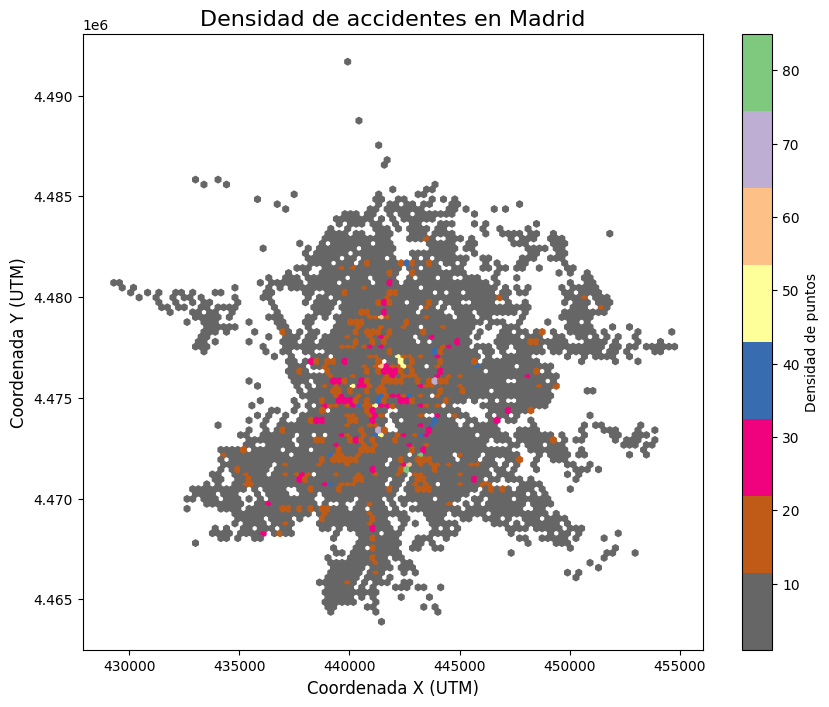

In [741]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.hexbin(
    agrupado_por_accidente['coordenada_x_utm'], 
    agrupado_por_accidente['coordenada_y_utm'], 
    gridsize=100, 
    cmap='Accent_r',  
    mincnt=1  
)


plt.title('Densidad de accidentes en Madrid', fontsize=16)
plt.xlabel('Coordenada X (UTM)', fontsize=12)
plt.ylabel('Coordenada Y (UTM)', fontsize=12)

cb = plt.colorbar(label='Densidad de puntos')

plt.show()


En este mapa cada punto representa un accidente y vemos un poco por donde están mayormente distribuidos. Como es normal y asumible, por el centro se acumulan más accidentes, sin embargo, podemos observar como se concentran más accidentes por la zona sur del centro que por la zona norte.  
Encontramos un par de puntos verdes en el sur (los puntos verdes representan una gran concentración de accidentes) que a priori parecen ser los lugares donde más accidentes se concentran.

### Accidentes por mes

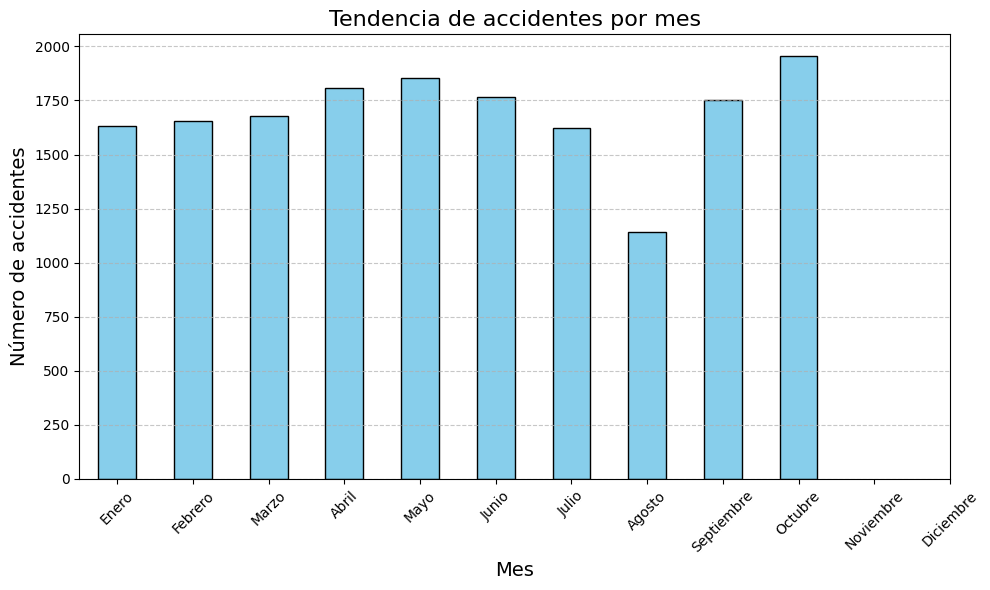

In [742]:
import matplotlib.pyplot as plt

accidentes_por_mes = agrupado_por_accidente['mes'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
accidentes_por_mes.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("Tendencia de accidentes por mes", fontsize=16)
plt.xlabel("Mes", fontsize=14)
plt.ylabel("Número de accidentes", fontsize=14)
plt.xticks(range(12), [
    'Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 
    'Julio', 'Agosto', 'Septiembre', 'Octubre', 'Noviembre', 'Diciembre'
], rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Estudiando los accidentes por mes, vemos como en agosto se reducen drásticamente. Esto se debe a que mucha gente de Madrid se va de vacaciones y abandona la comunidad. Por eso en septiembre, cuando la gente vuelve de vacaciones, se produce un aumento en los accidentes volviendo a la tendencia de meses anteriores.  

### Accidentes en función del distrito

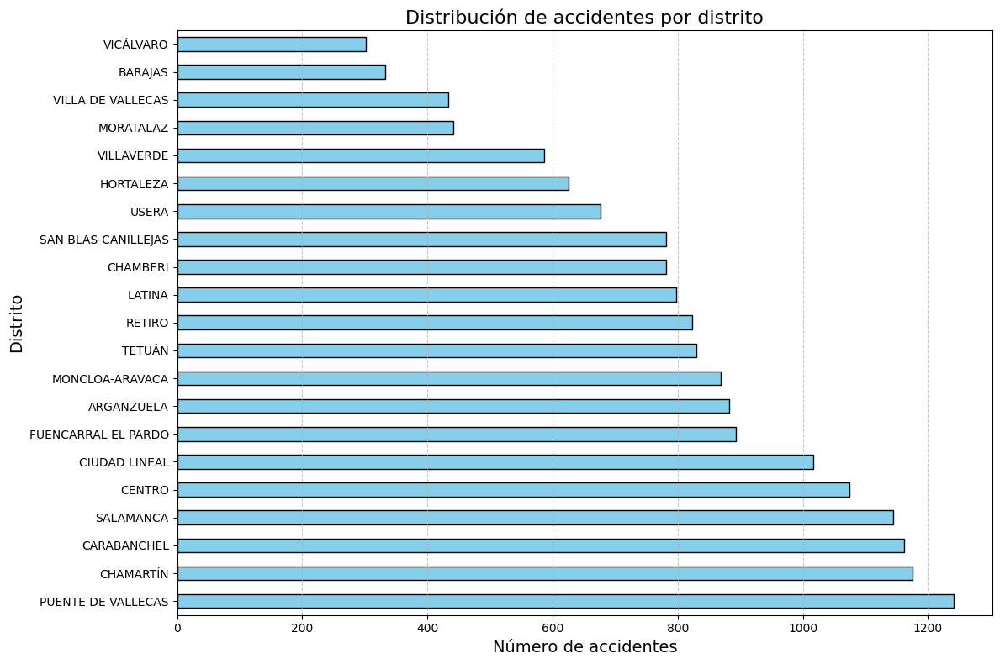

In [743]:
accidentes_por_distrito = agrupado_por_accidente['distrito'].value_counts()

plt.figure(figsize=(12, 8))
accidentes_por_distrito.plot(kind='barh', color='skyblue', edgecolor='black')
plt.title("Distribución de accidentes por distrito", fontsize=16)
plt.xlabel("Número de accidentes", fontsize=14)
plt.ylabel("Distrito", fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Al analizar cómo se han repartido los accidentes por distrito, vemos que Puente de Vallecas encabeza la clasificación (probablemente sea donde hemos visto los dos puntos verdes en el mapa de Madrid). Seguido puente de Vallecas encontramos varios distritos más céntricos y quizá tirando un pelín al norte como (Chamartín, Salamanca o el centro).

### Accidentes segun el momento del dia

C:\Users\nacho\AppData\Local\Temp\ipykernel_3592\298854272.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=accidentes_por_rango.index, y=accidentes_por_rango.values, palette='Blues_d')


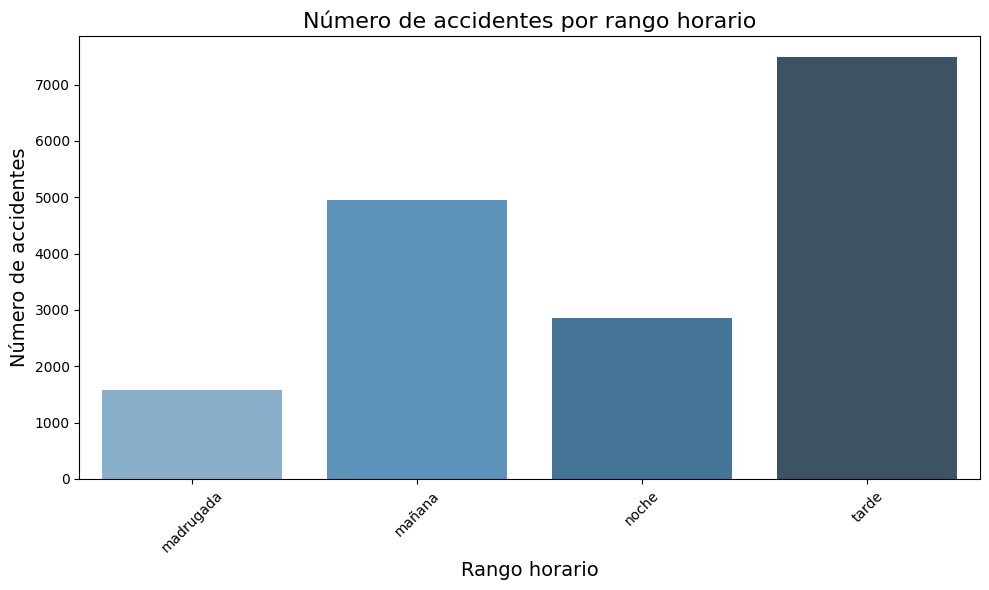

In [744]:
import matplotlib.pyplot as plt
import seaborn as sns
accidentes_por_rango = agrupado_por_accidente['rango_horario'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidentes_por_rango.index, y=accidentes_por_rango.values, palette='Blues_d')
plt.title('Número de accidentes por rango horario', fontsize=16)
plt.xlabel('Rango horario', fontsize=14)
plt.ylabel('Número de accidentes', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Con esta gráfica podemos observar cómo ha afectado el momento del día en los accidentes de 2024. Como es de esperar, la mayoría han sido por la tarde y por la mañana, ya que son las franjas horarias con mayor tráfico.

### Accidentes segun las condiciones meteorológicas

C:\Users\nacho\AppData\Local\Temp\ipykernel_3592\3894552759.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=accidentes_por_estado_meteorologico.index, y=accidentes_por_estado_meteorologico.values, palette='viridis')


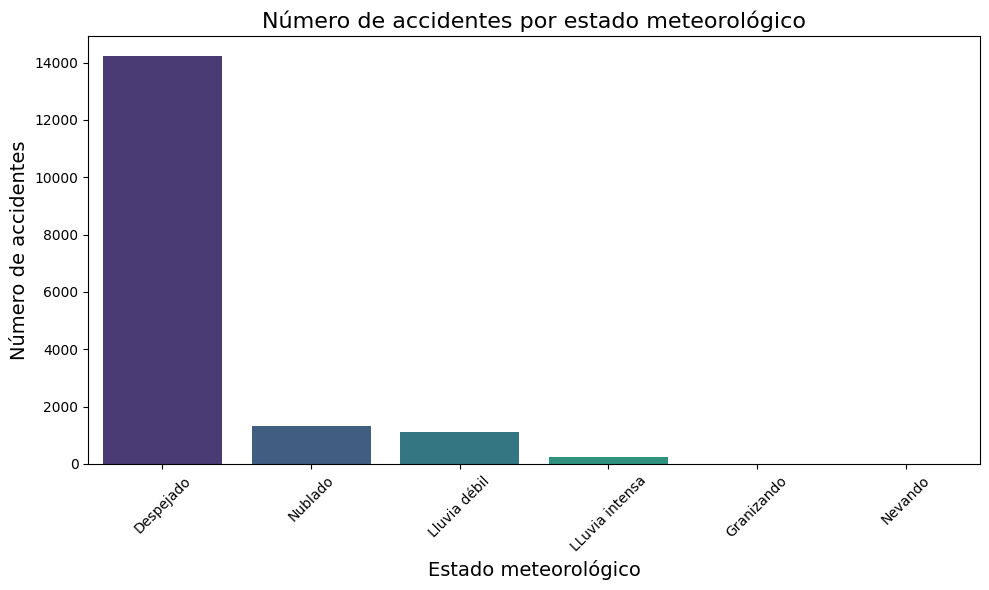

In [745]:
accidentes_por_estado_meteorologico = agrupado_por_accidente['estado_meteorológico'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidentes_por_estado_meteorologico.index, y=accidentes_por_estado_meteorologico.values, palette='viridis')

plt.title('Número de accidentes por estado meteorológico', fontsize=16)
plt.xlabel('Estado meteorológico', fontsize=14)
plt.ylabel('Número de accidentes', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


En este gráfico vemos que los accidentes suelen producirse con el cielo despejado, cuando en Madrid gran parte del año hace un tiempo soleado lo cual no nos aporta gran información. Para ello vamos a relacionar la lesividad del accidente con el estado meteorológico para ver realmente cómo afectan las condiciones climáticas a los accidentes.

### Efecto de las condiciones meteorológicas en la lesividad del accidente

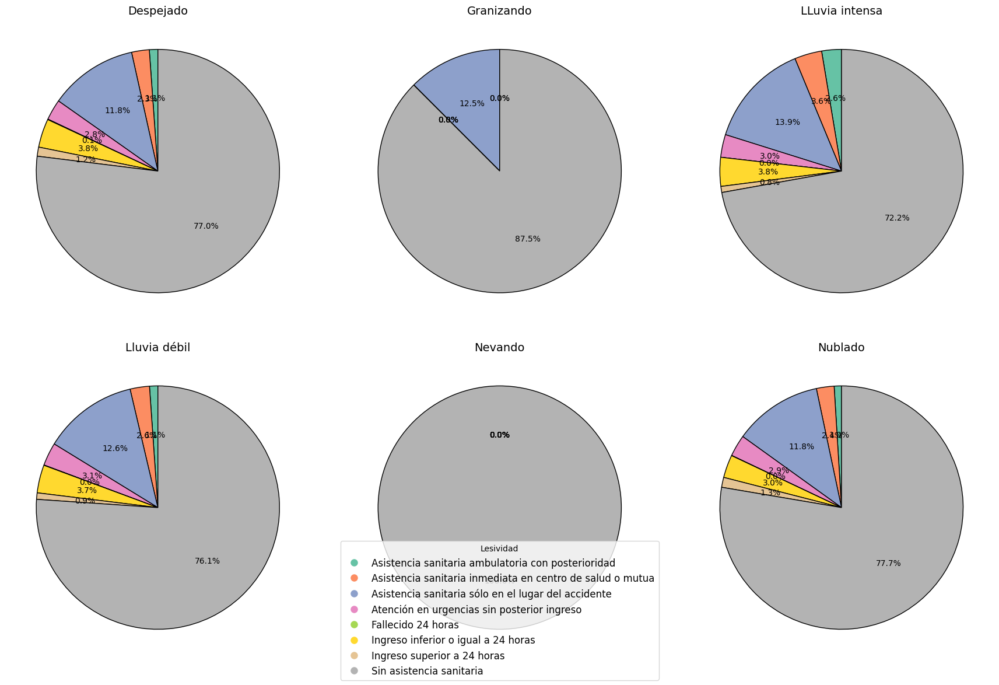

In [746]:
import matplotlib.pyplot as plt
import seaborn as sns

tabla_combinaciones = pd.crosstab(df['estado_meteorológico'], df['lesividad'], normalize='index') * 100

n_filas = (len(tabla_combinaciones) // 3) + (len(tabla_combinaciones) % 3 > 0)  

fig, axes = plt.subplots(nrows=n_filas, ncols=3, figsize=(18, n_filas * 6))
axes = axes.flatten() 

colores = sns.color_palette("Set2", len(tabla_combinaciones.columns))

for i, (estado, row) in enumerate(tabla_combinaciones.iterrows()):
    ax = axes[i]
    wedges, _, _ = ax.pie(row, autopct='%1.1f%%', startangle=90, colors=colores, wedgeprops={'linewidth': 1, 'edgecolor': 'black'})
    ax.set_title(estado, fontsize=14)
    ax.set_ylabel('')  
    ax.set_xlabel('')  

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colores[i], markersize=10) for i in range(len(tabla_combinaciones.columns))]
fig.legend(handles, tabla_combinaciones.columns, title="Lesividad", loc="lower center", fontsize=12)

plt.tight_layout(pad=3.0)
plt.show()


Vemos cómo cuando hay lluvia intensa hay más tendencia a que una persona implicada en el accidente necesite asistencia sanitaria (alrededor de un 28%) que cuando el cielo está despejado(alrededor de un 77%). Respecto a los datos cuando nieva o cuando está granizando no podemos dar muchas explicaciones ya que no tenemos suficientes ejemplos. Esto se puede deber a dos cosas:
- 1. Que en la Comunidad de Madrid nieva y graniza muy poco y por eso faltan datos.
- 2. Que cuando las condiciones meteorológicas son peores, los conductores son más prudentes y prestan más atención a la conducción.

A continuación, vamos a eliminar los datos donde no hay asistencia sanitaria para ver mejor la gravedad de los accidentes cuando ha sido necesario asistencia médica.


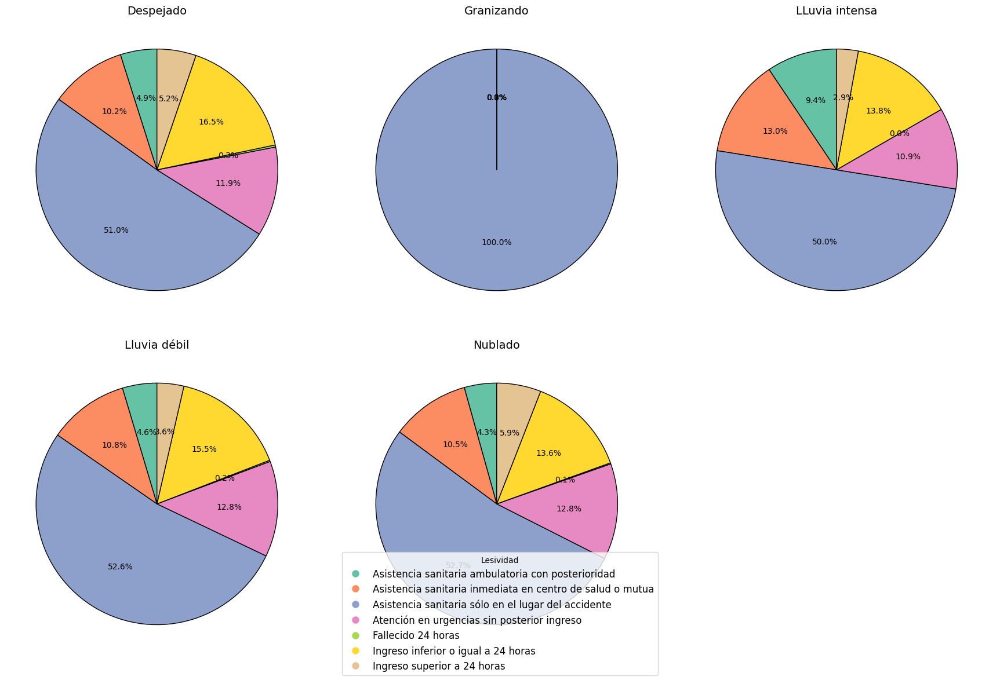

In [747]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


df_filtrado = df[df['lesividad'] != 'Sin asistencia sanitaria']

tabla_combinaciones = pd.crosstab(df_filtrado['estado_meteorológico'], df_filtrado['lesividad'], normalize='index') * 100

n_filas = (len(tabla_combinaciones) // 3) + (len(tabla_combinaciones) % 3 > 0)

fig, axes = plt.subplots(nrows=n_filas, ncols=3, figsize=(18, n_filas * 6))
axes = axes.flatten()  # Aplanamos los ejes para facilitar el acceso

colores = sns.color_palette("Set2", len(tabla_combinaciones.columns))

for i, (estado, row) in enumerate(tabla_combinaciones.iterrows()):
    ax = axes[i]
    wedges, _, _ = ax.pie(
        row,
        autopct='%1.1f%%',
        startangle=90,
        colors=colores,
        wedgeprops={'linewidth': 1, 'edgecolor': 'black'}
    )
    ax.set_title(estado, fontsize=14)
    ax.set_ylabel('') 
    ax.set_xlabel('')  

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colores[i], markersize=10) 
    for i in range(len(tabla_combinaciones.columns))
]
fig.legend(handles, tabla_combinaciones.columns, title="Lesividad", loc="lower center", fontsize=12)

plt.tight_layout(pad=3.0)
plt.show()


Vemos como en la mayoría de los casos la asistencia sanitaria se realiza en el lugar del accidente sin necesidad de acudiar a ningún hospital o centro de salud cercano. Vamos a mapear la función como indica el pdf de las instrucciones de los datos, asignando las variables LEVE, GRAVE y FALECIDO a cada grado de lesividad. Para observar mejor las proporciones, vamos a eliminar las filas donde la asistencia sanitaria es requerida sólo en el lugar del accidente.

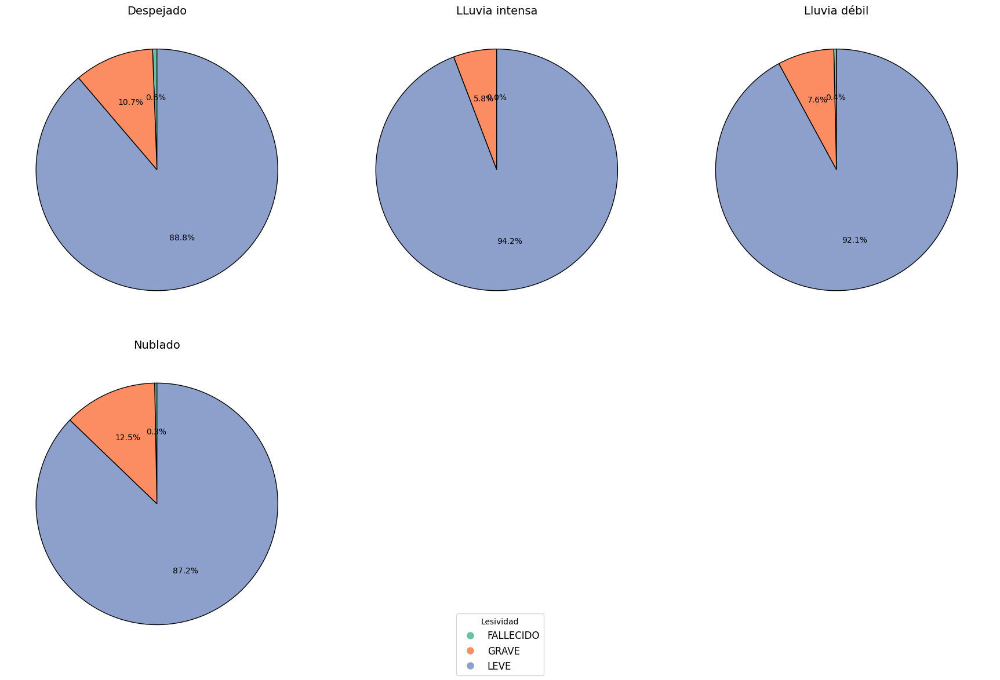

In [748]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

lesividad_map = {
    'Atención en urgencias sin posterior ingreso': 'LEVE',
    'Ingreso inferior o igual a 24 horas': 'LEVE',
    'Ingreso superior a 24 horas': 'GRAVE',
    'Fallecido 24 horas': 'FALLECIDO',
    'Asistencia sanitaria ambulatoria con posterioridad': 'LEVE',
    'Asistencia sanitaria inmediata en centro de salud o mutua': 'LEVE'
}

df_filtrado = df[
    ~df['lesividad'].isin(['Sin asistencia sanitaria', 'Asistencia sanitaria sólo en el lugar del accidente'])
].copy()

df_filtrado['lesividad'] = df_filtrado['lesividad'].map(lesividad_map)

tabla_combinaciones = pd.crosstab(df_filtrado['estado_meteorológico'], df_filtrado['lesividad'], normalize='index') * 100

n_filas = (len(tabla_combinaciones) // 3) + (len(tabla_combinaciones) % 3 > 0)

fig, axes = plt.subplots(nrows=n_filas, ncols=3, figsize=(18, n_filas * 6))
axes = axes.flatten() 

colores = sns.color_palette("Set2", len(tabla_combinaciones.columns))

for i, (estado, row) in enumerate(tabla_combinaciones.iterrows()):
    ax = axes[i]
    wedges, _, _ = ax.pie(
        row,
        autopct='%1.1f%%',
        startangle=90,
        colors=colores,
        wedgeprops={'linewidth': 1, 'edgecolor': 'black'}
    )
    ax.set_title(estado, fontsize=14)
    ax.set_ylabel('')
    ax.set_xlabel('') 

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colores[i], markersize=10) 
    for i in range(len(tabla_combinaciones.columns))
]
fig.legend(handles, tabla_combinaciones.columns, title="Lesividad", loc="lower center", fontsize=12)

plt.tight_layout(pad=3.0)
plt.show()


Aquí podemos observar cómo las personas implicadas en los accidentes tienen mayor tendencia de sufrir consecuencias graves cuando hay niebla. Sin embargo, cuando el cielo está despejado hay mayor riesgo de que el accidente sea grave que con lluvia intensa y lluvia débil.  
Esto se debe seguramente a que cuando el tiempo es bueno, los conductores van más confiados y circulan a una velocidad mayor lo que hace que aumente el riesgo de accidentes más graves.  
De hecho, cuando la lluvia es intensa, ha habido menos accidentes graves que cuando la lluvia es débil ya que con la lluvia intensa hay más prudencia al volante.

### Lesividad del accidente en función del tipo de persona

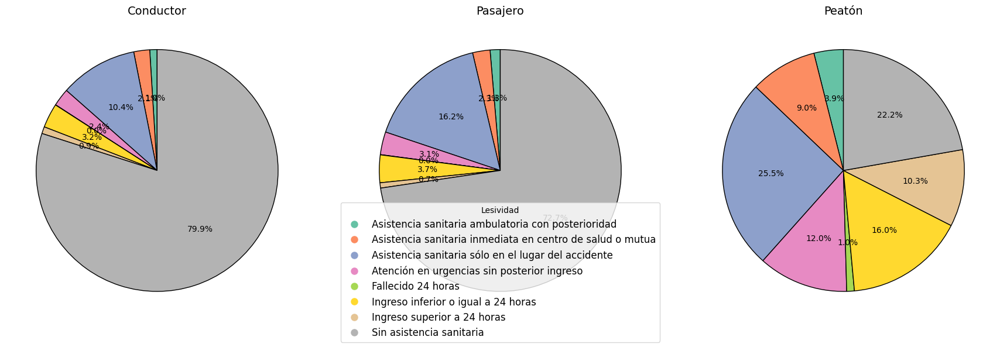

In [749]:
import matplotlib.pyplot as plt
import seaborn as sns

tabla_combinaciones = pd.crosstab(df['tipo_persona'], df['lesividad'], normalize='index') * 100

n_filas = (len(tabla_combinaciones) // 3) + (len(tabla_combinaciones) % 3 > 0)  

fig, axes = plt.subplots(nrows=n_filas, ncols=3, figsize=(18, n_filas * 6))
axes = axes.flatten()  

colores = sns.color_palette("Set2", len(tabla_combinaciones.columns))

for i, (estado, row) in enumerate(tabla_combinaciones.iterrows()):
    ax = axes[i]
    wedges, _, _ = ax.pie(row, autopct='%1.1f%%', startangle=90, colors=colores, wedgeprops={'linewidth': 1, 'edgecolor': 'black'})
    ax.set_title(estado, fontsize=14)
    ax.set_ylabel('')  
    ax.set_xlabel('')  

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colores[i], markersize=10) for i in range(len(tabla_combinaciones.columns))]
fig.legend(handles, tabla_combinaciones.columns, title="Lesividad", loc="lower center", fontsize=12)

plt.tight_layout(pad=3.0)
plt.show()


En este gráfico podemos ver cómo los peatones son los más perjudicados cuando ocurre algún accidente. El peatón es el elemento de la vía más vulnerable en caso de accidente y tan sólo en el 22,2% de los casos no ha sido necesario la atención sanitaria.

### lesividad del accidente en función del tipo de vehiculo

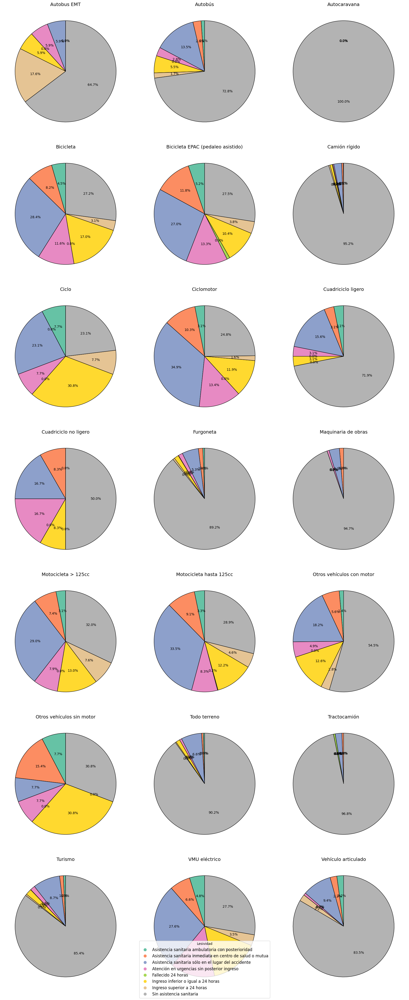

In [750]:
import matplotlib.pyplot as plt
import seaborn as sns

tabla_combinaciones = pd.crosstab(df['tipo_vehiculo'], df['lesividad'], normalize='index') * 100

n_filas = (len(tabla_combinaciones) // 3) + (len(tabla_combinaciones) % 3 > 0)  # Ajuste a 3 columnas como máximo

fig, axes = plt.subplots(nrows=n_filas, ncols=3, figsize=(18, n_filas * 6))
axes = axes.flatten()  

colores = sns.color_palette("Set2", len(tabla_combinaciones.columns))

for i, (estado, row) in enumerate(tabla_combinaciones.iterrows()):
    ax = axes[i]
    wedges, _, _ = ax.pie(row, autopct='%1.1f%%', startangle=90, colors=colores, wedgeprops={'linewidth': 1, 'edgecolor': 'black'})
    ax.set_title(estado, fontsize=14)
    ax.set_ylabel('')  
    ax.set_xlabel('') 

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colores[i], markersize=10) for i in range(len(tabla_combinaciones.columns))]
fig.legend(handles, tabla_combinaciones.columns, title="Lesividad", loc="lower center", fontsize=12)

plt.tight_layout(pad=3.0)
plt.show()


Analizando la gravedad de los accidentes en función del tipo de vehículo vemos como vehículos de dos ruedas como la bicicleta o las motos. Además, con vehículos de movilidad personal o cuadriciclos también hay un riesgo alto de necesitar asistencia sanitaria.
Una de las observaciones que más nos ha llamado la atención es el gráfico del autobús de la EMT. El porcentaje de ingreso mayor a 24 horas (GRAVE) es altísimo en comparación con muchos otros vehículos. Esto seguramente se deba a que en este tipo de autobuses, los pasajeros muchas veces están de pie agarrados a una barra sin sujeción. Un choque puede causar graves consecuencias en alguien que no está atado al autobús. 
Por otro lado, vehículos como los camiones, furgonetas, maquinaria de obras,... incluso los turismos, son muy seguros y en la mayor parte de los casos no se necesita ningún tipo de asistencia sanitaria.

Una vez estudiado a fondo nuestros datos, vamos a pegar un último repaso a las columnas que nos han quedado. 

In [751]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39691 entries, 0 to 40164
Data columns (total 43 columns):
 #   Column                                                       Non-Null Count  Dtype         
---  ------                                                       --------------  -----         
 0   num_expediente                                               39691 non-null  object        
 1   fecha                                                        39691 non-null  datetime64[ns]
 2   hora                                                         39691 non-null  object        
 3   localizacion                                                 39691 non-null  object        
 4   numero                                                       34484 non-null  float64       
 5   cod_distrito                                                 39691 non-null  int64         
 6   distrito                                                     39691 non-null  object        
 7   tipo_accidente    

In [752]:
df.isna().sum()

num_expediente                                                    0
fecha                                                             0
hora                                                              0
localizacion                                                      0
numero                                                         5207
cod_distrito                                                      0
distrito                                                          0
tipo_accidente                                                    0
estado_meteorológico                                              0
tipo_vehiculo                                                     0
tipo_persona                                                      0
rango_edad                                                        0
sexo                                                              0
cod_lesividad                                                     0
lesividad                                       

In [753]:
nulos_numeros = df['numero'][df['numero'].isna()]

In [754]:
nulos_numeros.shape[0]/df.shape[0] * 100

13.11884306265904

Vemos como los NaN de la columna 'número' suponen un 13% de las filas del dataset. Nos parece un poco arriesgado deshacernos de más de 5000 filas por una columna que no aporta gran información ya que tenemos la calle y la localización por lo que el número en cierta parte es irrelevante. Por eso hemos decidido eliminar la columna 'número' por completo.

In [755]:
df = df.drop('numero', axis=1)

In [756]:
df.num_expediente.nunique()

16869

In [757]:
df.columns

Index(['num_expediente', 'fecha', 'hora', 'localizacion', 'cod_distrito',
       'distrito', 'tipo_accidente', 'estado_meteorológico', 'tipo_vehiculo',
       'tipo_persona', 'rango_edad', 'sexo', 'cod_lesividad', 'lesividad',
       'coordenada_x_utm', 'coordenada_y_utm', 'positiva_alcohol',
       'positiva_droga', 'año', 'mes', 'dia_semana', 'es_fin_semana',
       'rango_horario', 'rango_horario_cod', 'calle_1', 'calle_2',
       'calle_1_cod', 'calle_2_cod', 'es_cruce', 'tipo_accidente_Alcance',
       'tipo_accidente_Atropello a persona', 'tipo_accidente_Caída',
       'tipo_accidente_Choque contra obstáculo o elemento de la vía',
       'tipo_accidente_Colisión doble', 'tipo_accidente_Colisión múltiple',
       'tipo_accidente_Otras causas', 'tipo_accidente_Vuelco',
       'tipo_persona_Conductor', 'tipo_persona_Pasajero',
       'tipo_persona_Peatón', 'rango_edad_cod', 'sexo_cod'],
      dtype='object')

Vamos a transformar las variables temporales para hacerlas cíclicas, de forma que algoritmos como kmeans, dbscan, etc... puedan trabajar mejor con las distancias.

In [758]:
df['dia_semana_sin'] = np.sin(2 * np.pi * df['dia_semana'] / 7)
df['dia_semana_cos'] = np.cos(2 * np.pi * df['dia_semana'] / 7)

df['rango_horario_sin'] = np.sin(2 * np.pi * df['rango_horario_cod'] / 4)
df['rango_horario_cos'] = np.cos(2 * np.pi * df['rango_horario_cod'] / 4)

In [759]:
df = df.drop(columns=['dia_semana', "rango_horario_cod", 'cod_lesividad', 'cod_distrito'])

encoded_columns = pd.get_dummies(df[["distrito", "estado_meteorológico", 
                                     "tipo_vehiculo", "rango_edad", "lesividad"]],
                                 drop_first=False)

df = pd.concat([df, encoded_columns], axis=1)

In [760]:
df = df.applymap(lambda x: int(x) if isinstance(x, bool) else x)

C:\Users\nacho\AppData\Local\Temp\ipykernel_3592\2139924168.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: int(x) if isinstance(x, bool) else x)


Aquí guardamos nuestro dataframe final para utilizarlo en el resto de notebooks

In [761]:
df.to_csv('data_processed.csv', index=False)

# Aplicación de algoritmos de clustering jerárquico

#### 2.1 Aplica al menos 2 algoritmos de clustering jerárquico sobre el dataset proporcionado, probando y evaluando los efectos de la distancia utilizada (euclídea, coseno…). 

Vamos a crear un DataFrame X con solo las columnas numéricas de df

In [104]:
X = df.select_dtypes(include=['number'])

In [105]:
X

,coordenada_x_utm,coordenada_y_utm,positiva_alcohol,positiva_droga,año,mes,es_fin_semana,calle_1_cod,calle_2_cod,es_cruce,...,rango_edad_Menor de 5 años,rango_edad_Más de 74 años,cod_lesividad_1.0,cod_lesividad_2.0,cod_lesividad_3.0,cod_lesividad_4.0,cod_lesividad_5.0,cod_lesividad_6.0,cod_lesividad_7.0,cod_lesividad_14.0
0,444913.0,4481427.0,0,0.0,2024,1,0,1886,151,1,...,0,0,0,1,0,0,0,0,0,0
1,444913.0,4481427.0,0,0.0,2024,1,0,1886,151,1,...,0,0,0,0,0,0,0,0,0,1
2,440123.0,4475170.0,0,0.0,2024,2,0,8867,6929,1,...,0,0,0,0,0,0,0,0,1,0
3,440123.0,4475170.0,0,0.0,2024,2,0,8867,6929,1,...,0,0,0,0,0,0,0,0,0,1
4,440137.0,4475721.0,0,0.0,2024,2,1,9995,8236,1,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40160,441447.0,4478230.0,0,0.0,2024,10,0,10937,1420,1,...,0,0,0,0,0,0,0,0,0,1
40161,439269.0,4475805.0,0,0.0,2024,10,0,7712,2455,1,...,0,0,0,0,0,0,0,0,0,1
40162,439269.0,4475805.0,0,0.0,2024,10,0,7712,2455,1,...,0,0,0,0,0,0,0,0,0,1
40163,439269.0,4475805.0,0,0.0,2024,10,0,7712,2455,1,...,0,0,0,0,0,0,0,0,0,1


A continuación, normalizamos los datos de X para evitar que las variables con mayor rango dominen la distancia. Tenemos que tener en cuenta que las columnas en su forma coseno que hemos añadido anteriormente no hace falta escalarlas (dia_semana y rango_horario).

In [106]:
from sklearn.preprocessing import MinMaxScaler

numeric_cols = X.select_dtypes(include=[np.number])
binary_cols = numeric_cols.columns[numeric_cols.nunique() == 2]


excluded_cols = ["dia_semana_sin", "dia_semana_cos", "rango_horario_sin", "rango_horario_cos"]

# Escalamos las columnas que no sean ni binarias ni de forma seno/coseno
cols_to_scale = numeric_cols.columns.difference(binary_cols).difference(excluded_cols)

scaler = MinMaxScaler()
X_scaled = X.copy()
X_scaled[cols_to_scale] = scaler.fit_transform(X_scaled[cols_to_scale])

Antes de aplicar algoritmos de clustering, vamos a tratar de visualizar nuestros datos para ver cómo se pueden agrupar. Para ello, utilizamos PCA para reducir el dataset a 2 dimensiones.

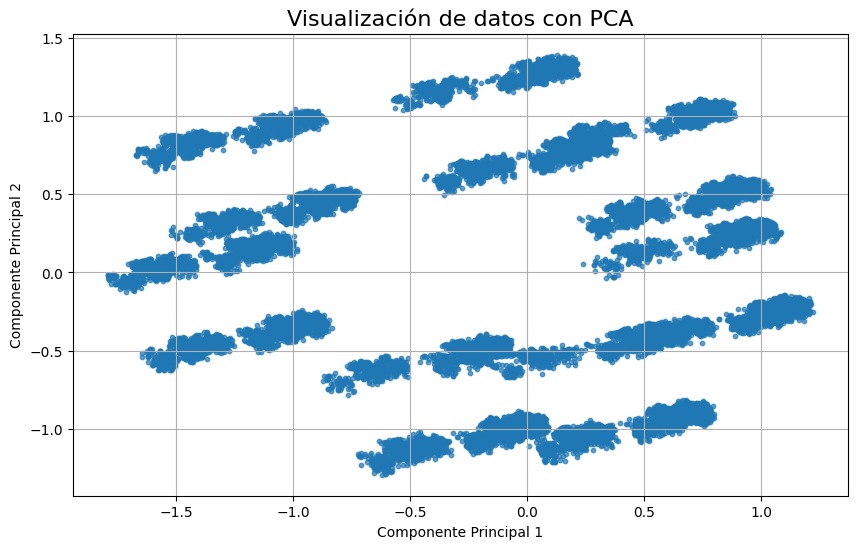

In [107]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2) 
X_2d = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], s=10, alpha=0.7)
plt.title("Visualización de datos con PCA", fontsize=16)
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.grid(True)
plt.show()


Para que el código no tarde demasiado ya que son 100 columnas, vamos a reducir la dimensión de nuestro dataset. Vamos a utilizar PCA y nos quedamos con el 95 % de la variabilidad del DataFrame.

In [108]:
pca = PCA(n_components=0.95)  # Mantenemos el 95% de la variabilidad
X_pca = pca.fit_transform(X_scaled)

print(f"Forma original: {X.shape}")
print(f"Forma reducida: {X_pca.shape}")

Forma original: (39691, 100)
Forma reducida: (39691, 55)


### AglomerativeClustering

Vamos a aplicar AgglomerartiveClustering con las métricas: euclidean, cosine, manhattan, l1, l2.  
Graficaremos los resultados para ver de una forma más fácil cómo afectan las métricas a la agrupación de los datos.

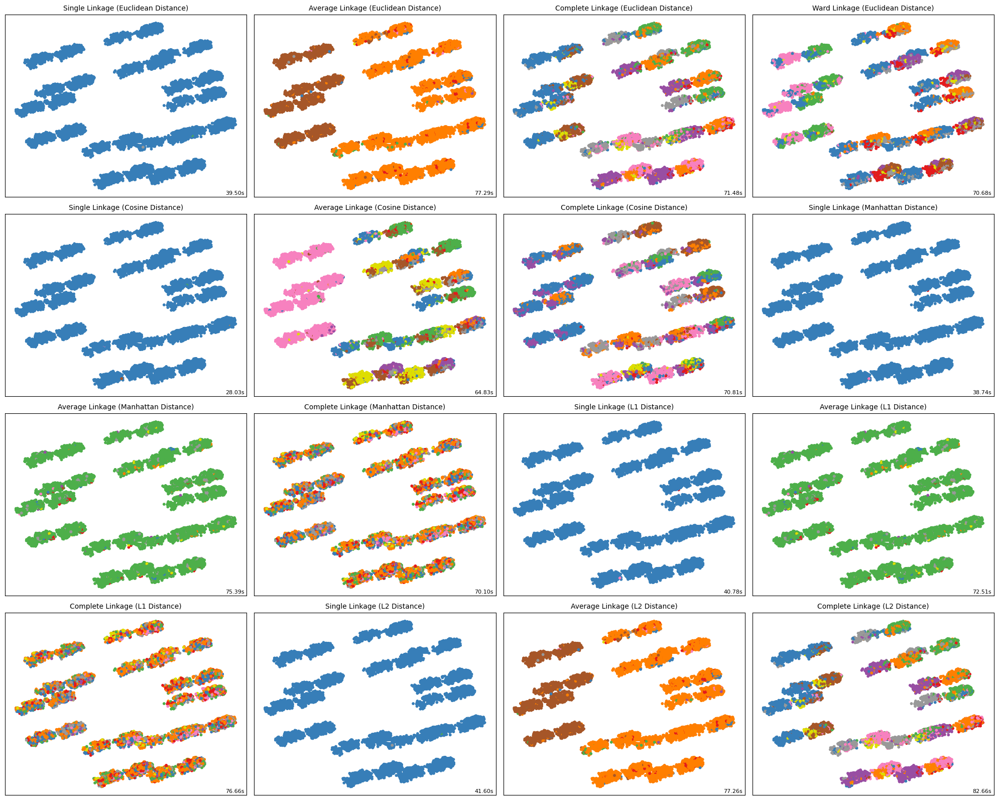

In [111]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from itertools import cycle, islice
import warnings
import time

n_clusters = 10
distance_metrics = ["euclidean", "cosine", "manhattan", "l1", "l2"]
linkages = ["single", "average", "complete", "ward"]

plt.figure(figsize=(20, len(linkages) * 5))

plot_idx = 1
for metric in distance_metrics:
    for linkage in linkages:
        if linkage == "ward" and metric != "euclidean":
            # Ward solo soporta la métrica euclidiana
            continue
        
        name = f"{linkage.capitalize()} Linkage ({metric.capitalize()} Distance)"
        
        clustering = AgglomerativeClustering(
            n_clusters=n_clusters,
            linkage=linkage,
            metric=metric,
        )
        
        t0 = time.time()
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the connectivity matrix",
                category=UserWarning,
            )
            clustering.fit(X_pca)
        t1 = time.time()
        y_pred = clustering.labels_.astype(int)

        plt.subplot(len(distance_metrics), len(linkages), plot_idx)
        plt.title(name, size=10)
        
        # Colores
        colors = np.array(
            list(
                islice(
                    cycle(
                        [
                            "#377eb8",
                            "#ff7f00",
                            "#4daf4a",
                            "#f781bf",
                            "#a65628",
                            "#984ea3",
                            "#999999",
                            "#e41a1c",
                            "#dede00",
                        ]
                    ),
                    int(max(y_pred) + 1),
                )
            )
        )
        plt.scatter(X_2d[:, 0], X_2d[:, 1], s=10, color=colors[y_pred])
        plt.xticks(())
        plt.yticks(())
        plt.text(
            0.99,
            0.01,
            ("%.2fs" % (t1 - t0)).lstrip("0"),
            transform=plt.gca().transAxes,
            size=8,
            horizontalalignment="right",
        )
        
        plot_idx += 1

plt.tight_layout()
plt.show()


Si nos damos cuenta, el clustering realizado con la métrica L1 es muy parecido (por no decir casi idéntico) al clustering realizado con la distancia de manhattan. Esto mismo ocurre con L2 y la distancia euclídea.  Esto se debe a que la distancia L1 es, por definición, la suma de las diferencias absolutas entre las coordenadas de los puntos, lo que corresponde a la distancia Manhattan, mientras que la distancia L2 calcula la raíz cuadrada de la suma de los cuadrados de las diferencias, que es la distancia euclídea. Debido a estas equivalencias, los dendrogramas resultantes muestran una estructura similar en términos de cómo se agrupan los puntos.  

Ahora, vamos a evaluar con índices de calidad cada una de las distancias y comparar resultados.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from itertools import cycle, islice
import warnings
import time
import pandas as pd

n_clusters = 10
distance_metrics = ["euclidean", "cosine", "manhattan"]
linkages = ["single", "average", "complete", "ward"]

results = []

plt.figure(figsize=(20, len(linkages) * 5))

plot_idx = 1
for metric in distance_metrics:
    for linkage in linkages:
        if linkage == "ward" and metric != "euclidean":
            continue  # Ward solo soporta euclidean
        
        name = f"{linkage.capitalize()} Linkage ({metric.capitalize()} Distance)"
        
        clustering = AgglomerativeClustering(
            n_clusters=n_clusters,
            linkage=linkage,
            metric=metric,
        )
        
        t0 = time.time()
        with warnings.catch_warnings():
            warnings.filterwarnings(
                "ignore",
                message="the number of connected components of the connectivity matrix",
                category=UserWarning,
            )
            clustering.fit(X_pca)
        t1 = time.time()
        y_pred = clustering.labels_.astype(int)

        silhouette = silhouette_score(X_pca, y_pred) if len(np.unique(y_pred)) > 1 else np.nan
        calinski = calinski_harabasz_score(X_pca, y_pred) if len(np.unique(y_pred)) > 1 else np.nan
        davies = davies_bouldin_score(X_pca, y_pred) if len(np.unique(y_pred)) > 1 else np.nan
        
        results.append({
            "Metric": metric,
            "Linkage": linkage,
            "Time (s)": t1 - t0,
            "Silhouette": silhouette,
            "Calinski-Harabasz": calinski,
            "Davies-Bouldin": davies,
        })

In [781]:
df_results = pd.DataFrame(results)

In [785]:
df_results

,Metric,Linkage,Time (s),Silhouette,Calinski-Harabasz,Davies-Bouldin
0,euclidean,single,57.600439,0.019704,1.689552,0.770186
1,euclidean,average,185.153580,0.034547,406.263820,2.592987
2,euclidean,complete,156.732489,0.030678,931.832858,3.718638
3,euclidean,ward,158.671265,0.042336,1180.652864,3.231827
4,cosine,single,61.124115,-0.100048,1.233233,0.912685
5,cosine,average,135.616617,0.035299,1166.794972,3.058628
6,cosine,complete,146.386522,0.018791,995.431124,4.086613
7,manhattan,single,59.681377,0.006624,1.642110,0.781190
8,manhattan,average,143.942468,0.018226,86.437892,3.040511
9,manhattan,complete,135.629528,-0.006208,205.924290,6.755255


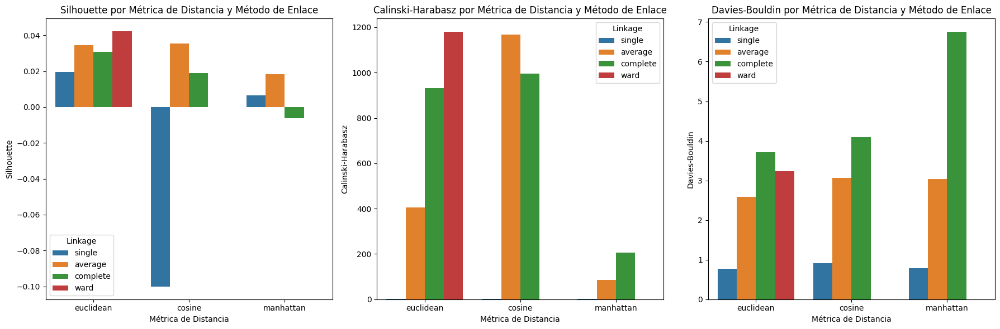

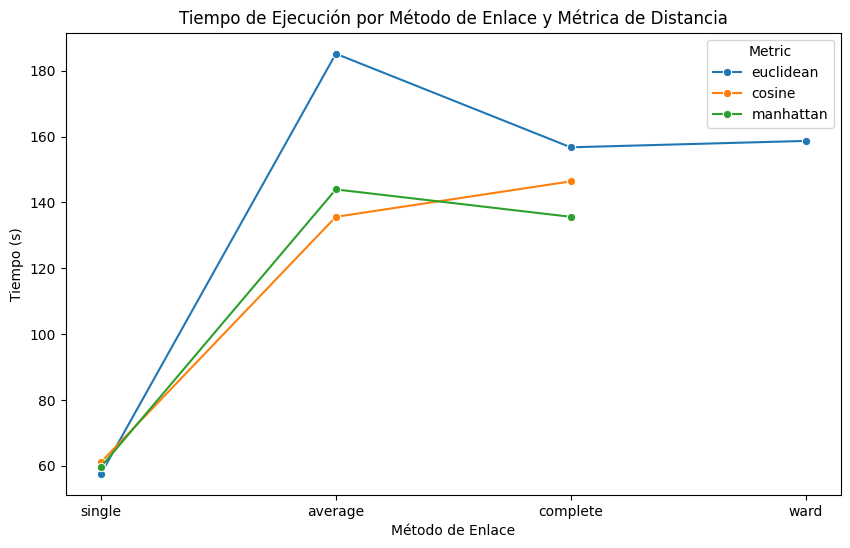

In [787]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

metrics = ['Silhouette', 'Calinski-Harabasz', 'Davies-Bouldin']
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, metric in enumerate(metrics):
    sns.barplot(x='Metric', y=metric, hue='Linkage', data=df_results, ax=axes[i])
    axes[i].set_title(f'{metric} por Métrica de Distancia y Método de Enlace')
    axes[i].set_xlabel('Métrica de Distancia')
    axes[i].set_ylabel(metric)

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.lineplot(x='Linkage', y='Time (s)', hue='Metric', data=df_results, marker='o')
plt.title("Tiempo de Ejecución por Método de Enlace y Métrica de Distancia")
plt.xlabel("Método de Enlace")
plt.ylabel("Tiempo (s)")
plt.show()


In [802]:
print("Mejores combinaciones por métrica:")
print("Silhouette:")
print(df_results.loc[df_results["Silhouette"].idxmax()])
print("\nCalinski-Harabasz:")
print(df_results.loc[df_results["Calinski-Harabasz"].idxmax()])
print("\nDavies-Bouldin:")
print(df_results.loc[df_results["Davies-Bouldin"].idxmin()])

Mejores combinaciones por métrica:
Silhouette:
Metric                 euclidean
Linkage                     ward
Time (s)              158.671265
Silhouette              0.042336
Calinski-Harabasz    1180.652864
Davies-Bouldin          3.231827
Name: 3, dtype: object

Calinski-Harabasz:
Metric                 euclidean
Linkage                     ward
Time (s)              158.671265
Silhouette              0.042336
Calinski-Harabasz    1180.652864
Davies-Bouldin          3.231827
Name: 3, dtype: object

Davies-Bouldin:
Metric               euclidean
Linkage                 single
Time (s)             57.600439
Silhouette            0.019704
Calinski-Harabasz     1.689552
Davies-Bouldin        0.770186
Name: 0, dtype: object


**Distancia Euclídea:** Basándonos en Silhouette, produce los mejores resultados cuando agrupamos nuestros datos en 10 clusters. Los mejores métodos de enlace son ward (método específico de esta distancia) y average, mientras que el método single tiene un rendimiento muy inferior al resto. Por último, hay que decir que es la distancia con mayor tiempo de ejecución.

**Distancia Manhattan:** El método de enlace que parece que tiene un mejor rendimiento con esta distancia, es average. Los resultados son ligeramente peores que con las otras dos métricas, aunque según el índice de Calinski-Harabasz, Manhattan funciona realmente mal.

**Distancia Coseno:** Con el método de enlace single, la distancia coseno no agrupa bien los datos dando lugar a un índice de Silhouette negativo. Sin embargo, el método average funciona bastante bien y logra aproximarse a la distancia euclídea. Además, aplicando los otros índices de evaluación vemos que se asemejan bastante los resultados a la distancia euclídea. Por lo que si queremos agrupar en 10 clusters nuestros datos, la distancia coseno con el método average es una buena opción ya que tarda menos en ejecutarse que la distancia euclídea.



### BIRCH

Con Birch, vamos a analizar los diferentes valores de threshold y n_clusters más óptimos, ya que no le podemos aplicar diferentes distancias como hacemos con AglomerativeClustering.

In [128]:
from sklearn.cluster import Birch
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

threshold_values = [0.5, 1.0, 2.0, 3.0]  
n_clusters_values = [None, 5, 10] 

results_birch = []

for threshold in threshold_values:
    for n_clusters in n_clusters_values:
        if n_clusters is None:
            birch_model = Birch(threshold=threshold)
        else:
            birch_model = Birch(threshold=threshold, n_clusters=n_clusters)
        
        birch_model.fit(X_pca)
        y_pred = birch_model.labels_
        
        if len(np.unique(y_pred)) <= 1:
            continue
        
        silhouette = silhouette_score(X_scaled, y_pred, metric='euclidean')
        calinski = calinski_harabasz_score(X_scaled, y_pred)
        davies = davies_bouldin_score(X_scaled, y_pred)
        
        results_birch.append({
            'Algoritmo': 'BIRCH',
            'Threshold': threshold,
            'N_clusters': n_clusters if n_clusters else None,
            'Silhouette': silhouette,
            'Calinski-Harabasz': calinski,
            'Davies-Bouldin': davies
        })


C:\Users\nacho\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_birch.py:727: ConvergenceWarning: Number of subclusters found (1) by BIRCH is less than (3). Decrease the threshold.
  warnings.warn(
C:\Users\nacho\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_birch.py:727: ConvergenceWarning: Number of subclusters found (1) by BIRCH is less than (5). Decrease the threshold.
  warnings.warn(
C:\Users\nacho\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_birch.py:727: ConvergenceWarning: Number of subclusters found (1) by BIRCH is less than (10). Decrease the threshold.
  warnings.warn(


Aquí tenemos los resultados con Birch, vamos a graficarlos para entender mejor cómo se distribuyen.

In [804]:
df_results_birch = pd.DataFrame(results_birch)
df_results_birch

,Algoritmo,Threshold,N_clusters,Silhouette,Calinski-Harabasz,Davies-Bouldin
0,BIRCH,0.5,NaN,0.059984,2128.458551,3.431617
1,BIRCH,0.5,5.0,0.048576,1660.903176,3.532950
2,BIRCH,0.5,10.0,0.023215,1090.485945,3.327043
3,BIRCH,1.0,NaN,0.059158,2124.689024,3.425320
4,BIRCH,1.0,5.0,0.050902,1691.980920,3.477478
5,BIRCH,1.0,10.0,0.029707,1134.994724,3.210091
6,BIRCH,2.0,NaN,0.064705,2252.335032,3.357348
7,BIRCH,2.0,5.0,0.062448,1724.935882,3.179569
8,BIRCH,2.0,10.0,0.050145,1189.602364,3.468800


C:\Users\nacho\AppData\Local\Temp\ipykernel_3592\2660502698.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
C:\Users\nacho\AppData\Local\Temp\ipykernel_3592\2660502698.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
C:\Users\nacho\AppData\Local\Temp\ipykernel_3592\2660502698.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


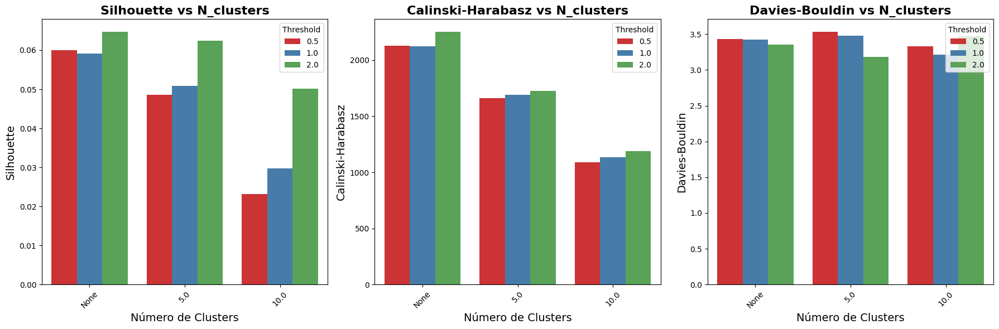

In [810]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

def plot_bar_chart(df, metric, ax, title, ylabel):
    df['N_clusters_str'] = df['N_clusters'].apply(lambda x: str(x) if pd.notna(x) else 'None')
    
    palette = sns.color_palette("Set1", n_colors=df['Threshold'].nunique())  
    sns.barplot(data=df, x='N_clusters_str', y=metric, hue='Threshold', ax=ax, palette=palette)
    
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.set_xlabel('Número de Clusters', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plot_bar_chart(df_results_birch, 'Silhouette', ax[0], 'Silhouette vs N_clusters', 'Silhouette')
plot_bar_chart(df_results_birch, 'Calinski-Harabasz', ax[1], 'Calinski-Harabasz vs N_clusters', 'Calinski-Harabasz')
plot_bar_chart(df_results_birch, 'Davies-Bouldin', ax[2], 'Davies-Bouldin vs N_clusters', 'Davies-Bouldin')

plt.tight_layout()
plt.show()


Podemos observar cómo los mejores resultados surgen cuando no especificamos un valor de n_clusters. Vamos a graficar el mejor modelo de Birch (threshold=2.0, n_clusters=None) para ver cómo agrupa los datos sobre la representación en 2 dimensiones de PCA.


Mejores resultados para BIRCH:
Silhouette: Algoritmo                  BIRCH
Threshold                    2.0
N_clusters                   NaN
Silhouette              0.064705
Calinski-Harabasz    2252.335032
Davies-Bouldin          3.357348
N_clusters_str              None
Name: 6, dtype: object
Calinski-Harabasz: Algoritmo                  BIRCH
Threshold                    2.0
N_clusters                   NaN
Silhouette              0.064705
Calinski-Harabasz    2252.335032
Davies-Bouldin          3.357348
N_clusters_str              None
Name: 6, dtype: object
Davies-Bouldin: Algoritmo                  BIRCH
Threshold                    2.0
N_clusters                   5.0
Silhouette              0.062448
Calinski-Harabasz    1724.935882
Davies-Bouldin          3.179569
N_clusters_str               5.0
Name: 7, dtype: object
nan


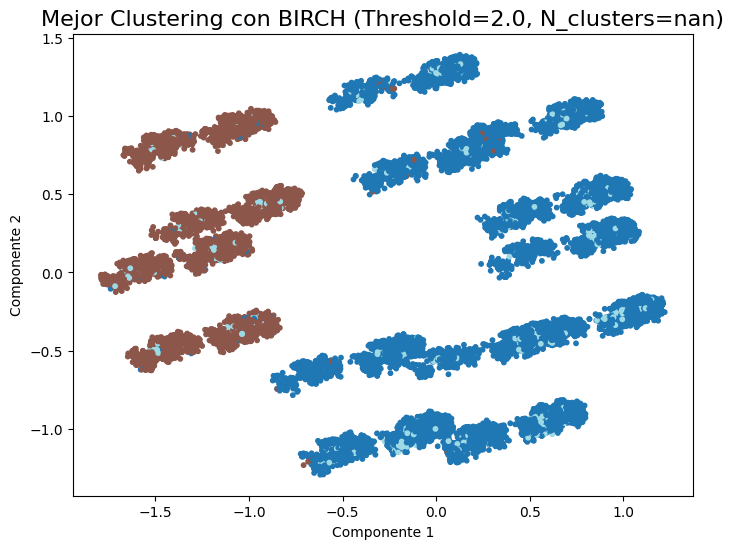

In [811]:
best_silhouette_birch = df_results_birch.loc[df_results_birch['Silhouette'].idxmax()]
best_calinski_birch = df_results_birch.loc[df_results_birch['Calinski-Harabasz'].idxmax()]
best_davies_birch = df_results_birch.loc[df_results_birch['Davies-Bouldin'].idxmin()]

print("\nMejores resultados para BIRCH:")
print(f"Silhouette: {best_silhouette_birch}")
print(f"Calinski-Harabasz: {best_calinski_birch}")
print(f"Davies-Bouldin: {best_davies_birch}")

best_threshold = best_silhouette_birch['Threshold']
best_n_clusters = best_silhouette_birch['N_clusters']
print(best_n_clusters)

if np.isnan(best_n_clusters):
    birch_best_model = Birch(threshold=best_threshold)
else:
    birch_best_model = Birch(threshold=best_threshold, n_clusters=int(best_n_clusters))

birch_best_model.fit(X_scaled)
y_pred_best = birch_best_model.labels_

unique_labels = np.unique(y_pred_best)
num_labels = len(unique_labels)
colors = plt.cm.tab20(np.linspace(0, 1, num_labels))

plt.figure(figsize=(8, 6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=[colors[label] for label in y_pred_best], s=10)
plt.title(f"Mejor Clustering con BIRCH (Threshold={best_threshold}, N_clusters={best_n_clusters})", fontsize=16)
plt.xlabel("Componente 1")
plt.ylabel("Componente 2")
plt.show()



## 2.2 Analiza a determinadas profundidades la distribución de los ejemplos en el dendograma. ¿Es uniforme la distribución independientemente de la profundidad?

Graficamos los dendogramas de cada métrica y cada método de enlace, además de analizar la distribución de los datos por cluster. El método linkage solo admite la distancia euclidiana como métrica, por lo que utilizamos pdist para crear una matriz de distancias y pasarla como parámetro a linkage. La distancia 'cityblock' corresponde a la distancia Manhattan, que es reconocida con este nombre por el método.


Métrica: euclidean, Método de Enlace: ward


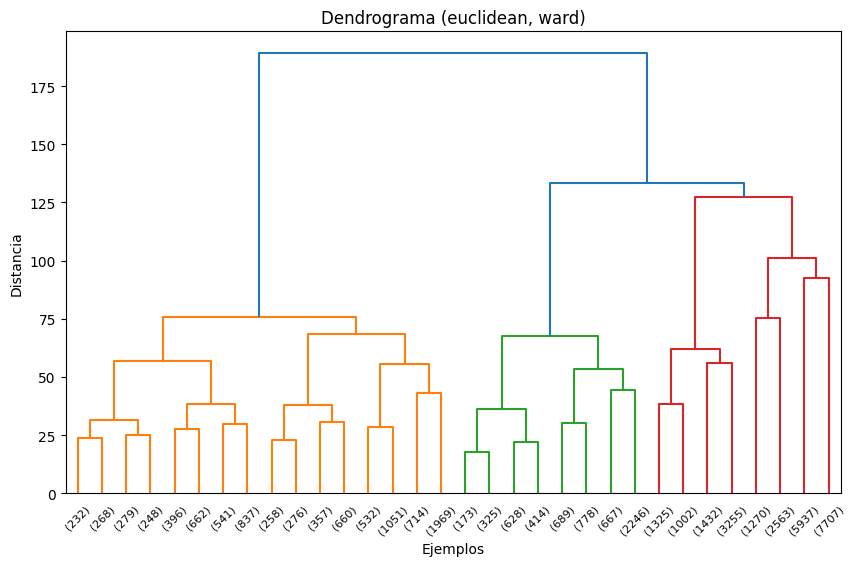

Distribución para 2 clusters:
  Cluster 1: 9280 ejemplos
  Cluster 2: 30411 ejemplos


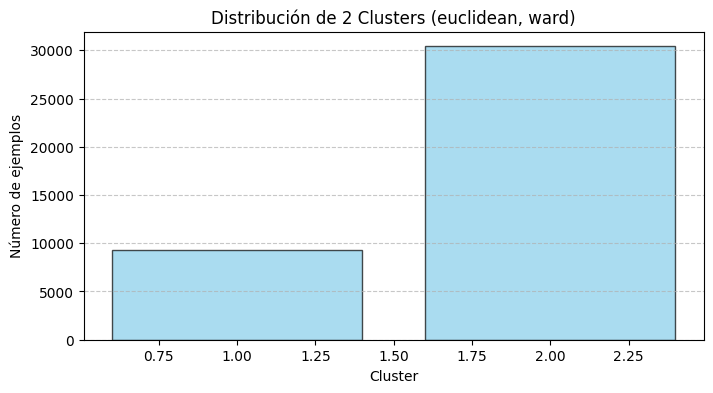

Distribución para 5 clusters:
  Cluster 1: 9280 ejemplos
  Cluster 2: 5920 ejemplos
  Cluster 3: 7014 ejemplos
  Cluster 4: 3833 ejemplos
  Cluster 5: 13644 ejemplos


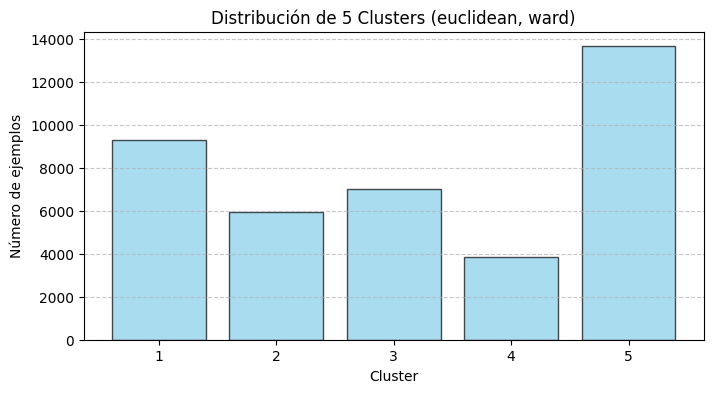

Distribución para 10 clusters:
  Cluster 1: 3463 ejemplos
  Cluster 2: 1551 ejemplos
  Cluster 3: 4266 ejemplos
  Cluster 4: 5920 ejemplos
  Cluster 5: 7014 ejemplos
  Cluster 6: 1270 ejemplos
  Cluster 7: 2563 ejemplos
  Cluster 8: 5937 ejemplos
  Cluster 9: 2676 ejemplos
  Cluster 10: 5031 ejemplos


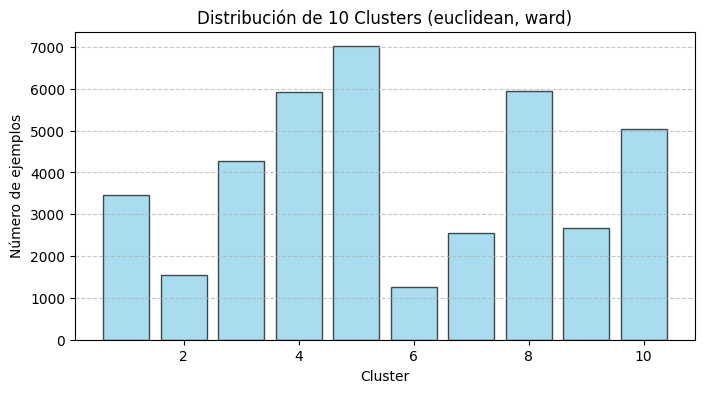

Distribución para 20 clusters:
  Cluster 1: 1027 ejemplos
  Cluster 2: 2436 ejemplos
  Cluster 3: 1551 ejemplos
  Cluster 4: 1583 ejemplos
  Cluster 5: 2683 ejemplos
  Cluster 6: 1540 ejemplos
  Cluster 7: 1467 ejemplos
  Cluster 8: 2913 ejemplos
  Cluster 9: 2327 ejemplos
  Cluster 10: 1432 ejemplos
  Cluster 11: 3255 ejemplos
  Cluster 12: 1270 ejemplos
  Cluster 13: 2563 ejemplos
  Cluster 14: 2600 ejemplos
  Cluster 15: 3337 ejemplos
  Cluster 16: 1111 ejemplos
  Cluster 17: 1565 ejemplos
  Cluster 18: 1589 ejemplos
  Cluster 19: 1079 ejemplos
  Cluster 20: 2363 ejemplos


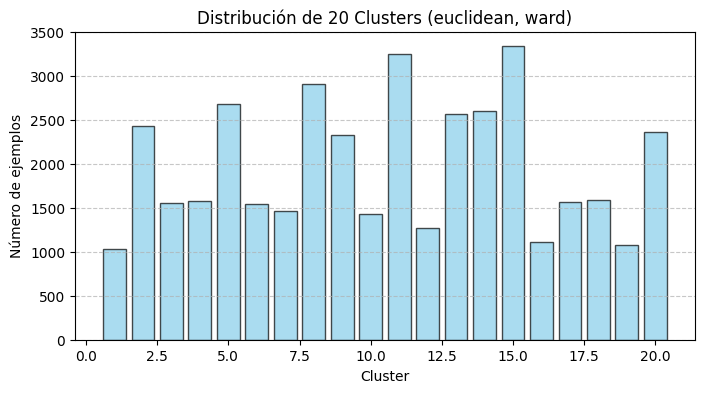


Métrica: euclidean, Método de Enlace: complete


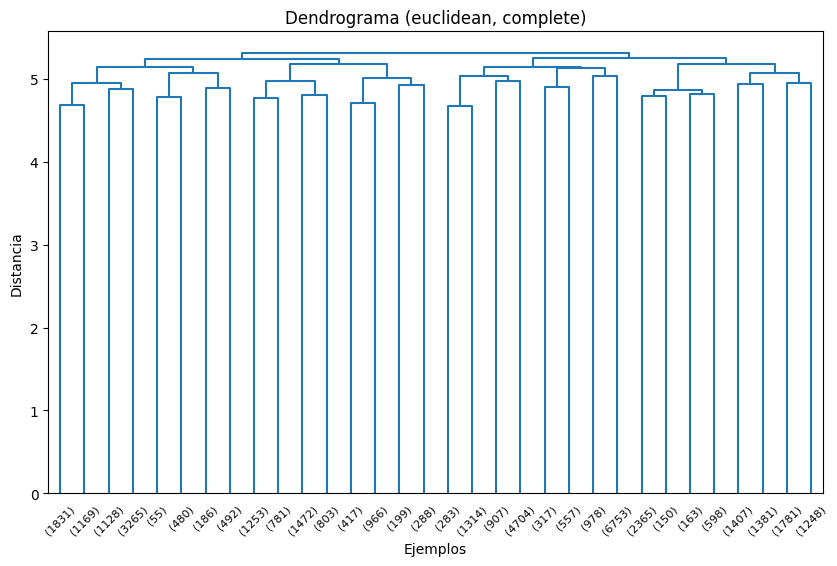

Distribución para 2 clusters:
  Cluster 1: 14785 ejemplos
  Cluster 2: 24906 ejemplos


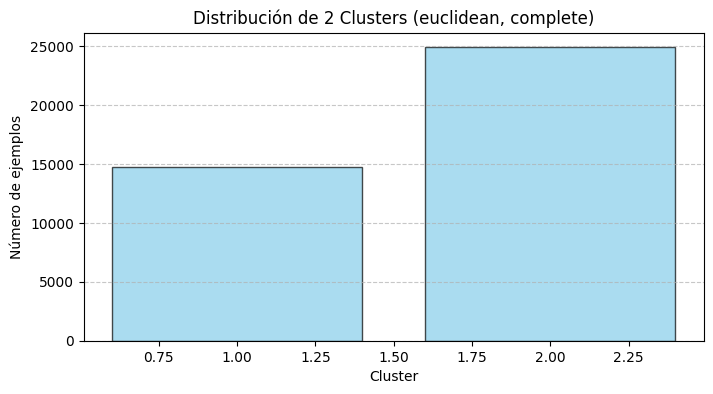

Distribución para 5 clusters:
  Cluster 1: 8606 ejemplos
  Cluster 2: 6179 ejemplos
  Cluster 3: 15813 ejemplos
  Cluster 4: 3276 ejemplos
  Cluster 5: 5817 ejemplos


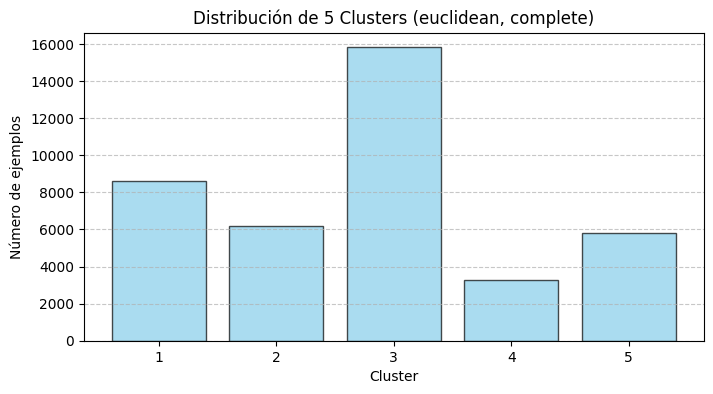

Distribución para 10 clusters:
  Cluster 1: 7393 ejemplos
  Cluster 2: 535 ejemplos
  Cluster 3: 678 ejemplos
  Cluster 4: 4309 ejemplos
  Cluster 5: 1870 ejemplos
  Cluster 6: 7208 ejemplos
  Cluster 7: 874 ejemplos
  Cluster 8: 7731 ejemplos
  Cluster 9: 3276 ejemplos
  Cluster 10: 5817 ejemplos


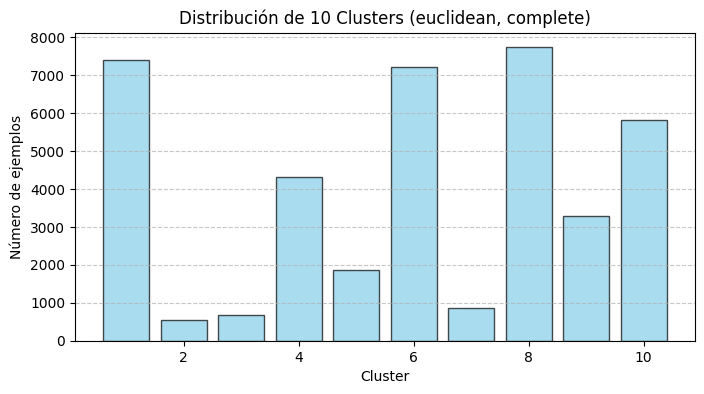

Distribución para 20 clusters:
  Cluster 1: 3000 ejemplos
  Cluster 2: 4393 ejemplos
  Cluster 3: 535 ejemplos
  Cluster 4: 678 ejemplos
  Cluster 5: 2034 ejemplos
  Cluster 6: 2275 ejemplos
  Cluster 7: 1383 ejemplos
  Cluster 8: 199 ejemplos
  Cluster 9: 288 ejemplos
  Cluster 10: 1597 ejemplos
  Cluster 11: 907 ejemplos
  Cluster 12: 4704 ejemplos
  Cluster 13: 874 ejemplos
  Cluster 14: 978 ejemplos
  Cluster 15: 6753 ejemplos
  Cluster 16: 3276 ejemplos
  Cluster 17: 1407 ejemplos
  Cluster 18: 1381 ejemplos
  Cluster 19: 1781 ejemplos
  Cluster 20: 1248 ejemplos


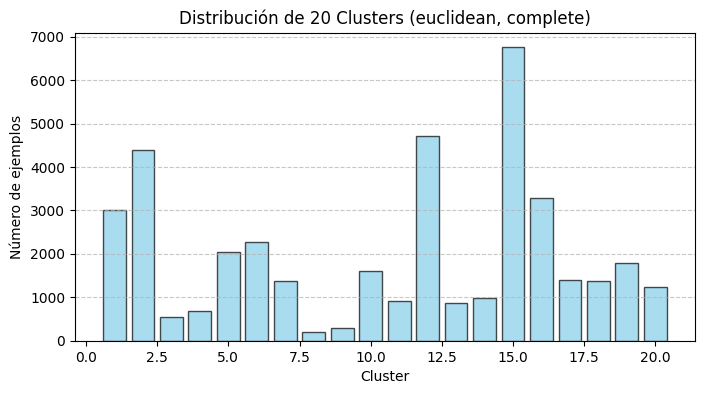


Métrica: cityblock, Método de Enlace: complete


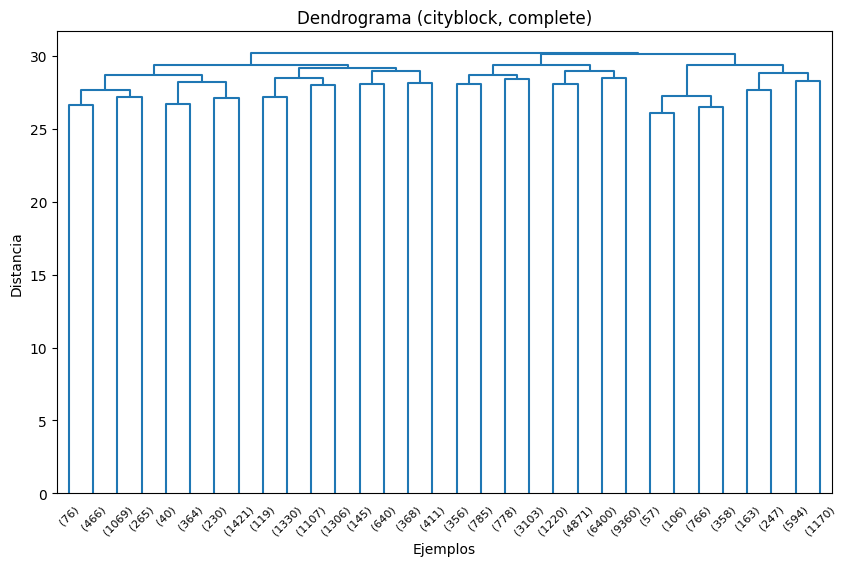

Distribución para 2 clusters:
  Cluster 1: 9357 ejemplos
  Cluster 2: 30334 ejemplos


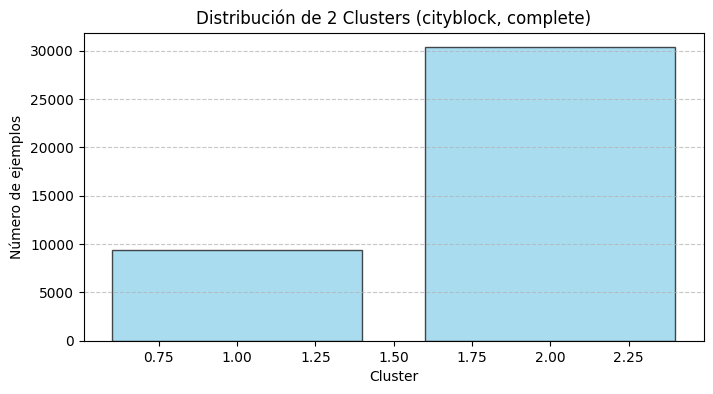

Distribución para 5 clusters:
  Cluster 1: 3931 ejemplos
  Cluster 2: 5426 ejemplos
  Cluster 3: 26873 ejemplos
  Cluster 4: 1287 ejemplos
  Cluster 5: 2174 ejemplos


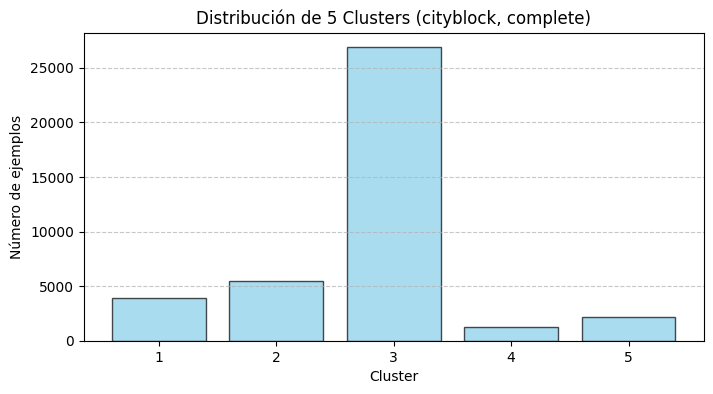

Distribución para 10 clusters:
  Cluster 1: 3931 ejemplos
  Cluster 2: 3862 ejemplos
  Cluster 3: 785 ejemplos
  Cluster 4: 779 ejemplos
  Cluster 5: 5022 ejemplos
  Cluster 6: 6091 ejemplos
  Cluster 7: 15760 ejemplos
  Cluster 8: 1287 ejemplos
  Cluster 9: 410 ejemplos
  Cluster 10: 1764 ejemplos


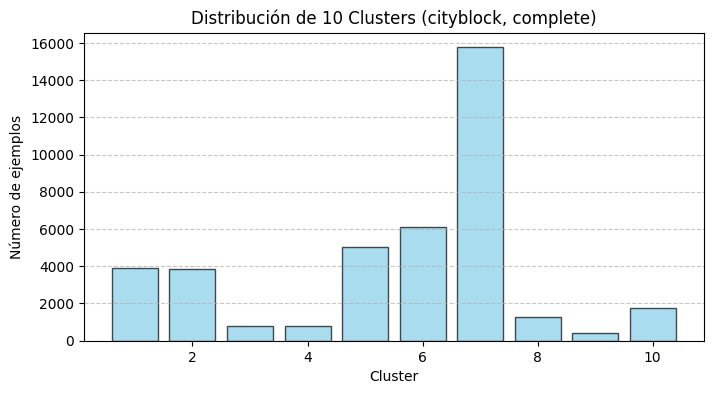

Distribución para 20 clusters:
  Cluster 1: 1876 ejemplos
  Cluster 2: 404 ejemplos
  Cluster 3: 1651 ejemplos
  Cluster 4: 1449 ejemplos
  Cluster 5: 2413 ejemplos
  Cluster 6: 785 ejemplos
  Cluster 7: 368 ejemplos
  Cluster 8: 411 ejemplos
  Cluster 9: 356 ejemplos
  Cluster 10: 785 ejemplos
  Cluster 11: 778 ejemplos
  Cluster 12: 3103 ejemplos
  Cluster 13: 1220 ejemplos
  Cluster 14: 4871 ejemplos
  Cluster 15: 6400 ejemplos
  Cluster 16: 9360 ejemplos
  Cluster 17: 1287 ejemplos
  Cluster 18: 410 ejemplos
  Cluster 19: 594 ejemplos
  Cluster 20: 1170 ejemplos


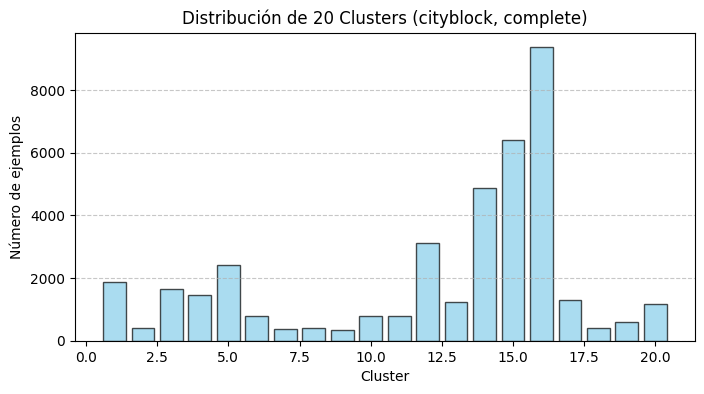


Métrica: cosine, Método de Enlace: complete


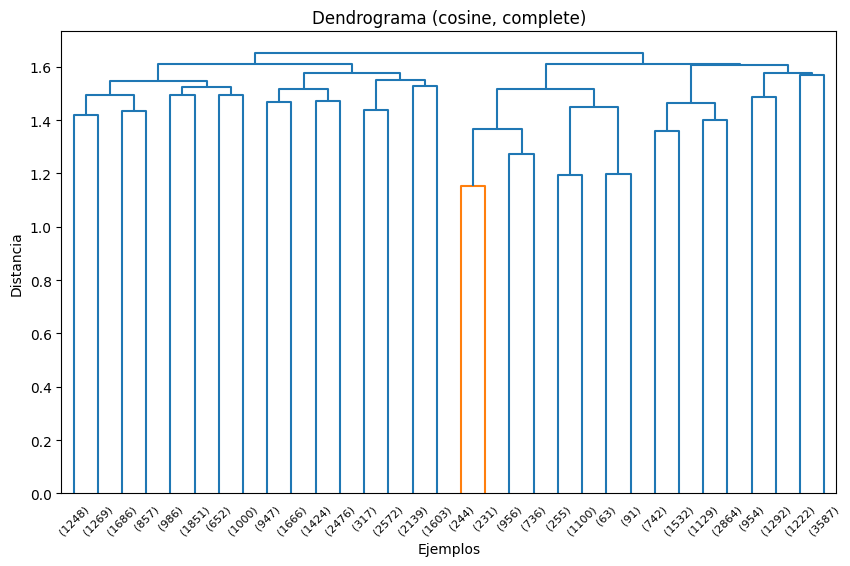

Distribución para 2 clusters:
  Cluster 1: 22693 ejemplos
  Cluster 2: 16998 ejemplos


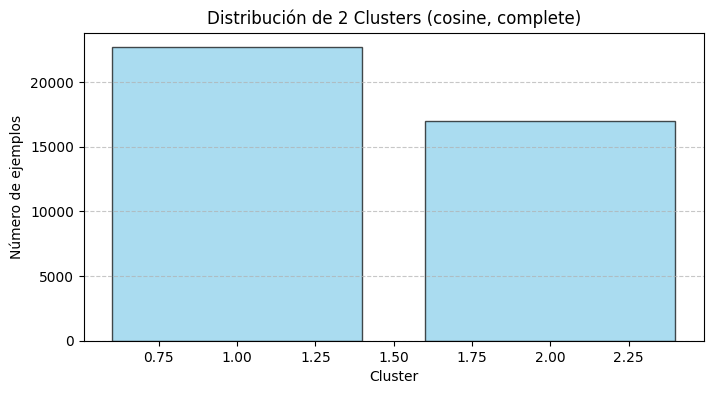

Distribución para 5 clusters:
  Cluster 1: 9549 ejemplos
  Cluster 2: 13144 ejemplos
  Cluster 3: 3676 ejemplos
  Cluster 4: 6267 ejemplos
  Cluster 5: 7055 ejemplos


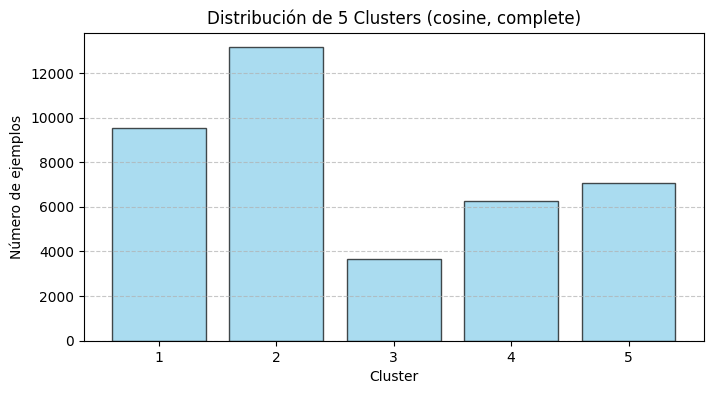

Distribución para 10 clusters:
  Cluster 1: 5060 ejemplos
  Cluster 2: 4489 ejemplos
  Cluster 3: 6513 ejemplos
  Cluster 4: 2889 ejemplos
  Cluster 5: 3742 ejemplos
  Cluster 6: 3676 ejemplos
  Cluster 7: 6267 ejemplos
  Cluster 8: 2246 ejemplos
  Cluster 9: 1222 ejemplos
  Cluster 10: 3587 ejemplos


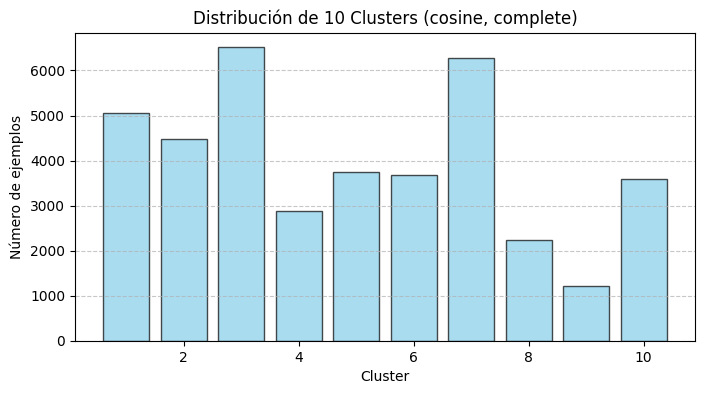

Distribución para 20 clusters:
  Cluster 1: 2517 ejemplos
  Cluster 2: 2543 ejemplos
  Cluster 3: 986 ejemplos
  Cluster 4: 1851 ejemplos
  Cluster 5: 652 ejemplos
  Cluster 6: 1000 ejemplos
  Cluster 7: 2613 ejemplos
  Cluster 8: 3900 ejemplos
  Cluster 9: 2889 ejemplos
  Cluster 10: 2139 ejemplos
  Cluster 11: 480 ejemplos
  Cluster 12: 1123 ejemplos
  Cluster 13: 2167 ejemplos
  Cluster 14: 1509 ejemplos
  Cluster 15: 6267 ejemplos
  Cluster 16: 954 ejemplos
  Cluster 17: 1292 ejemplos
  Cluster 18: 1222 ejemplos
  Cluster 19: 2345 ejemplos
  Cluster 20: 1242 ejemplos


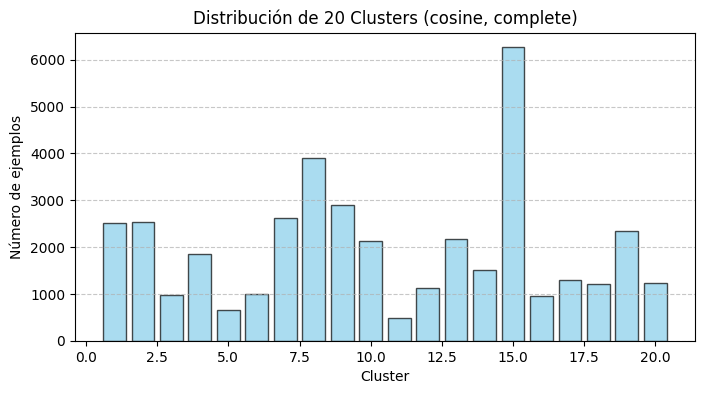


Métrica: euclidean, Método de Enlace: average


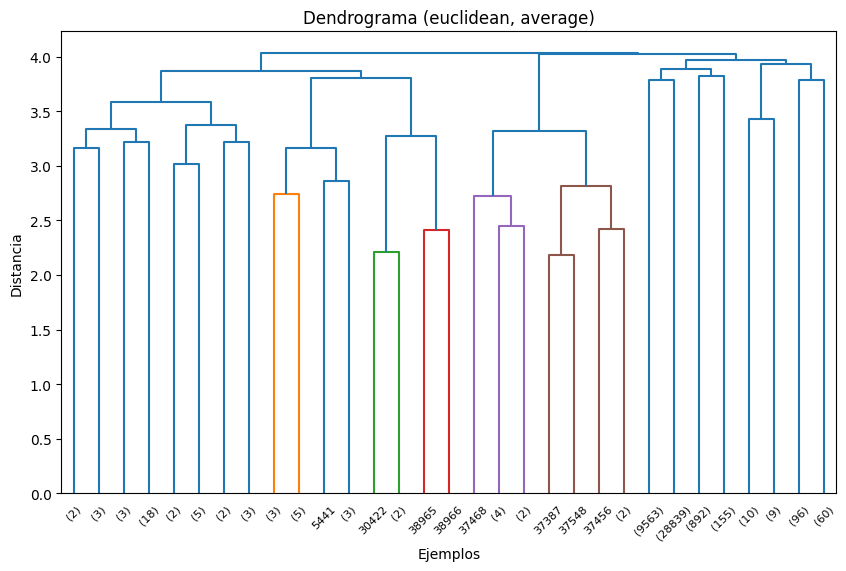

Distribución para 2 clusters:
  Cluster 1: 55 ejemplos
  Cluster 2: 39636 ejemplos


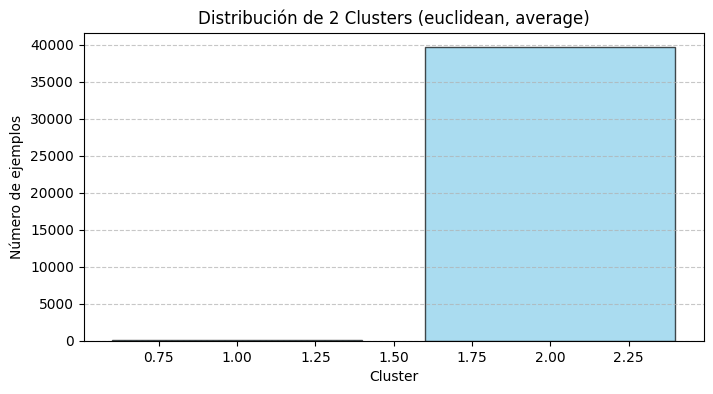

Distribución para 5 clusters:
  Cluster 1: 55 ejemplos
  Cluster 2: 12 ejemplos
  Cluster 3: 39449 ejemplos
  Cluster 4: 19 ejemplos
  Cluster 5: 156 ejemplos


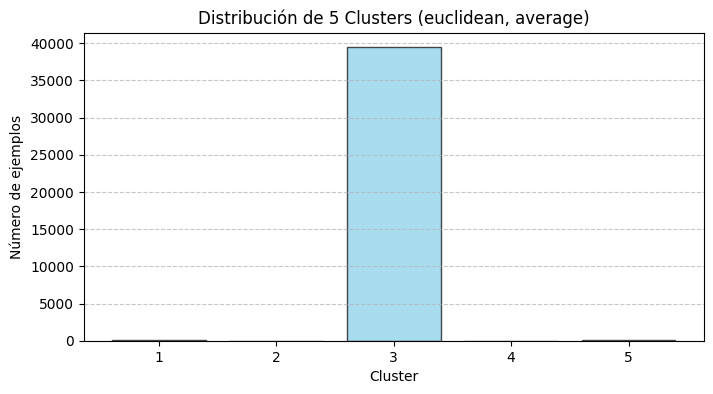

Distribución para 10 clusters:
  Cluster 1: 38 ejemplos
  Cluster 2: 12 ejemplos
  Cluster 3: 5 ejemplos
  Cluster 4: 12 ejemplos
  Cluster 5: 9563 ejemplos
  Cluster 6: 28839 ejemplos
  Cluster 7: 892 ejemplos
  Cluster 8: 155 ejemplos
  Cluster 9: 19 ejemplos
  Cluster 10: 156 ejemplos


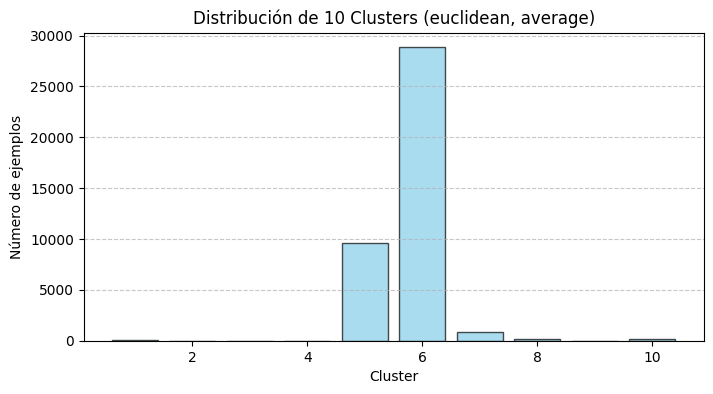

Distribución para 20 clusters:
  Cluster 1: 38 ejemplos
  Cluster 2: 12 ejemplos
  Cluster 3: 5 ejemplos
  Cluster 4: 12 ejemplos
  Cluster 5: 11 ejemplos
  Cluster 6: 9492 ejemplos
  Cluster 7: 2 ejemplos
  Cluster 8: 58 ejemplos
  Cluster 9: 54 ejemplos
  Cluster 10: 26894 ejemplos
  Cluster 11: 1048 ejemplos
  Cluster 12: 80 ejemplos
  Cluster 13: 763 ejemplos
  Cluster 14: 892 ejemplos
  Cluster 15: 66 ejemplos
  Cluster 16: 89 ejemplos
  Cluster 17: 19 ejemplos
  Cluster 18: 96 ejemplos
  Cluster 19: 6 ejemplos
  Cluster 20: 54 ejemplos


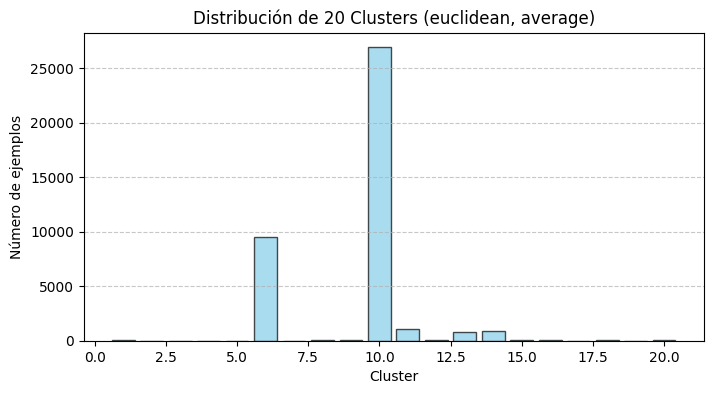


Métrica: cityblock, Método de Enlace: average


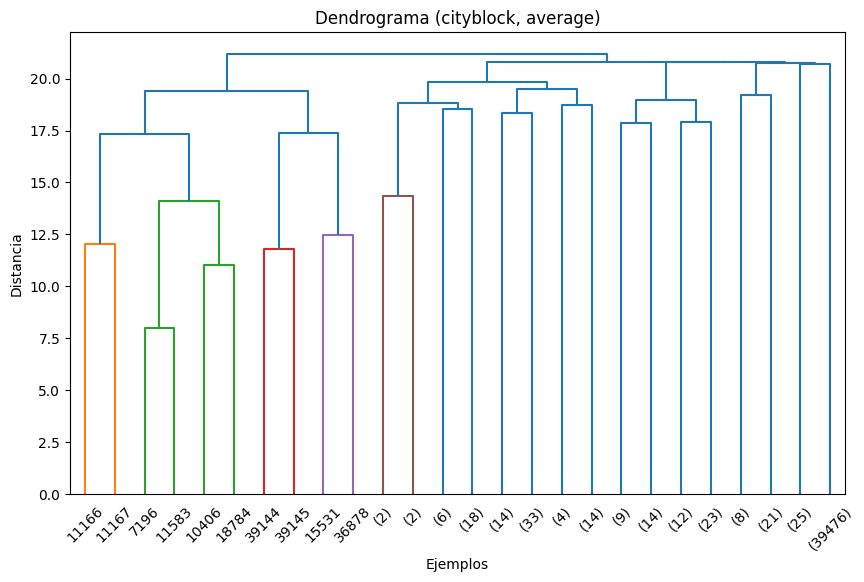

Distribución para 2 clusters:
  Cluster 1: 10 ejemplos
  Cluster 2: 39681 ejemplos


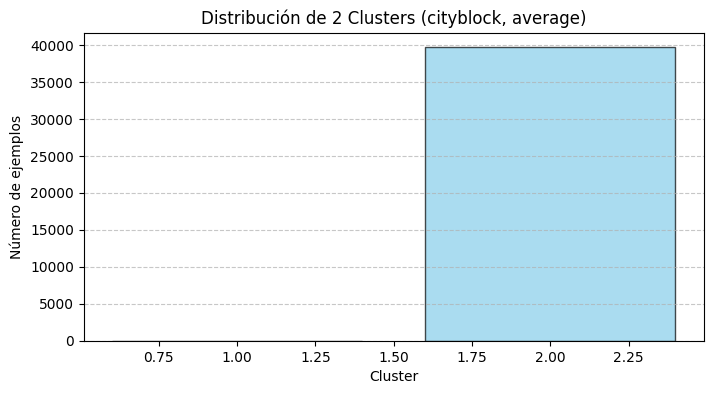

Distribución para 5 clusters:
  Cluster 1: 10 ejemplos
  Cluster 2: 93 ejemplos
  Cluster 3: 58 ejemplos
  Cluster 4: 29 ejemplos
  Cluster 5: 39501 ejemplos


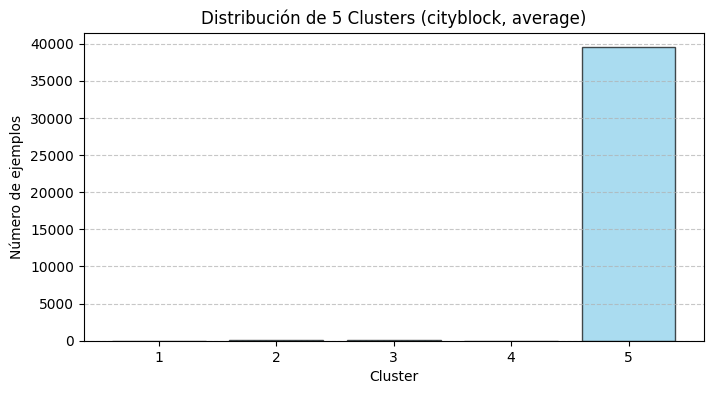

Distribución para 10 clusters:
  Cluster 1: 10 ejemplos
  Cluster 2: 93 ejemplos
  Cluster 3: 58 ejemplos
  Cluster 4: 29 ejemplos
  Cluster 5: 25 ejemplos
  Cluster 6: 1112 ejemplos
  Cluster 7: 365 ejemplos
  Cluster 8: 89 ejemplos
  Cluster 9: 75 ejemplos
  Cluster 10: 37835 ejemplos


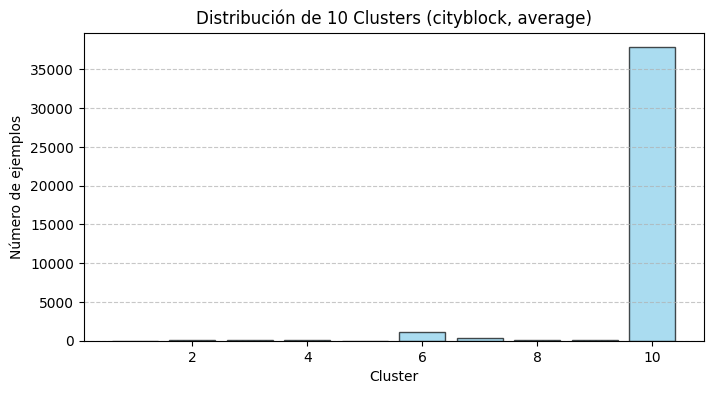

Distribución para 20 clusters:
  Cluster 1: 10 ejemplos
  Cluster 2: 28 ejemplos
  Cluster 3: 65 ejemplos
  Cluster 4: 58 ejemplos
  Cluster 5: 29 ejemplos
  Cluster 6: 12 ejemplos
  Cluster 7: 13 ejemplos
  Cluster 8: 5 ejemplos
  Cluster 9: 1107 ejemplos
  Cluster 10: 365 ejemplos
  Cluster 11: 30 ejemplos
  Cluster 12: 59 ejemplos
  Cluster 13: 75 ejemplos
  Cluster 14: 36 ejemplos
  Cluster 15: 99 ejemplos
  Cluster 16: 1894 ejemplos
  Cluster 17: 9 ejemplos
  Cluster 18: 35732 ejemplos
  Cluster 19: 12 ejemplos
  Cluster 20: 53 ejemplos


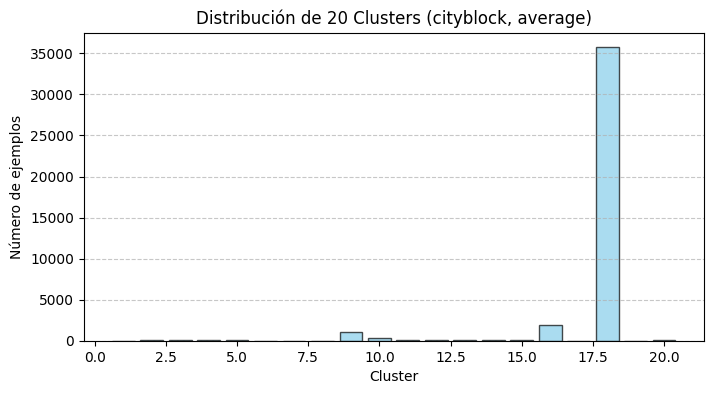


Métrica: cosine, Método de Enlace: average


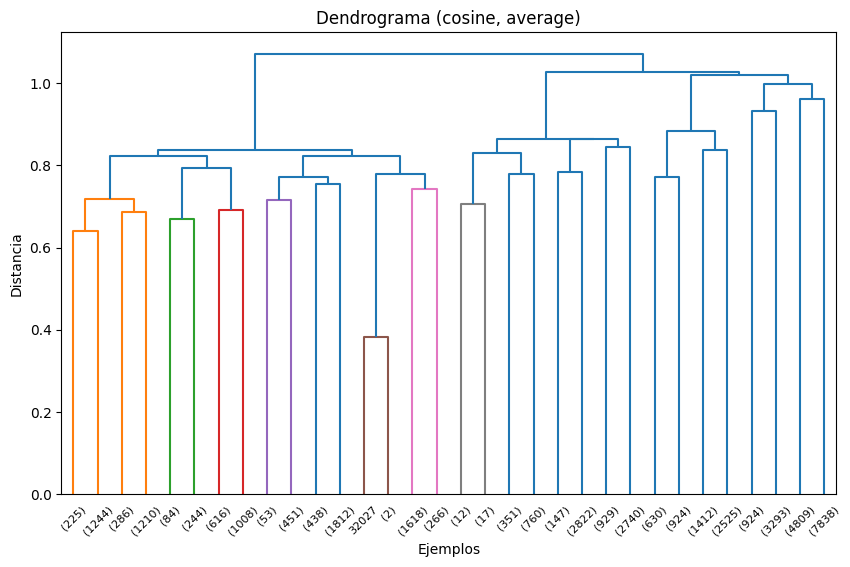

Distribución para 2 clusters:
  Cluster 1: 9558 ejemplos
  Cluster 2: 30133 ejemplos


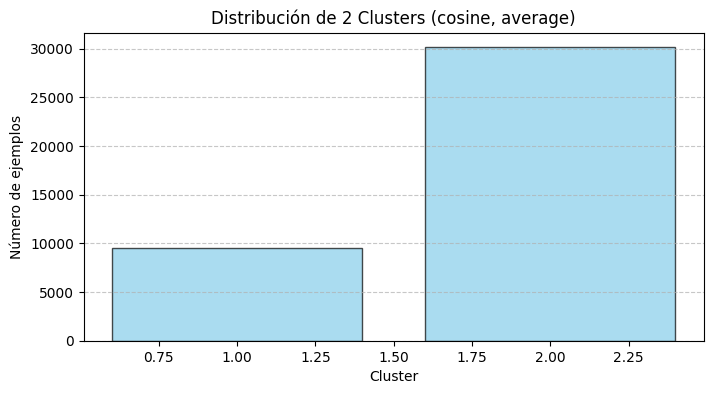

Distribución para 5 clusters:
  Cluster 1: 9558 ejemplos
  Cluster 2: 7778 ejemplos
  Cluster 3: 5491 ejemplos
  Cluster 4: 4217 ejemplos
  Cluster 5: 12647 ejemplos


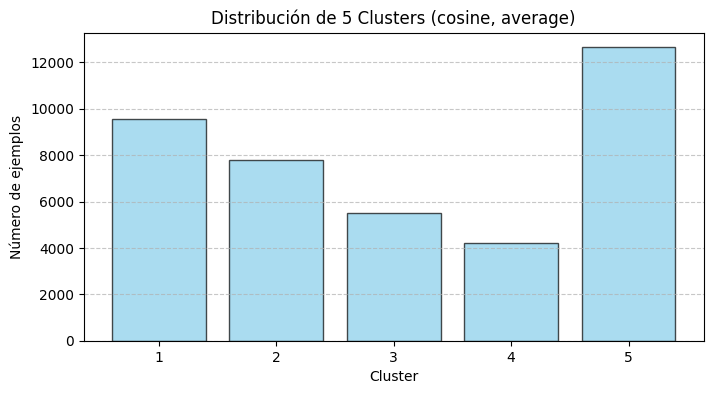

Distribución para 10 clusters:
  Cluster 1: 9558 ejemplos
  Cluster 2: 7778 ejemplos
  Cluster 3: 1554 ejemplos
  Cluster 4: 3937 ejemplos
  Cluster 5: 924 ejemplos
  Cluster 6: 3293 ejemplos
  Cluster 7: 4809 ejemplos
  Cluster 8: 1733 ejemplos
  Cluster 9: 4542 ejemplos
  Cluster 10: 1563 ejemplos


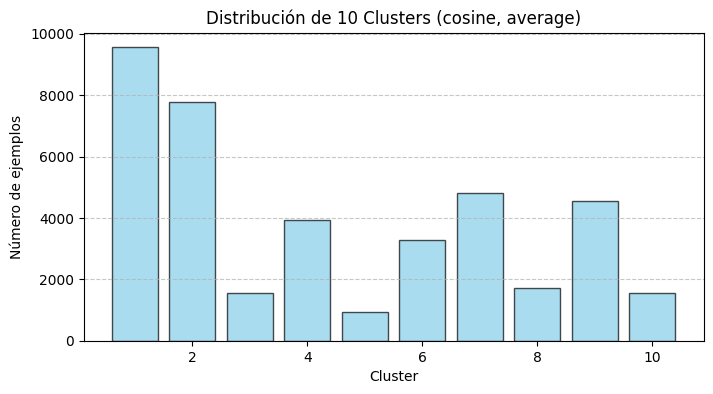

Distribución para 20 clusters:
  Cluster 1: 4917 ejemplos
  Cluster 2: 4641 ejemplos
  Cluster 3: 1140 ejemplos
  Cluster 4: 2969 ejemplos
  Cluster 5: 929 ejemplos
  Cluster 6: 2740 ejemplos
  Cluster 7: 1554 ejemplos
  Cluster 8: 3937 ejemplos
  Cluster 9: 924 ejemplos
  Cluster 10: 2445 ejemplos
  Cluster 11: 848 ejemplos
  Cluster 12: 3674 ejemplos
  Cluster 13: 115 ejemplos
  Cluster 14: 1020 ejemplos
  Cluster 15: 704 ejemplos
  Cluster 16: 1029 ejemplos
  Cluster 17: 101 ejemplos
  Cluster 18: 4441 ejemplos
  Cluster 19: 16 ejemplos
  Cluster 20: 1547 ejemplos


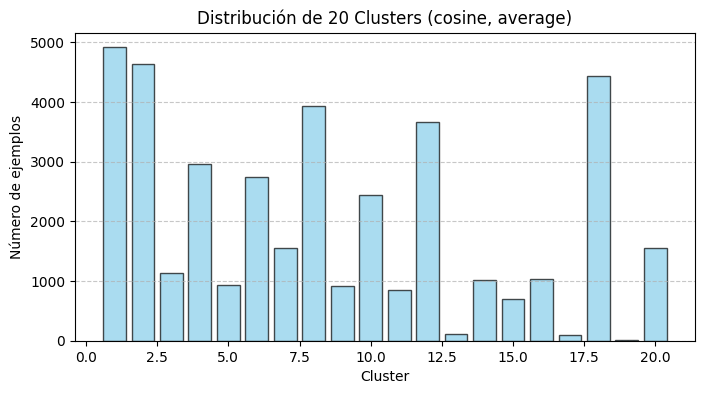


Métrica: euclidean, Método de Enlace: single


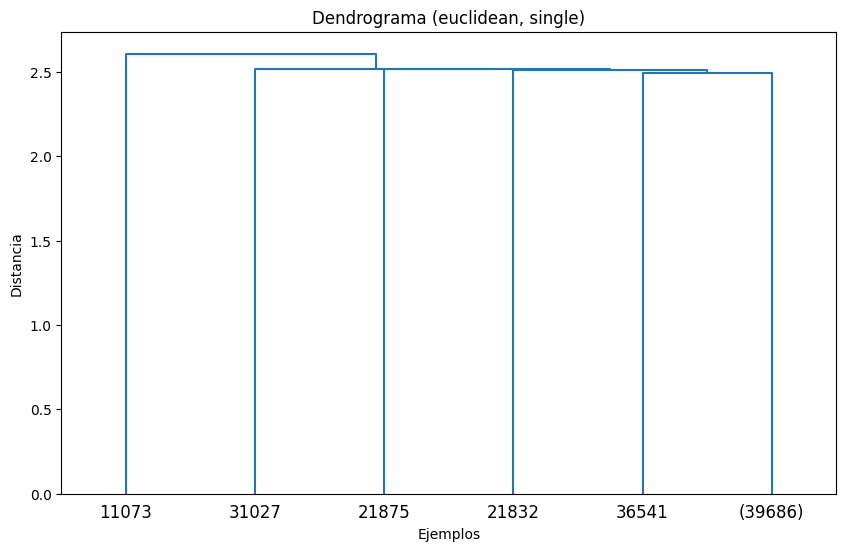

Distribución para 2 clusters:
  Cluster 1: 39690 ejemplos
  Cluster 2: 1 ejemplos


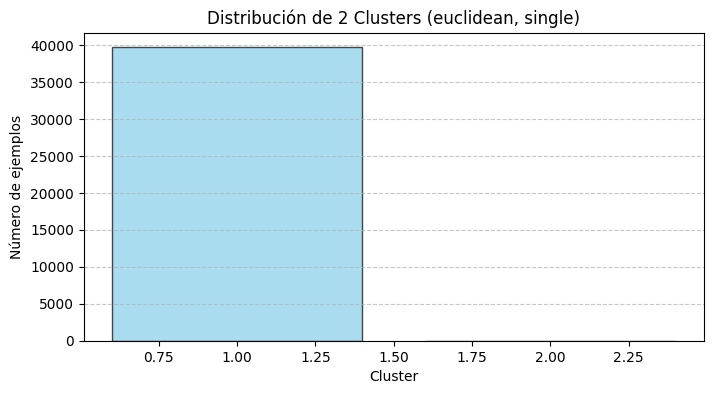

Distribución para 5 clusters:
  Cluster 1: 39687 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos


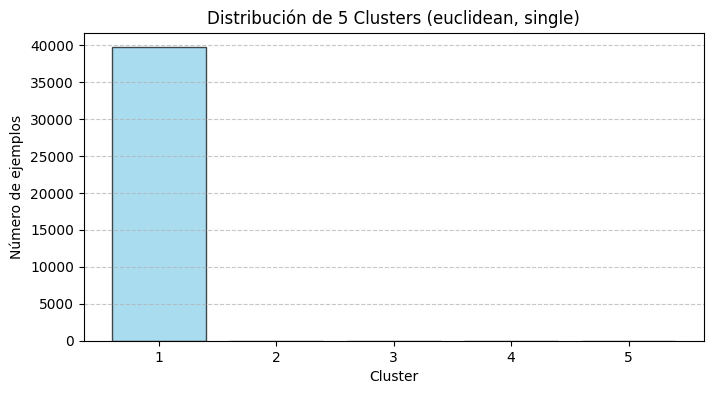

Distribución para 10 clusters:
  Cluster 1: 39682 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos
  Cluster 6: 1 ejemplos
  Cluster 7: 1 ejemplos
  Cluster 8: 1 ejemplos
  Cluster 9: 1 ejemplos
  Cluster 10: 1 ejemplos


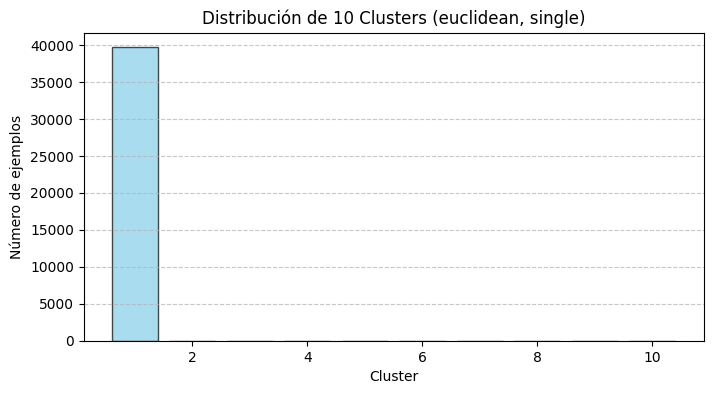

Distribución para 20 clusters:
  Cluster 1: 2 ejemplos
  Cluster 2: 3 ejemplos
  Cluster 3: 39669 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos
  Cluster 6: 1 ejemplos
  Cluster 7: 1 ejemplos
  Cluster 8: 1 ejemplos
  Cluster 9: 1 ejemplos
  Cluster 10: 1 ejemplos
  Cluster 11: 1 ejemplos
  Cluster 12: 1 ejemplos
  Cluster 13: 1 ejemplos
  Cluster 14: 1 ejemplos
  Cluster 15: 1 ejemplos
  Cluster 16: 1 ejemplos
  Cluster 17: 1 ejemplos
  Cluster 18: 1 ejemplos
  Cluster 19: 1 ejemplos
  Cluster 20: 1 ejemplos


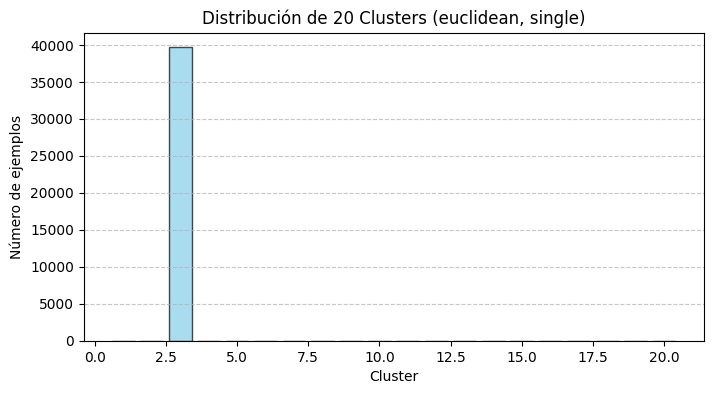


Métrica: cityblock, Método de Enlace: single


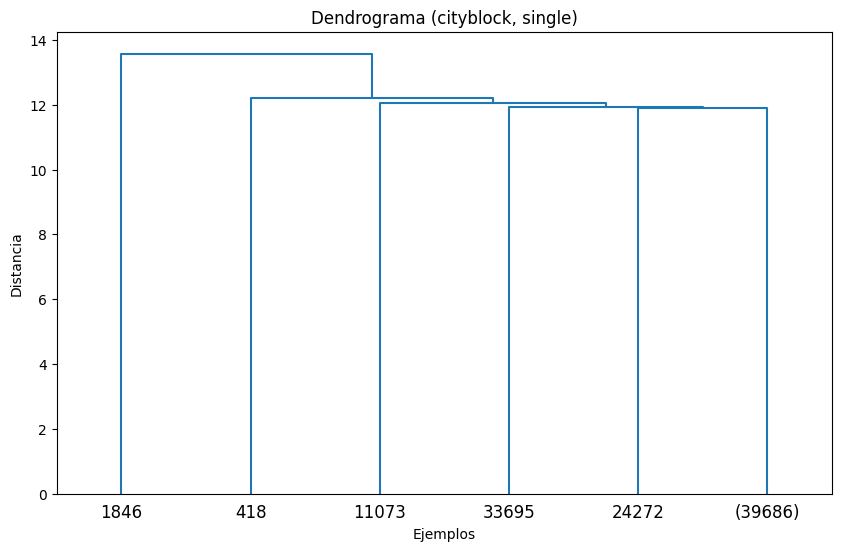

Distribución para 2 clusters:
  Cluster 1: 39690 ejemplos
  Cluster 2: 1 ejemplos


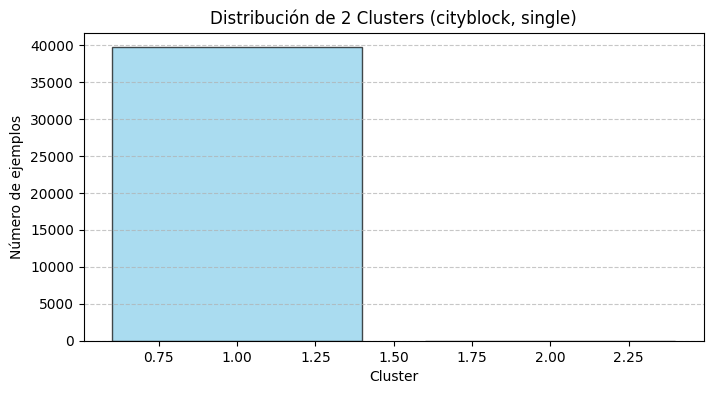

Distribución para 5 clusters:
  Cluster 1: 39687 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos


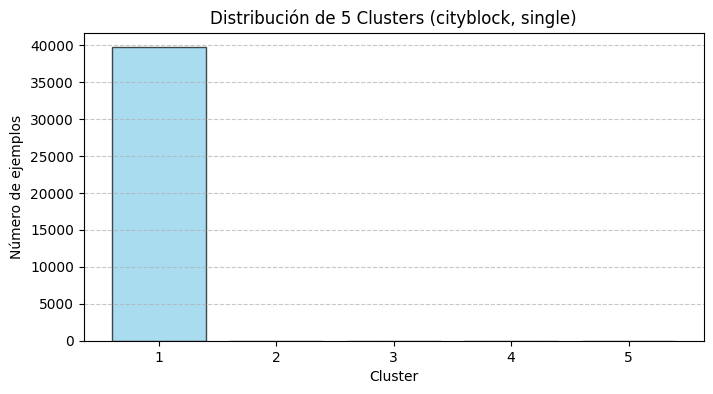

Distribución para 10 clusters:
  Cluster 1: 39682 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos
  Cluster 6: 1 ejemplos
  Cluster 7: 1 ejemplos
  Cluster 8: 1 ejemplos
  Cluster 9: 1 ejemplos
  Cluster 10: 1 ejemplos


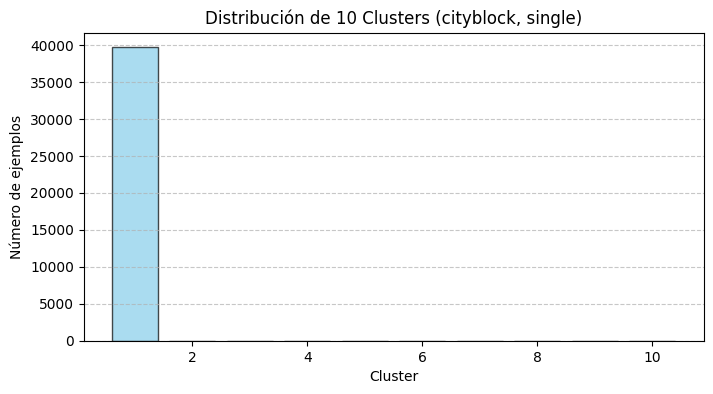

Distribución para 20 clusters:
  Cluster 1: 39672 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos
  Cluster 6: 1 ejemplos
  Cluster 7: 1 ejemplos
  Cluster 8: 1 ejemplos
  Cluster 9: 1 ejemplos
  Cluster 10: 1 ejemplos
  Cluster 11: 1 ejemplos
  Cluster 12: 1 ejemplos
  Cluster 13: 1 ejemplos
  Cluster 14: 1 ejemplos
  Cluster 15: 1 ejemplos
  Cluster 16: 1 ejemplos
  Cluster 17: 1 ejemplos
  Cluster 18: 1 ejemplos
  Cluster 19: 1 ejemplos
  Cluster 20: 1 ejemplos


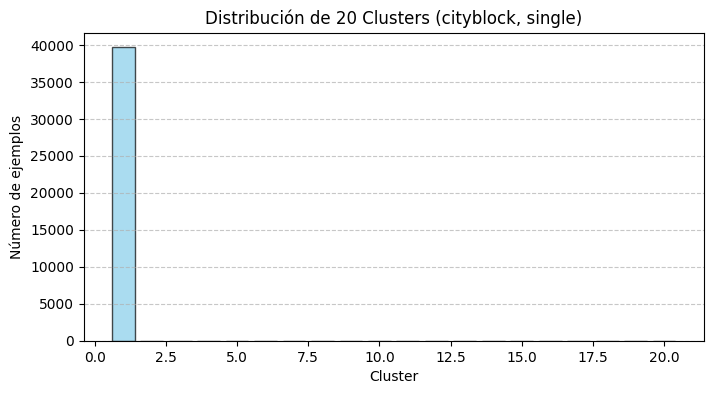


Métrica: cosine, Método de Enlace: single


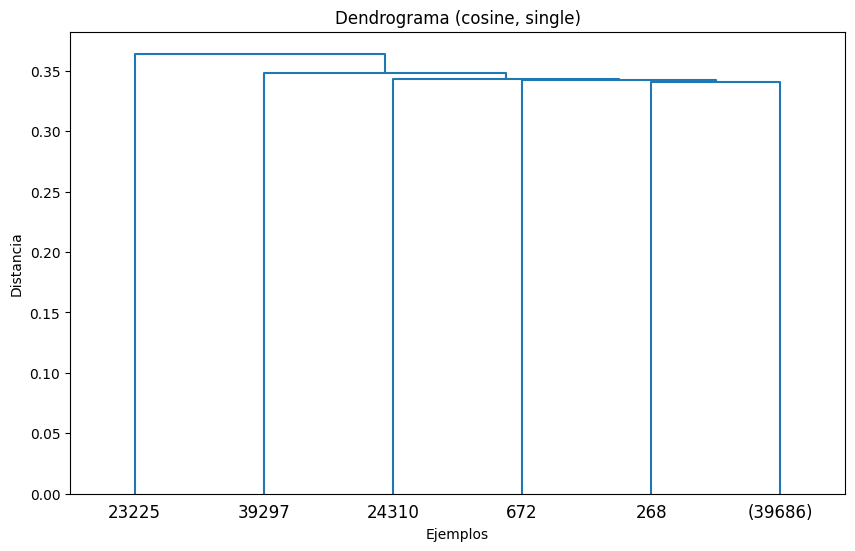

Distribución para 2 clusters:
  Cluster 1: 39690 ejemplos
  Cluster 2: 1 ejemplos


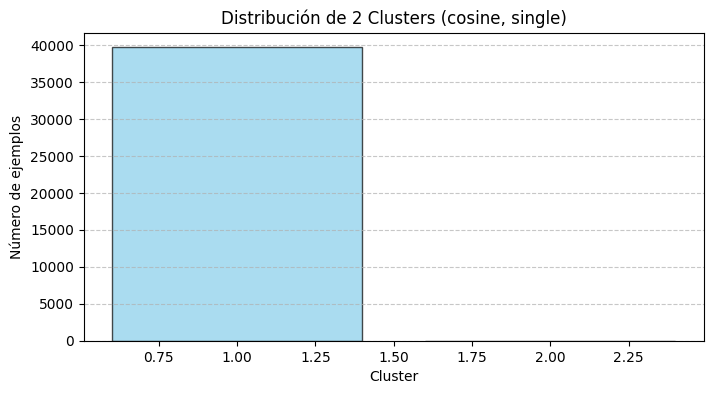

Distribución para 5 clusters:
  Cluster 1: 39687 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos


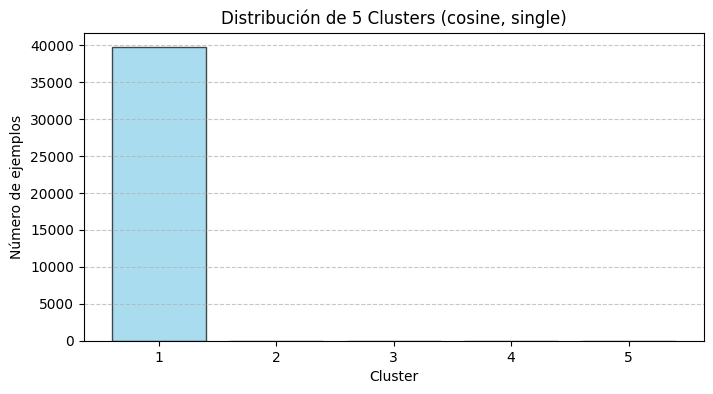

Distribución para 10 clusters:
  Cluster 1: 39682 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos
  Cluster 6: 1 ejemplos
  Cluster 7: 1 ejemplos
  Cluster 8: 1 ejemplos
  Cluster 9: 1 ejemplos
  Cluster 10: 1 ejemplos


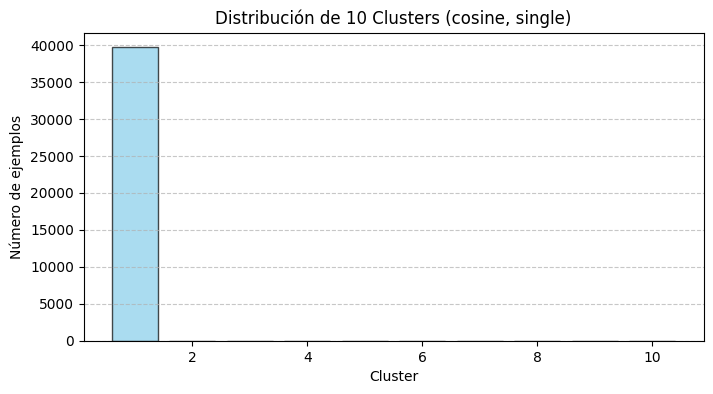

Distribución para 20 clusters:
  Cluster 1: 39672 ejemplos
  Cluster 2: 1 ejemplos
  Cluster 3: 1 ejemplos
  Cluster 4: 1 ejemplos
  Cluster 5: 1 ejemplos
  Cluster 6: 1 ejemplos
  Cluster 7: 1 ejemplos
  Cluster 8: 1 ejemplos
  Cluster 9: 1 ejemplos
  Cluster 10: 1 ejemplos
  Cluster 11: 1 ejemplos
  Cluster 12: 1 ejemplos
  Cluster 13: 1 ejemplos
  Cluster 14: 1 ejemplos
  Cluster 15: 1 ejemplos
  Cluster 16: 1 ejemplos
  Cluster 17: 1 ejemplos
  Cluster 18: 1 ejemplos
  Cluster 19: 1 ejemplos
  Cluster 20: 1 ejemplos


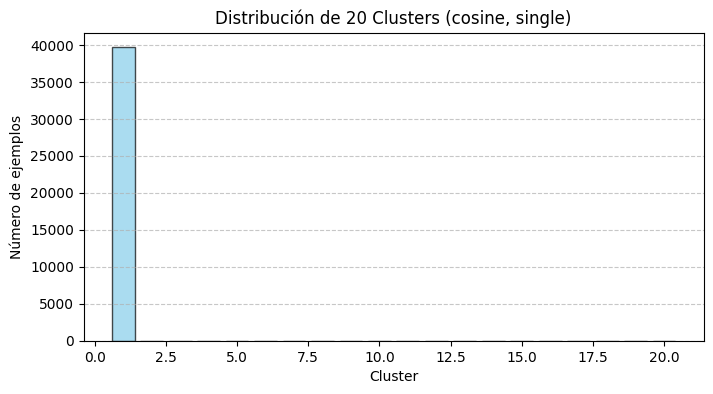

In [769]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist
import numpy as np
import matplotlib.pyplot as plt

metrics = ['euclidean', 'cityblock', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']
n_clusters_list = [2, 5, 10, 20] 

cluster_distributions = {}

for linkage_method in linkages:
    for metric in metrics:
        # Ward solo admite euclidean
        if linkage_method == 'ward' and metric != 'euclidean':
            continue

        print(f"\nMétrica: {metric}, Método de Enlace: {linkage_method}")

        distance_matrix = pdist(X_pca, metric=metric)

        Z = linkage(distance_matrix, method=linkage_method)

        plt.figure(figsize=(10, 6))
        dendrogram(Z, truncate_mode="level", p=4)
        plt.title(f"Dendrograma ({metric}, {linkage_method})")
        plt.xlabel("Ejemplos")
        plt.ylabel("Distancia")
        plt.show()

        for n_clusters in n_clusters_list:
            clusters = fcluster(Z, t=n_clusters, criterion='maxclust')  

            unique, counts = np.unique(clusters, return_counts=True)
            distribution = dict(zip(unique, counts))

            cluster_distributions[(metric, linkage_method, n_clusters)] = distribution

            print(f"Distribución para {n_clusters} clusters:")
            for cluster, count in distribution.items():
                print(f"  Cluster {cluster}: {count} ejemplos")

            plt.figure(figsize=(8, 4))
            plt.bar(distribution.keys(), distribution.values(), color='skyblue', alpha=0.7, edgecolor='black')
            plt.title(f"Distribución de {n_clusters} Clusters ({metric}, {linkage_method})")
            plt.xlabel("Cluster")
            plt.ylabel("Número de ejemplos")
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.show()


Analizamos las distribuciones de los datos y vemos que no se agrupan de una manera uniforme. Hay mucha diferencia entre el número de datos que contiene cada cluster incluso cuando tan sólo agrupamos 2 clusters.  
Quizá la mayor aproximación a una distribución uniforme, la encontramos con la distancia coseno y el método de enlace completo. Sin embargo, al aumentar el número de clusters, se van desnivelando los tamaños de las agrupaciones.


#### 2.3  ¿Cómo afectan las diferentes métricas de distancia a la estructura del dendrograma?

Vamos a ir analizando por distancias y fijándonos en el método de enlace 'average':    

- 1. **Euclídea**:
Con la distancia euclídea, medimos la distancia geométrica directa entre dos puntos en un espacio multidimensional. La unión de los clusters ocurre a grandes diferencias absolutas entre las observaciones. Esto es característico de esta distancia, ya que es sensible a magnitudes absolutas. Los clusters pequeños ( como (3) o (5) de color naranja) se forman rápidamente, pero su unión a otros grupos ocurre a distancias relativamente grandes. Esto puede ser debido a que algunos valores extremos pueden estar afectando a la estructura del dendrograma.
 
 
- 2. **Manhattan**: En este dendrograma, observamos algunas agrupaciones tempranas como 11166 y 11167 o (7196) y (11583), así que deducimos que estas observaciones tienen diferencias absolutas pequeñas. Sin embargo, en la parte de la derecha del gráfico, la unión de grupos más grandes ocurre a distancias mucho mayores (como (25) y (39476)), donde se refleja la influencia de los valores totales en varias dimensiones. A diferencia de la métrica Euclidiana, aquí las distancias extremas no dominan tanto la estructura.

- 3. **Coseno**: Las uniones de los clusters de la parte izquierda del gráfico, ocurren en distancias pequeñas. Esta distancia establece la similitud con patrones y no se guía tanto por la magnitud como las otras dos distancias. Por ejemplo, los clusters como (225) y (1244) se agrupan rápidamente, al igual que otros clusters por la parte izquierda del gráfico. Por otro lado, observamos que otros valores como (1812) o (924) permanecen separados por más tiempo. Este dendrograma da lugar a una estructura más compacta, con grupos que parecen ser más homogéneos en términos de orientación de sus datos


Analizando un poco a nivel general los tres dendrogramas, podemos deducir que hay grandes grupos de datos bastante alejados al resto independientemente de la distancia, por lo que las uniones en los dendrograma ocurren bastante tarde y por esta razón puede que más adelante, agrupar por 2 clusters nos dé buenos resultados.

#### 2.4 Utiliza por lo menos dos índices de calidad de clustering y y analiza sus resultados.

En este apartado, hemos utilizado tres índices de calidad de clustering distintos: silhouette, calinski_harabasz y davies_bouldin. Para obtener el mejor resultado posible, contamos con un amplio rango de n_clusters. Para cada valor, aplicamos AglomertiveClustering con todas las combinaciones de métricas/métodos de enlace posibles. Luego calculamos los tres índices mencionados anteriormente y almacenamos dichos valores. Por último vamos a hacer un promedio de todos los resultados y así obtener el promedio de cada índice por n_cluster. El promedio más alto será el valor de n_clusters más óptimo. 


Evaluando ward con euclidean:
n_clusters=2: Silhouette=-0.0013, Calinski-Harabasz=28.9390, Davies-Bouldin=29.6675
n_clusters=3: Silhouette=-0.0095, Calinski-Harabasz=27.2854, Davies-Bouldin=50.2013
n_clusters=4: Silhouette=-0.0144, Calinski-Harabasz=19.3468, Davies-Bouldin=67.3807
n_clusters=5: Silhouette=-0.0154, Calinski-Harabasz=17.3318, Davies-Bouldin=78.9241
n_clusters=6: Silhouette=-0.0156, Calinski-Harabasz=15.0253, Davies-Bouldin=68.5048
n_clusters=7: Silhouette=-0.0164, Calinski-Harabasz=13.3622, Davies-Bouldin=63.4731
n_clusters=8: Silhouette=-0.0234, Calinski-Harabasz=12.8141, Davies-Bouldin=56.5576
n_clusters=9: Silhouette=-0.0305, Calinski-Harabasz=13.6613, Davies-Bouldin=53.7822
n_clusters=10: Silhouette=-0.0322, Calinski-Harabasz=13.6705, Davies-Bouldin=53.4963
n_clusters=11: Silhouette=-0.0333, Calinski-Harabasz=12.8773, Davies-Bouldin=54.9228
n_clusters=12: Silhouette=-0.0386, Calinski-Harabasz=12.8087, Davies-Bouldin=55.0603
n_clusters=13: Silhouette=-0.0464, Calinsk

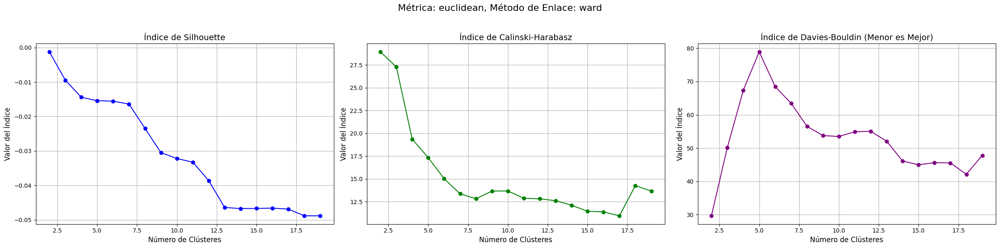


Evaluando complete con euclidean:
n_clusters=2: Silhouette=0.0009, Calinski-Harabasz=2.6708, Davies-Bouldin=111.9460
n_clusters=3: Silhouette=-0.0085, Calinski-Harabasz=23.0387, Davies-Bouldin=52.8950
n_clusters=4: Silhouette=-0.0125, Calinski-Harabasz=24.2696, Davies-Bouldin=66.8115
n_clusters=5: Silhouette=-0.0160, Calinski-Harabasz=19.4825, Davies-Bouldin=68.2374
n_clusters=6: Silhouette=-0.0212, Calinski-Harabasz=16.2042, Davies-Bouldin=59.2474
n_clusters=7: Silhouette=-0.0222, Calinski-Harabasz=14.7139, Davies-Bouldin=66.8595
n_clusters=8: Silhouette=-0.0232, Calinski-Harabasz=13.4102, Davies-Bouldin=72.7094
n_clusters=9: Silhouette=-0.0234, Calinski-Harabasz=12.3087, Davies-Bouldin=67.7745
n_clusters=10: Silhouette=-0.0266, Calinski-Harabasz=11.2478, Davies-Bouldin=64.2901
n_clusters=11: Silhouette=-0.0314, Calinski-Harabasz=10.9634, Davies-Bouldin=61.9567
n_clusters=12: Silhouette=-0.0331, Calinski-Harabasz=10.7624, Davies-Bouldin=62.0211
n_clusters=13: Silhouette=-0.0335, Cali

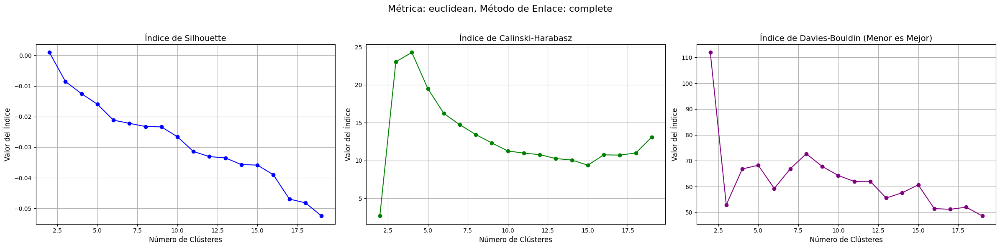


Evaluando complete con manhattan:
n_clusters=2: Silhouette=-0.0107, Calinski-Harabasz=92.1571, Davies-Bouldin=16.4314
n_clusters=3: Silhouette=-0.0211, Calinski-Harabasz=60.2085, Davies-Bouldin=18.9785
n_clusters=4: Silhouette=-0.0384, Calinski-Harabasz=47.5531, Davies-Bouldin=19.0552
n_clusters=5: Silhouette=-0.0430, Calinski-Harabasz=45.9021, Davies-Bouldin=51.4277
n_clusters=6: Silhouette=-0.0406, Calinski-Harabasz=217.4669, Davies-Bouldin=44.9560
n_clusters=7: Silhouette=-0.0427, Calinski-Harabasz=185.9191, Davies-Bouldin=40.5329
n_clusters=8: Silhouette=-0.0420, Calinski-Harabasz=217.6594, Davies-Bouldin=39.2572
n_clusters=9: Silhouette=-0.0543, Calinski-Harabasz=192.9045, Davies-Bouldin=33.9817
n_clusters=10: Silhouette=-0.0556, Calinski-Harabasz=174.8005, Davies-Bouldin=32.7093
n_clusters=11: Silhouette=-0.0744, Calinski-Harabasz=168.3691, Davies-Bouldin=15.0656
n_clusters=12: Silhouette=-0.0755, Calinski-Harabasz=172.4709, Davies-Bouldin=17.5866
n_clusters=13: Silhouette=-0.07

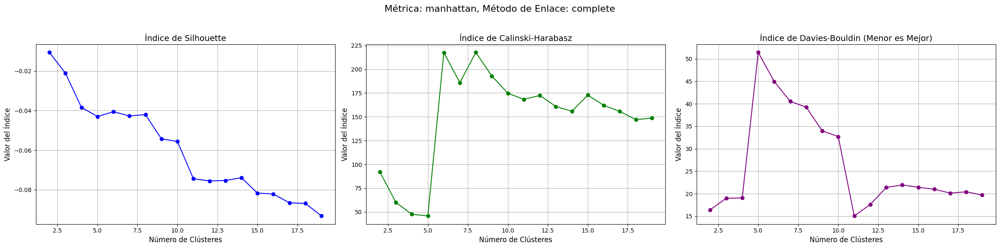


Evaluando complete con cosine:
n_clusters=2: Silhouette=0.0011, Calinski-Harabasz=55.4796, Davies-Bouldin=25.1000
n_clusters=3: Silhouette=-0.0084, Calinski-Harabasz=46.7717, Davies-Bouldin=21.1735
n_clusters=4: Silhouette=-0.0135, Calinski-Harabasz=33.3162, Davies-Bouldin=38.2471
n_clusters=5: Silhouette=-0.0202, Calinski-Harabasz=29.5046, Davies-Bouldin=36.2139
n_clusters=6: Silhouette=-0.0204, Calinski-Harabasz=23.7560, Davies-Bouldin=62.9783
n_clusters=7: Silhouette=-0.0257, Calinski-Harabasz=20.9092, Davies-Bouldin=59.6686
n_clusters=8: Silhouette=-0.0289, Calinski-Harabasz=24.0194, Davies-Bouldin=55.7835
n_clusters=9: Silhouette=-0.0294, Calinski-Harabasz=22.5272, Davies-Bouldin=40.4737
n_clusters=10: Silhouette=-0.0311, Calinski-Harabasz=21.9366, Davies-Bouldin=39.1411
n_clusters=11: Silhouette=-0.0327, Calinski-Harabasz=20.2095, Davies-Bouldin=42.3570
n_clusters=12: Silhouette=-0.0357, Calinski-Harabasz=18.8062, Davies-Bouldin=41.0408
n_clusters=13: Silhouette=-0.0359, Calinsk

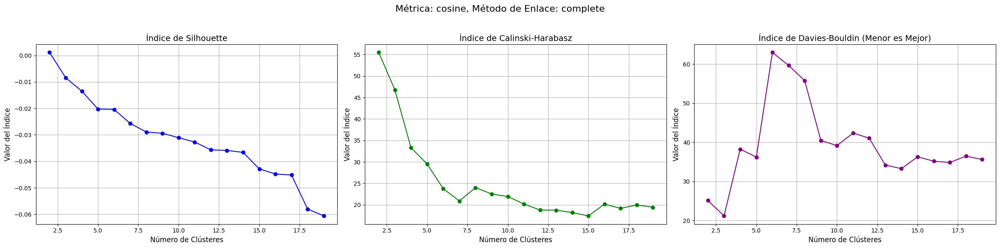


Evaluando average con euclidean:
n_clusters=2: Silhouette=0.1056, Calinski-Harabasz=15.4914, Davies-Bouldin=3.7974
n_clusters=3: Silhouette=-0.1147, Calinski-Harabasz=8.0712, Davies-Bouldin=5.9842
n_clusters=4: Silhouette=-0.1223, Calinski-Harabasz=6.9412, Davies-Bouldin=8.4861
n_clusters=5: Silhouette=-0.1263, Calinski-Harabasz=5.9539, Davies-Bouldin=9.4552
n_clusters=6: Silhouette=-0.1298, Calinski-Harabasz=5.7253, Davies-Bouldin=15.3332
n_clusters=7: Silhouette=-0.1449, Calinski-Harabasz=5.4675, Davies-Bouldin=13.8084
n_clusters=8: Silhouette=-0.1457, Calinski-Harabasz=5.4426, Davies-Bouldin=14.3056
n_clusters=9: Silhouette=-0.1646, Calinski-Harabasz=4.9027, Davies-Bouldin=13.1634
n_clusters=10: Silhouette=-0.1641, Calinski-Harabasz=8.5499, Davies-Bouldin=16.3377
n_clusters=11: Silhouette=-0.1679, Calinski-Harabasz=7.9538, Davies-Bouldin=15.6204
n_clusters=12: Silhouette=-0.1677, Calinski-Harabasz=8.6219, Davies-Bouldin=18.0862
n_clusters=13: Silhouette=-0.1885, Calinski-Harabasz=8

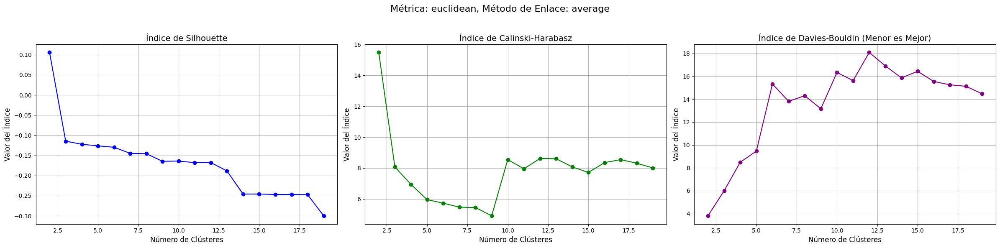


Evaluando average con manhattan:
n_clusters=2: Silhouette=0.0827, Calinski-Harabasz=8.2636, Davies-Bouldin=1.8786
n_clusters=3: Silhouette=-0.0947, Calinski-Harabasz=4.6438, Davies-Bouldin=12.0390
n_clusters=4: Silhouette=-0.1271, Calinski-Harabasz=5.8710, Davies-Bouldin=10.2037
n_clusters=5: Silhouette=-0.1617, Calinski-Harabasz=12.1956, Davies-Bouldin=8.4588
n_clusters=6: Silhouette=-0.1698, Calinski-Harabasz=13.2746, Davies-Bouldin=7.8234
n_clusters=7: Silhouette=-0.1723, Calinski-Harabasz=12.5425, Davies-Bouldin=10.0586
n_clusters=8: Silhouette=-0.1722, Calinski-Harabasz=10.8679, Davies-Bouldin=17.4806
n_clusters=9: Silhouette=-0.1722, Calinski-Harabasz=9.8766, Davies-Bouldin=17.0245
n_clusters=10: Silhouette=-0.1870, Calinski-Harabasz=9.4712, Davies-Bouldin=16.0029
n_clusters=11: Silhouette=-0.2046, Calinski-Harabasz=9.4560, Davies-Bouldin=14.8855
n_clusters=12: Silhouette=-0.2126, Calinski-Harabasz=9.3101, Davies-Bouldin=13.9831
n_clusters=13: Silhouette=-0.2143, Calinski-Haraba

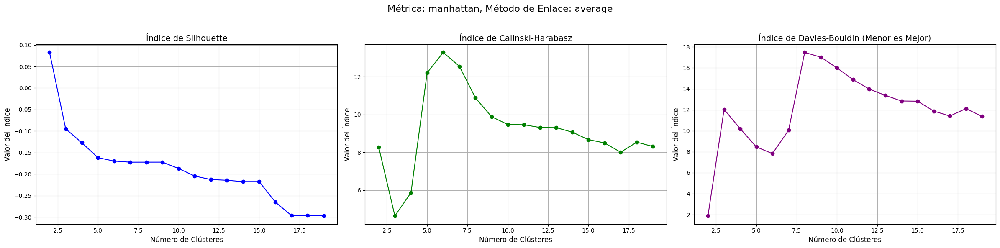


Evaluando average con cosine:
n_clusters=2: Silhouette=-0.0020, Calinski-Harabasz=30.5134, Davies-Bouldin=29.1649
n_clusters=3: Silhouette=-0.0089, Calinski-Harabasz=18.7835, Davies-Bouldin=46.7014
n_clusters=4: Silhouette=-0.0145, Calinski-Harabasz=21.6209, Davies-Bouldin=63.2715
n_clusters=5: Silhouette=-0.0161, Calinski-Harabasz=19.1328, Davies-Bouldin=68.1334
n_clusters=6: Silhouette=-0.0163, Calinski-Harabasz=15.8508, Davies-Bouldin=104.8385
n_clusters=7: Silhouette=-0.0188, Calinski-Harabasz=14.3986, Davies-Bouldin=96.1271
n_clusters=8: Silhouette=-0.0366, Calinski-Harabasz=14.8972, Davies-Bouldin=87.0304
n_clusters=9: Silhouette=-0.0390, Calinski-Harabasz=14.6574, Davies-Bouldin=83.9679
n_clusters=10: Silhouette=-0.0409, Calinski-Harabasz=13.8729, Davies-Bouldin=80.7486
n_clusters=11: Silhouette=-0.1092, Calinski-Harabasz=13.1276, Davies-Bouldin=73.6607
n_clusters=12: Silhouette=-0.1099, Calinski-Harabasz=13.4066, Davies-Bouldin=52.1412
n_clusters=13: Silhouette=-0.1113, Calins

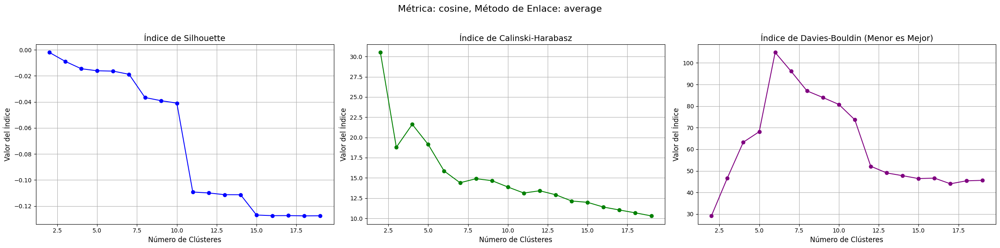


Evaluando single con euclidean:
n_clusters=2: Silhouette=0.0057, Calinski-Harabasz=1.1464, Davies-Bouldin=0.8861
n_clusters=3: Silhouette=-0.2185, Calinski-Harabasz=1.0792, Davies-Bouldin=0.9241
n_clusters=4: Silhouette=-0.2304, Calinski-Harabasz=1.4535, Davies-Bouldin=0.8529
n_clusters=5: Silhouette=-0.2689, Calinski-Harabasz=1.2847, Davies-Bouldin=0.9238
n_clusters=6: Silhouette=-0.3208, Calinski-Harabasz=1.3990, Davies-Bouldin=0.8859
n_clusters=7: Silhouette=-0.3813, Calinski-Harabasz=1.2253, Davies-Bouldin=1.0594
n_clusters=8: Silhouette=-0.4035, Calinski-Harabasz=1.2714, Davies-Bouldin=1.0223
n_clusters=9: Silhouette=-0.4858, Calinski-Harabasz=1.1594, Davies-Bouldin=1.0808
n_clusters=10: Silhouette=-0.4982, Calinski-Harabasz=1.1222, Davies-Bouldin=1.0772
n_clusters=11: Silhouette=-0.4982, Calinski-Harabasz=1.0762, Davies-Bouldin=1.3828
n_clusters=12: Silhouette=-0.5153, Calinski-Harabasz=0.9948, Davies-Bouldin=1.4533
n_clusters=13: Silhouette=-0.5285, Calinski-Harabasz=0.9769, Da

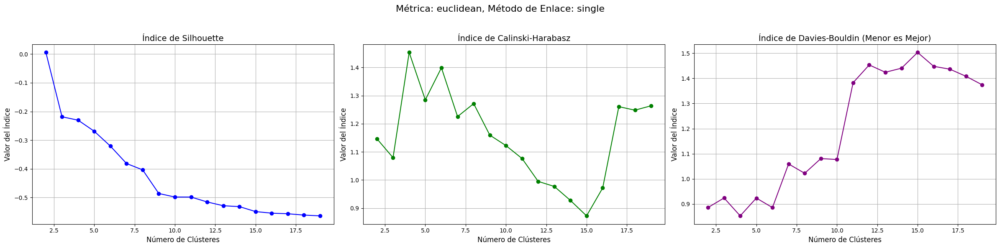


Evaluando single con manhattan:
n_clusters=2: Silhouette=0.2242, Calinski-Harabasz=2.3612, Davies-Bouldin=0.6174
n_clusters=3: Silhouette=-0.0422, Calinski-Harabasz=1.8658, Davies-Bouldin=0.7461
n_clusters=4: Silhouette=-0.1849, Calinski-Harabasz=1.6260, Davies-Bouldin=0.8000
n_clusters=5: Silhouette=-0.2319, Calinski-Harabasz=1.6445, Davies-Bouldin=0.7855
n_clusters=6: Silhouette=-0.2370, Calinski-Harabasz=1.5849, Davies-Bouldin=0.7909
n_clusters=7: Silhouette=-0.3645, Calinski-Harabasz=1.3577, Davies-Bouldin=1.1269
n_clusters=8: Silhouette=-0.4022, Calinski-Harabasz=1.3043, Davies-Bouldin=1.1056
n_clusters=9: Silhouette=-0.4145, Calinski-Harabasz=1.1857, Davies-Bouldin=1.1597
n_clusters=10: Silhouette=-0.4282, Calinski-Harabasz=1.3025, Davies-Bouldin=1.1071
n_clusters=11: Silhouette=-0.4367, Calinski-Harabasz=1.3925, Davies-Bouldin=1.0646
n_clusters=12: Silhouette=-0.4480, Calinski-Harabasz=1.4587, Davies-Bouldin=1.0301
n_clusters=13: Silhouette=-0.4748, Calinski-Harabasz=1.4141, Da

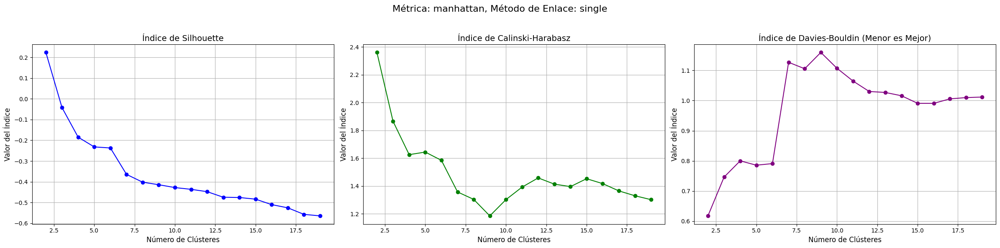


Evaluando single con cosine:
n_clusters=2: Silhouette=-0.1167, Calinski-Harabasz=0.6547, Davies-Bouldin=1.1726
n_clusters=3: Silhouette=-0.2197, Calinski-Harabasz=0.9630, Davies-Bouldin=1.0622
n_clusters=4: Silhouette=-0.3746, Calinski-Harabasz=0.7884, Davies-Bouldin=1.2194
n_clusters=5: Silhouette=-0.4016, Calinski-Harabasz=0.8344, Davies-Bouldin=1.1680
n_clusters=6: Silhouette=-0.4482, Calinski-Harabasz=0.7662, Davies-Bouldin=1.1984
n_clusters=7: Silhouette=-0.4751, Calinski-Harabasz=0.7626, Davies-Bouldin=1.1843
n_clusters=8: Silhouette=-0.4853, Calinski-Harabasz=0.8377, Davies-Bouldin=1.1407
n_clusters=9: Silhouette=-0.5039, Calinski-Harabasz=0.8995, Davies-Bouldin=1.1053
n_clusters=10: Silhouette=-0.5085, Calinski-Harabasz=0.9885, Davies-Bouldin=1.0675
n_clusters=11: Silhouette=-0.5095, Calinski-Harabasz=1.1047, Davies-Bouldin=1.0293
n_clusters=12: Silhouette=-0.5109, Calinski-Harabasz=1.1330, Davies-Bouldin=1.0100
n_clusters=13: Silhouette=-0.5190, Calinski-Harabasz=1.1295, Davi

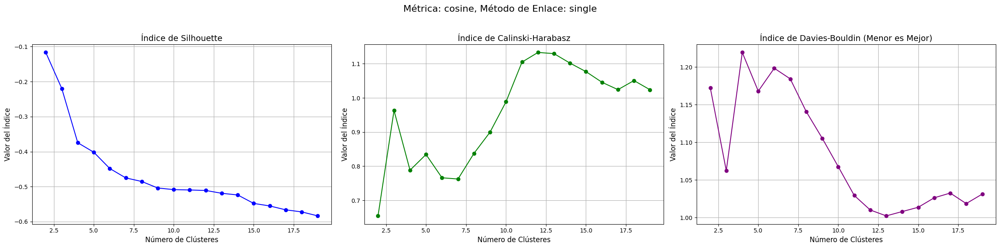

In [115]:
from sklearn.cluster import AgglomerativeClustering
import numpy as np
from matplotlib import pyplot as plt
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']
n_clusters_range = range(2, 20) 

results = {
    'silhouette': [],
    'calinski_harabasz': [],
    'davies_bouldin': []
}

# Para los promedios por n_clusters
silhouette_results = {n: [] for n in n_clusters_range}
calinski_harabasz_results = {n: [] for n in n_clusters_range}
davies_bouldin_results = {n: [] for n in n_clusters_range}

for linkage in linkages:
    for metric in metrics:
        if linkage == 'ward' and metric != 'euclidean': 
            continue

        silhouette_scores = []
        calinski_harabasz_scores = []
        davies_bouldin_scores = []


        print(f"\nEvaluando {linkage} con {metric}:")
        for n_clusters in n_clusters_range:
            try:
                model = AgglomerativeClustering(
                    n_clusters=n_clusters, linkage=linkage, metric=metric
                )
                model = model.fit(X_pca)
                labels = model.labels_

                silhouette_avg = silhouette_score(X, labels)
                calinski_harabasz = calinski_harabasz_score(X, labels)
                davies_bouldin = davies_bouldin_score(X, labels)

                results['silhouette'].append({
                    'value': silhouette_avg,
                    'n_clusters': n_clusters,
                    'linkage': linkage,
                    'metric': metric
                })
                results['calinski_harabasz'].append({
                    'value': calinski_harabasz,
                    'n_clusters': n_clusters,
                    'linkage': linkage,
                    'metric': metric
                })
                results['davies_bouldin'].append({
                    'value': davies_bouldin,
                    'n_clusters': n_clusters,
                    'linkage': linkage,
                    'metric': metric
                })
                
                silhouette_scores.append(silhouette_avg)
                calinski_harabasz_scores.append(calinski_harabasz)
                davies_bouldin_scores.append(davies_bouldin)

                silhouette_results[n_clusters].append(silhouette_avg)
                calinski_harabasz_results[n_clusters].append(calinski_harabasz)
                davies_bouldin_results[n_clusters].append(davies_bouldin)

                print(f"n_clusters={n_clusters}: Silhouette={silhouette_avg:.4f}, "
                      f"Calinski-Harabasz={calinski_harabasz:.4f}, "
                      f"Davies-Bouldin={davies_bouldin:.4f}")

            except Exception as e:
                print(f"Error con n_clusters={n_clusters}: {e}")
                silhouette_scores.append(np.nan)
                calinski_harabasz_scores.append(np.nan)
                davies_bouldin_scores.append(np.nan)


        fig, axes = plt.subplots(1, 3, figsize=(24, 6))
        fig.suptitle(f"Métrica: {metric}, Método de Enlace: {linkage}", fontsize=16)

        axes[0].plot(n_clusters_range, silhouette_scores, marker="o", color="blue", label="Silhouette")
        axes[0].set_title("Índice de Silhouette", fontsize=14)
        axes[0].set_xlabel("Número de Clústeres", fontsize=12)
        axes[0].set_ylabel("Valor del Índice", fontsize=12)
        axes[0].grid(True)

        axes[1].plot(n_clusters_range, calinski_harabasz_scores, marker="o", color="green", label="Calinski-Harabasz")
        axes[1].set_title("Índice de Calinski-Harabasz", fontsize=14)
        axes[1].set_xlabel("Número de Clústeres", fontsize=12)
        axes[1].set_ylabel("Valor del Índice", fontsize=12)
        axes[1].grid(True)

        axes[2].plot(n_clusters_range, davies_bouldin_scores, marker="o", color="purple", label="Davies-Bouldin")
        axes[2].set_title("Índice de Davies-Bouldin (Menor es Mejor)", fontsize=14)
        axes[2].set_xlabel("Número de Clústeres", fontsize=12)
        axes[2].set_ylabel("Valor del Índice", fontsize=12)
        axes[2].grid(True)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


Mejor n_clusters según Silhouette: 2
Mejor n_clusters según Calinski-Harabasz: 6
Mejor n_clusters según Davies-Bouldin: 3


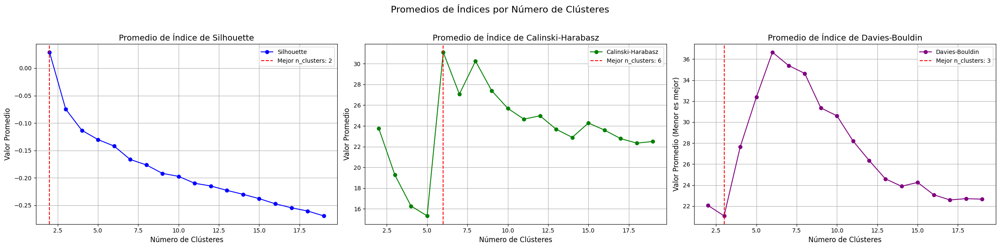

In [116]:
silhouette_means = {n: np.nanmean(silhouette_results[n]) for n in n_clusters_range}
calinski_harabasz_means = {n: np.nanmean(calinski_harabasz_results[n]) for n in n_clusters_range}
davies_bouldin_means = {n: np.nanmean(davies_bouldin_results[n]) for n in n_clusters_range}

best_n_silhouette = max(silhouette_means, key=silhouette_means.get)
best_n_calinski = max(calinski_harabasz_means, key=calinski_harabasz_means.get)
best_n_davies = min(davies_bouldin_means, key=davies_bouldin_means.get)  

print(f"\nMejor n_clusters según Silhouette: {best_n_silhouette}")
print(f"Mejor n_clusters según Calinski-Harabasz: {best_n_calinski}")
print(f"Mejor n_clusters según Davies-Bouldin: {best_n_davies}")

fig, axes = plt.subplots(1, 3, figsize=(24, 6))
fig.suptitle("Promedios de Índices por Número de Clústeres", fontsize=16)

axes[0].plot(n_clusters_range, list(silhouette_means.values()), marker="o", color="blue", label="Silhouette")
axes[0].set_title("Promedio de Índice de Silhouette", fontsize=14)
axes[0].set_xlabel("Número de Clústeres", fontsize=12)
axes[0].set_ylabel("Valor Promedio", fontsize=12)
axes[0].grid(True)
axes[0].axvline(x=best_n_silhouette, color="red", linestyle="--", label=f"Mejor n_clusters: {best_n_silhouette}")
axes[0].legend()

axes[1].plot(n_clusters_range, list(calinski_harabasz_means.values()), marker="o", color="green", label="Calinski-Harabasz")
axes[1].set_title("Promedio de Índice de Calinski-Harabasz", fontsize=14)
axes[1].set_xlabel("Número de Clústeres", fontsize=12)
axes[1].set_ylabel("Valor Promedio", fontsize=12)
axes[1].grid(True)
axes[1].axvline(x=best_n_calinski, color="red", linestyle="--", label=f"Mejor n_clusters: {best_n_calinski}")
axes[1].legend()

axes[2].plot(n_clusters_range, list(davies_bouldin_means.values()), marker="o", color="purple", label="Davies-Bouldin")
axes[2].set_title("Promedio de Índice de Davies-Bouldin", fontsize=14)
axes[2].set_xlabel("Número de Clústeres", fontsize=12)
axes[2].set_ylabel("Valor Promedio (Menor es mejor)", fontsize=12)
axes[2].grid(True)
axes[2].axvline(x=best_n_davies, color="red", linestyle="--", label=f"Mejor n_clusters: {best_n_davies}")
axes[2].legend()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [117]:
best_silhouette = max(results['silhouette'], key=lambda x: x['value'])
best_calinski = max(results['calinski_harabasz'], key=lambda x: x['value'])
best_davies = min(results['davies_bouldin'], key=lambda x: x['value'])  # Menor es mejor

print("\nMejores configuraciones:")
print(f"Silhouette: {best_silhouette}")
print(f"Calinski-Harabasz: {best_calinski}")
print(f"Davies-Bouldin: {best_davies}")



Mejores configuraciones:
Silhouette: {'value': np.float64(0.22416706842796955), 'n_clusters': 2, 'linkage': 'single', 'metric': 'manhattan'}
Calinski-Harabasz: {'value': np.float64(217.6593660860199), 'n_clusters': 8, 'linkage': 'complete', 'metric': 'manhattan'}
Davies-Bouldin: {'value': np.float64(0.6174357823484912), 'n_clusters': 2, 'linkage': 'single', 'metric': 'manhattan'}


#### 2.5 ¿Cuál es el número óptimo de clusters? ¿por qué?.

Como hemos podido observar en las gráficas anteriores, el número óptimo de clusters es 2. El índice de Silhouette es la métrica más fiable de las tres y además este valor logra buenos resultados con el resto de métricas. 
De esta forma, podemos concluir que utilizando algoritmos de clustering jerárquico, agrupar nuestros datos en 2 clusters es la mejor decisión según los índices elegidos.

Para hacer un estudio posterior de algoritmos de clustering, vamos a guardar los mejors resultados por n_clusters (con los tres índices estudiados) en un dataframe que vamos a llamarlo 'resultados_clustering.csv'.

In [770]:
silhouette_data = [{'Algoritmo': 'AglomerativeClustering', 'Indice': 'Silhouette', 'Valor': x['value'], 'N_clusters': x['n_clusters']} for x in results['silhouette']]
calinski_data = [{'Algoritmo': 'AglomerativeClustering', 'Indice': 'Calinski-Harabasz', 'Valor': x['value'], 'N_clusters': x['n_clusters']} for x in results['calinski_harabasz']]
davies_data = [{'Algoritmo': 'AglomerativeClustering', 'Indice': 'Davies-Bouldin', 'Valor': x['value'], 'N_clusters': x['n_clusters']} for x in results['davies_bouldin']]

all_results = silhouette_data + calinski_data + davies_data
df_all_results = pd.DataFrame(all_results)

Ahora, nos quedamos con la mejor métrica en función del índice por cada n_cluster

In [771]:
df_best_results = df_all_results.loc[df_all_results.groupby(['N_clusters', 'Indice'])['Valor'].idxmax()]

df_best_results.sort_values(by=['N_clusters', 'Indice'], inplace=True)

El dataframe nos queda de la siguiente forma

In [772]:
df_best_results

,Algoritmo,Indice,Valor,N_clusters
216,AglomerativeClustering,Calinski-Harabasz,92.157137,2
378,AglomerativeClustering,Davies-Bouldin,111.945956,2
144,AglomerativeClustering,Silhouette,0.224167,2
217,AglomerativeClustering,Calinski-Harabasz,60.208460,3
379,AglomerativeClustering,Davies-Bouldin,52.895047,3
55,AglomerativeClustering,Silhouette,-0.008431,3
218,AglomerativeClustering,Calinski-Harabasz,47.553087,4
362,AglomerativeClustering,Davies-Bouldin,67.380669,4
20,AglomerativeClustering,Silhouette,-0.012510,4
219,AglomerativeClustering,Calinski-Harabasz,45.902074,5


In [773]:
df_best_results.to_csv('resultados_clustering.csv', index=False)

print("Resultados detallados y mejorados guardados en 'resultados_mejorados_clustering.csv'")

Resultados detallados y mejorados guardados en 'resultados_mejorados_clustering.csv'


### 2.6 Queremos conocer, con ayuda de métodos de clustering, las zonas con mayor índice de siniestralidad para cada tipo de vehículo. Ayúdate de diferentes modelos para hacer un análisis detallado de esta relación.

##### Primer enfoque

Para realizar este ejercicio, vamos a hacer un enfoque inicial para entender el problema. vamos a agrupar las columnas de vehículo sin especificar el tipo. Para ello, vamos a utilizar las columnas referentes a los tipos de vehículos y a las zonas/distritos donde han ocurrido accidentes. Les aplicamos reducción de dimensionalidad con PCA para poder ver los resultados gráficamente y estudiamos su dendograma.

In [793]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import matplotlib.pyplot as plt

vehiculo_columns = [col for col in df.columns if col.startswith('tipo_vehiculo_')] 
distrito_columns = [col for col in df.columns if col.startswith('distrito_')] 

features = vehiculo_columns + distrito_columns
X_zonas_siniestralidad = df[features].values

pca = PCA(n_components=2)
X_pca_sini = pca.fit_transform(X_zonas_siniestralidad)
df['PCA1'], df['PCA2'] = X_pca_sini[:, 0], X_pca_sini[:, 1]

Z = linkage(X_zonas_siniestralidad, method='average') 

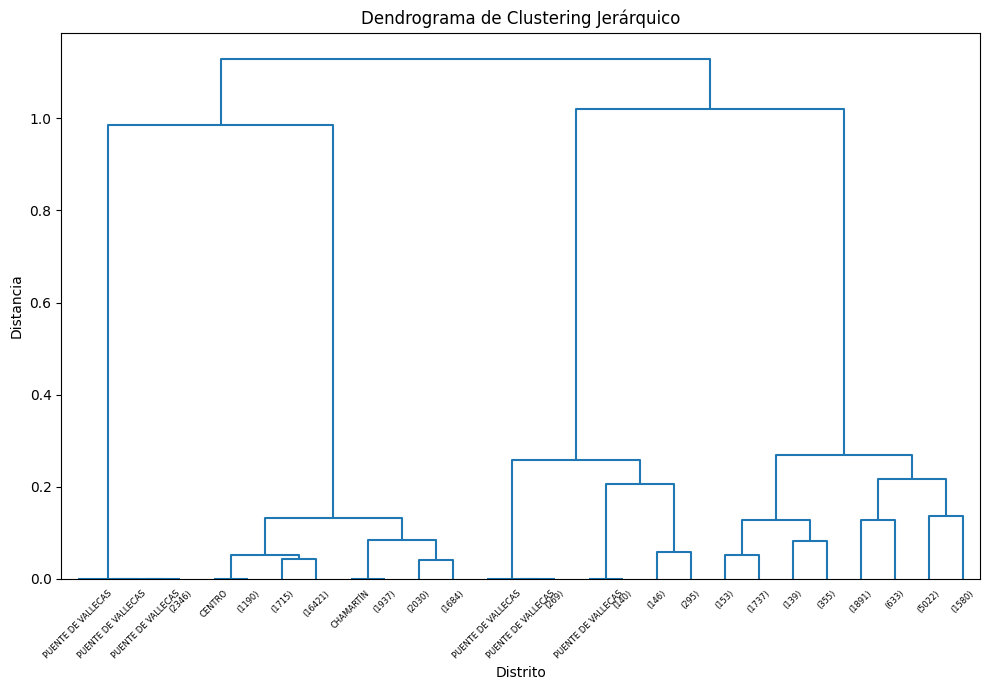

In [799]:
plt.figure(figsize=(10, 7))
dendrogram(Z, labels=df['distrito'].values, leaf_rotation=90, leaf_font_size=6, color_threshold=0, truncate_mode='level', p=4)
plt.title('Dendrograma de Clustering Jerárquico')
plt.xlabel('Distrito')
plt.ylabel('Distancia')
plt.xticks(rotation=45)

plt.tight_layout() 
plt.show()

En función del dendrograma, vemos claramente cómo se agrupan en seguida 4 clusters y están muy separados entre sí, por lo que todo apunta a que 4 es el número óptimo de clusters. De esta forma, ejecutamos un algoritmo de clustering jerárquico con 4 clusters y graficamos con la representación de pca que hemos generado en la celda anterior.

         distrito
cluster          
1            2349
2           24979
3             853
4           11510


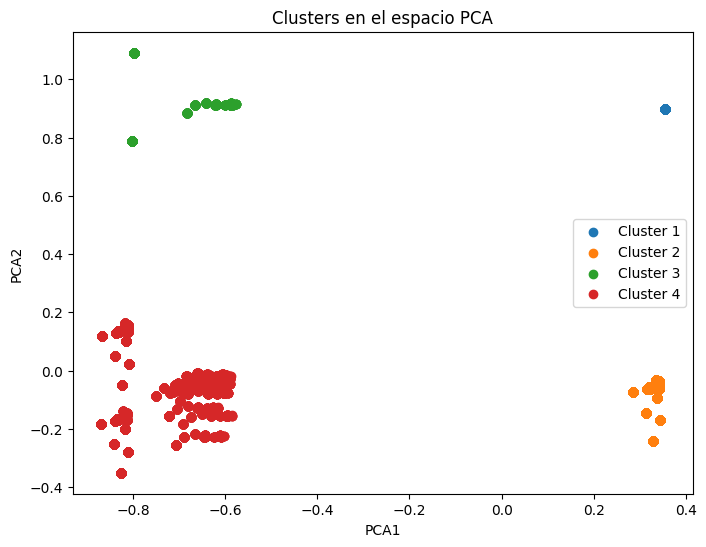

In [800]:
num_clusters = 4 
df['cluster'] = fcluster(Z, t=num_clusters, criterion='maxclust')

print(df[['distrito', 'cluster']].groupby('cluster').count())

plt.figure(figsize=(8, 6))
for cluster in np.unique(df['cluster']):
    cluster_data = df[df['cluster'] == cluster]
    plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label=f'Cluster {cluster}')
plt.title('Clusters en el espacio PCA')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()


Vemos cómo hemos agrupado en cuatro conjuntos nuestros datos. Ahora vamos a hacerlo iterando por cada tipo de vehículo.

La estrategia es la misma, solo que en vez de analizar el dendrograma a mano, utilizamos el índice de Silhouette para automatizar el proceso. Los resultados de los clusters por cada vehículo, los vamos metiendo como nuevas columnas en nuestro DataFrame y así poder analizarlos posteriormente.

Análisis para tipo_vehiculo_Autobus EMT:
Varianza explicada por PCA: [0.08338247 0.07524503]


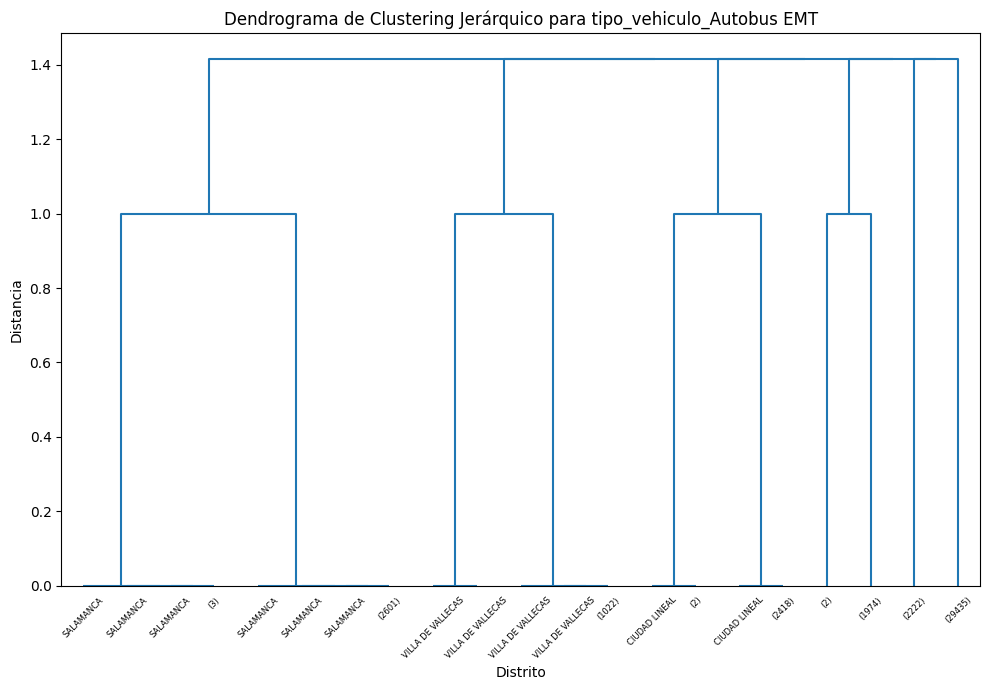

Número de clusters: 2, Silhouette Score: 0.1186
Número de clusters: 3, Silhouette Score: 0.1450
Número de clusters: 4, Silhouette Score: 0.2053
Número de clusters: 5, Silhouette Score: 0.2552
Número de clusters: 6, Silhouette Score: 0.3108
Número de clusters: 7, Silhouette Score: 0.3481
Número de clusters: 8, Silhouette Score: 0.4173
Número de clusters: 9, Silhouette Score: 0.4457
Número óptimo de clusters: 9, con Silhouette Score: 0.4457


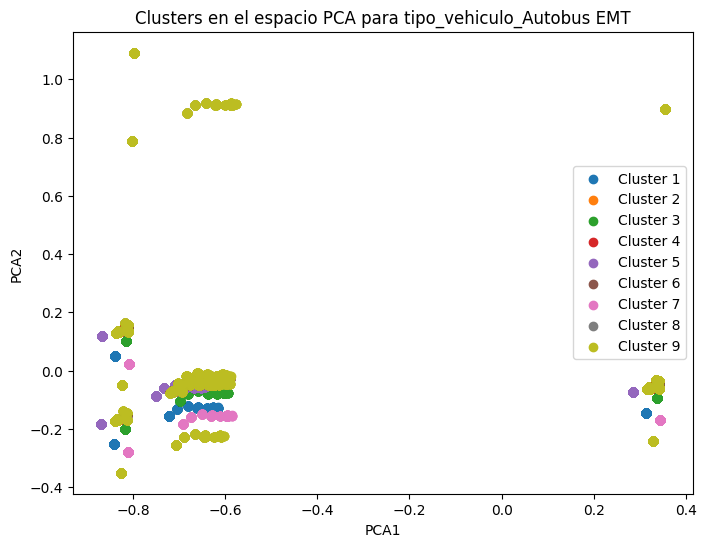

Análisis para tipo_vehiculo_Autobús:
Varianza explicada por PCA: [0.08079562 0.07291219]


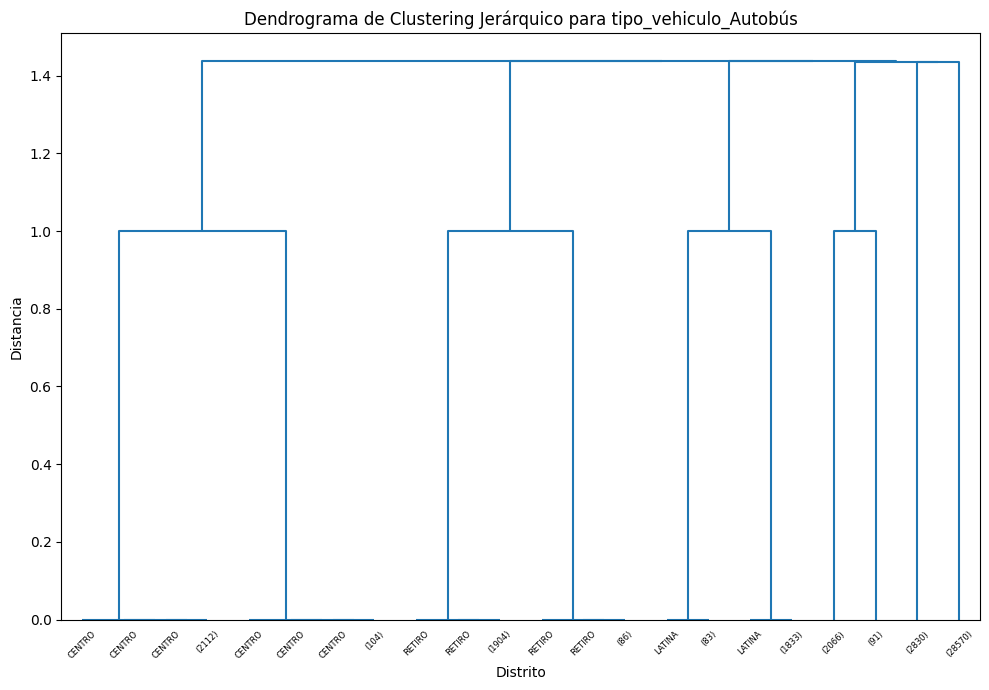

Número de clusters: 2, Silhouette Score: 0.1072
Número de clusters: 3, Silhouette Score: 0.1542
Número de clusters: 4, Silhouette Score: 0.2002
Número de clusters: 5, Silhouette Score: 0.2514
Número de clusters: 6, Silhouette Score: 0.3170
Número de clusters: 7, Silhouette Score: 0.3619
Número de clusters: 8, Silhouette Score: 0.4097
Número de clusters: 9, Silhouette Score: 0.4370
Número óptimo de clusters: 9, con Silhouette Score: 0.4370


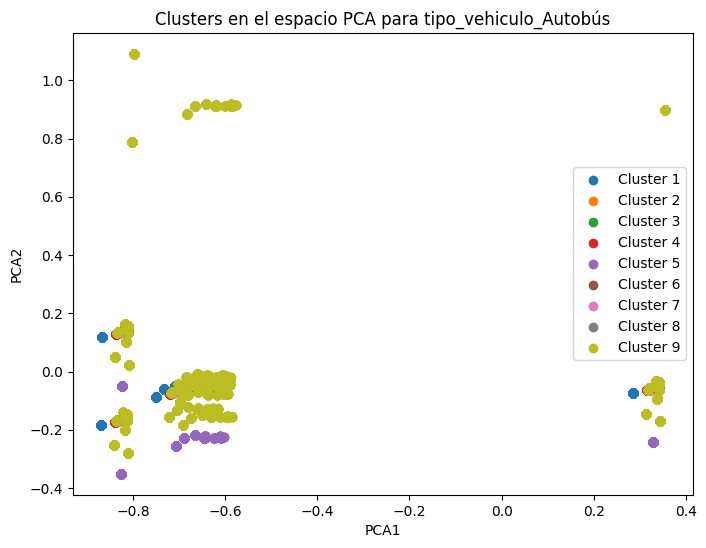

Análisis para tipo_vehiculo_Autocaravana:
Varianza explicada por PCA: [0.08339576 0.07525705]


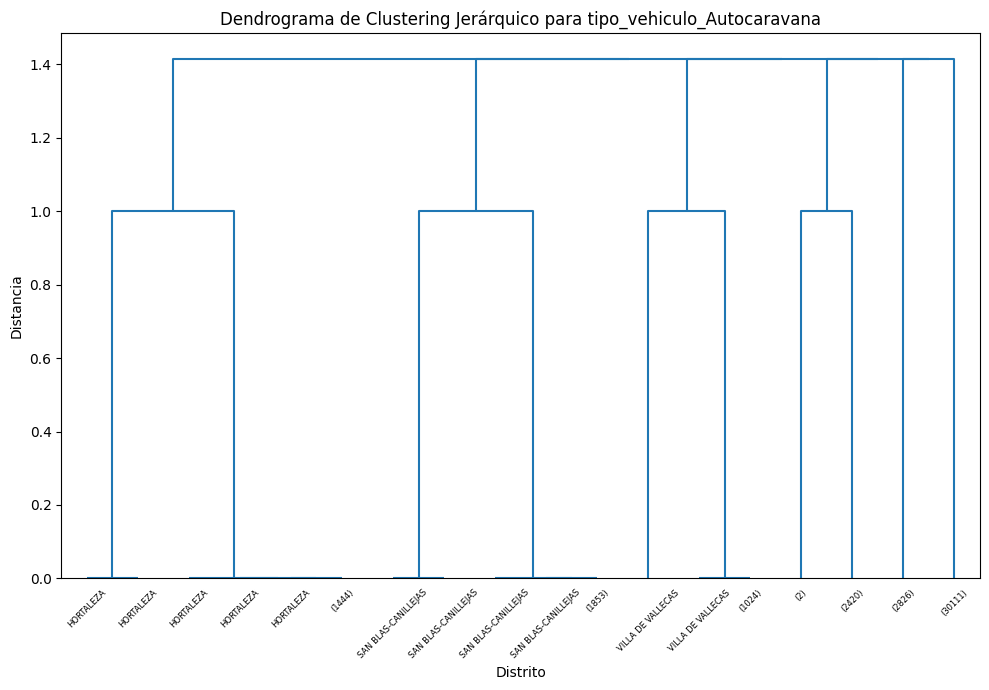

Número de clusters: 2, Silhouette Score: 0.0908
Número de clusters: 3, Silhouette Score: 0.1378
Número de clusters: 4, Silhouette Score: 0.1645
Número de clusters: 5, Silhouette Score: 0.2250
Número de clusters: 6, Silhouette Score: 0.2946
Número de clusters: 7, Silhouette Score: 0.3381
Número de clusters: 8, Silhouette Score: 0.3890
Número de clusters: 9, Silhouette Score: 0.4175
Número óptimo de clusters: 9, con Silhouette Score: 0.4175


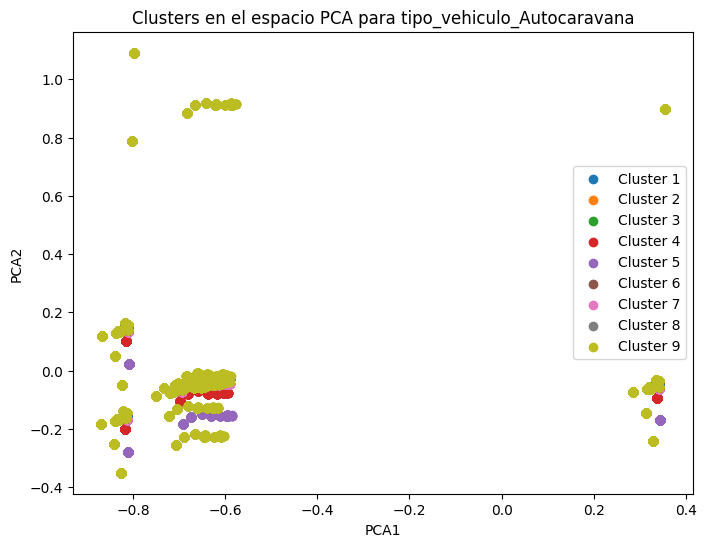

Análisis para tipo_vehiculo_Bicicleta:
Varianza explicada por PCA: [0.08198497 0.0739853 ]


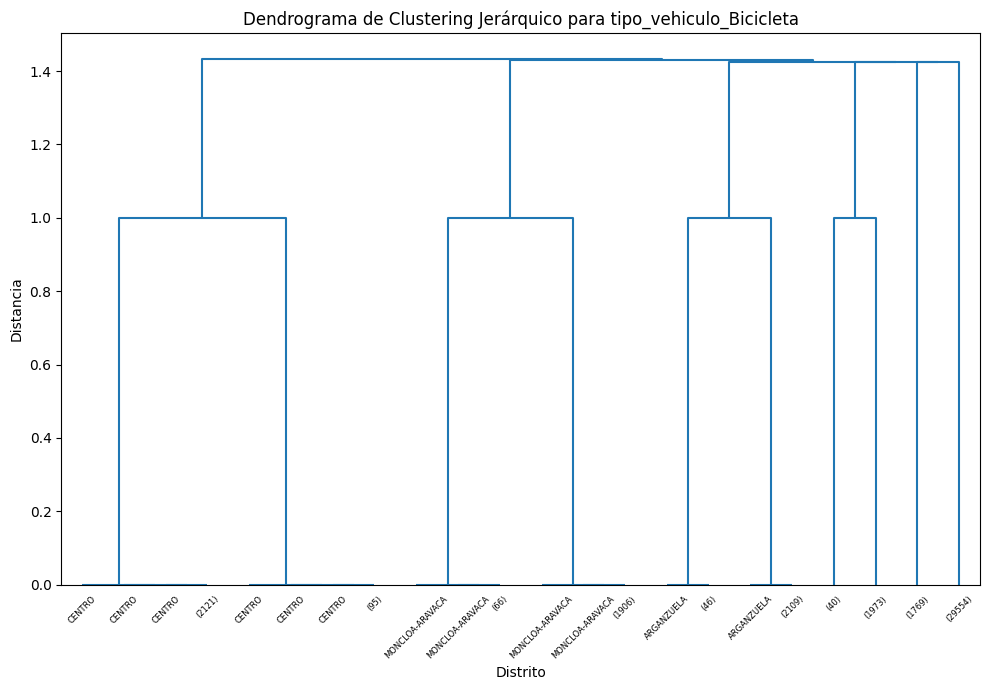

Número de clusters: 2, Silhouette Score: 0.1108
Número de clusters: 3, Silhouette Score: 0.1569
Número de clusters: 4, Silhouette Score: 0.2074
Número de clusters: 5, Silhouette Score: 0.2567
Número de clusters: 6, Silhouette Score: 0.3006
Número de clusters: 7, Silhouette Score: 0.3371
Número de clusters: 8, Silhouette Score: 0.3847
Número de clusters: 9, Silhouette Score: 0.4020
Número óptimo de clusters: 9, con Silhouette Score: 0.4020


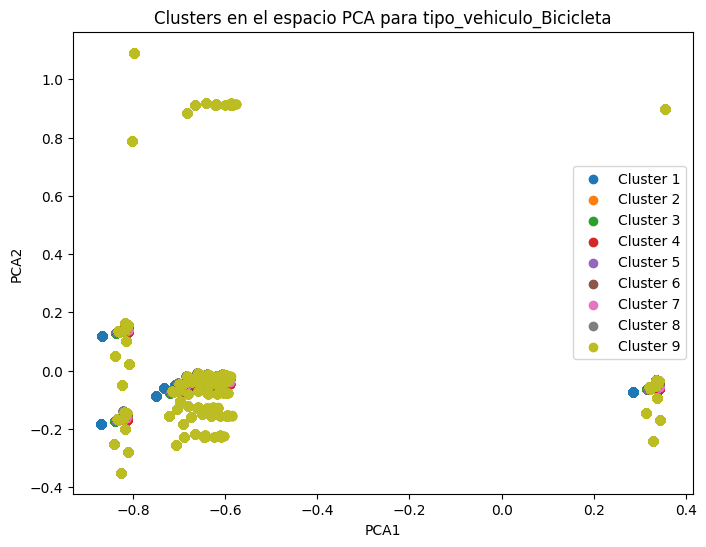

Análisis para tipo_vehiculo_Bicicleta EPAC (pedaleo asistido):
Varianza explicada por PCA: [0.082957   0.07486199]


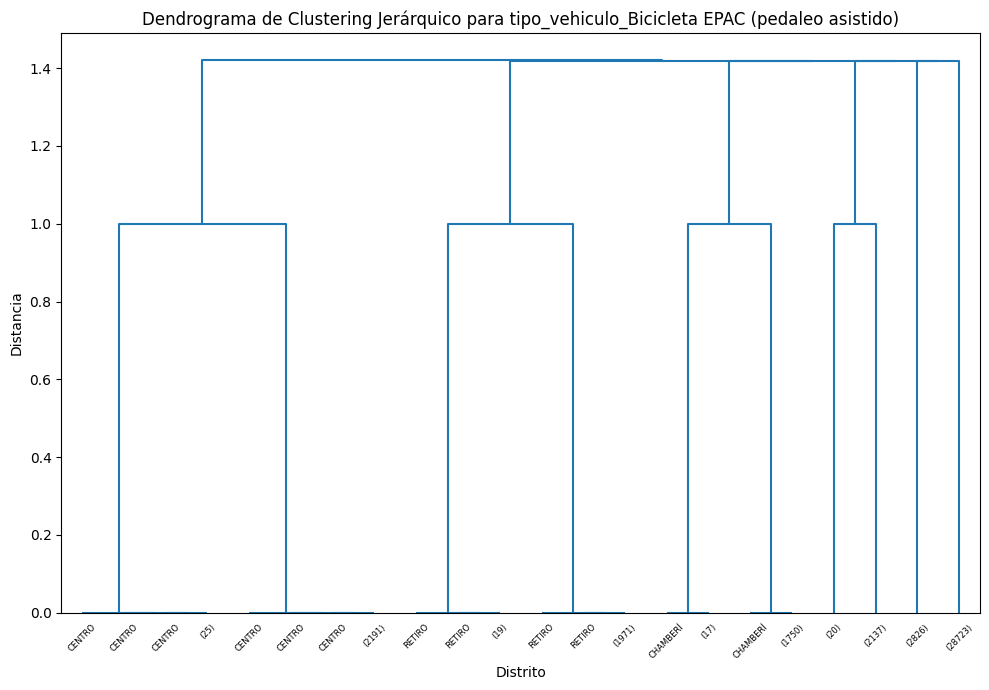

Número de clusters: 2, Silhouette Score: 0.1096
Número de clusters: 3, Silhouette Score: 0.1590
Número de clusters: 4, Silhouette Score: 0.2034
Número de clusters: 5, Silhouette Score: 0.2569
Número de clusters: 6, Silhouette Score: 0.3255
Número de clusters: 7, Silhouette Score: 0.3892
Número de clusters: 8, Silhouette Score: 0.4486
Número de clusters: 9, Silhouette Score: 0.4967
Número óptimo de clusters: 9, con Silhouette Score: 0.4967


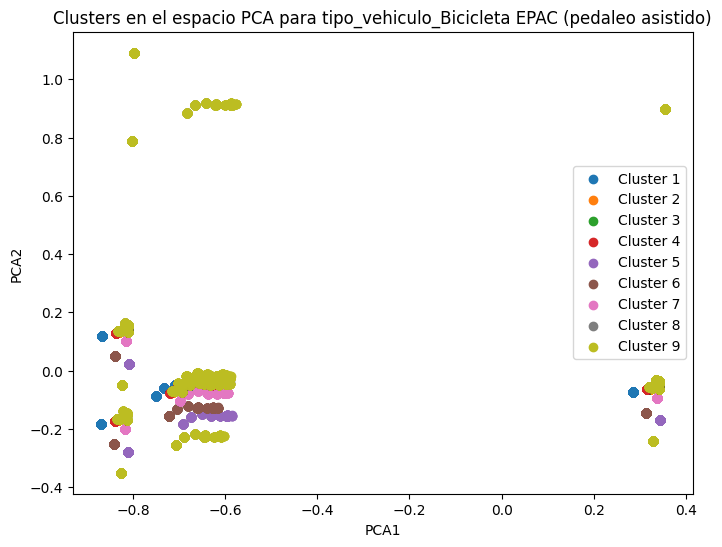

Análisis para tipo_vehiculo_Camión rígido:
Varianza explicada por PCA: [0.08138481 0.07344222]


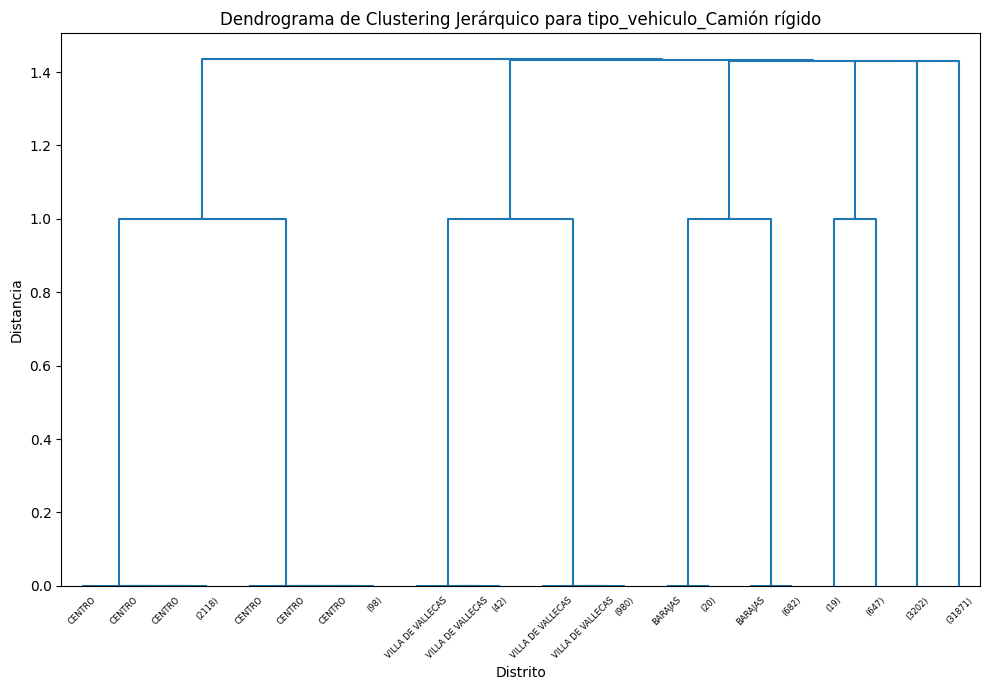

Número de clusters: 2, Silhouette Score: 0.1089
Número de clusters: 3, Silhouette Score: 0.1337
Número de clusters: 4, Silhouette Score: 0.1490
Número de clusters: 5, Silhouette Score: 0.1656
Número de clusters: 6, Silhouette Score: 0.2408
Número de clusters: 7, Silhouette Score: 0.2864
Número de clusters: 8, Silhouette Score: 0.3286
Número de clusters: 9, Silhouette Score: 0.3911
Número óptimo de clusters: 9, con Silhouette Score: 0.3911


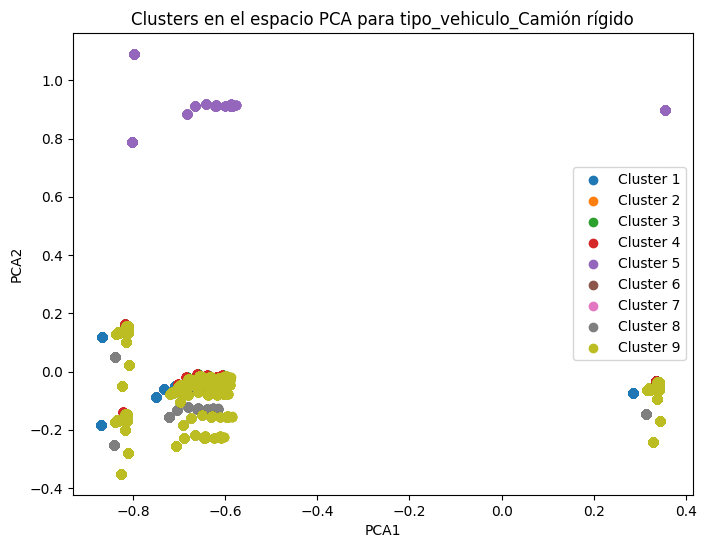

Análisis para tipo_vehiculo_Ciclo:
Varianza explicada por PCA: [0.08339131 0.07525303]


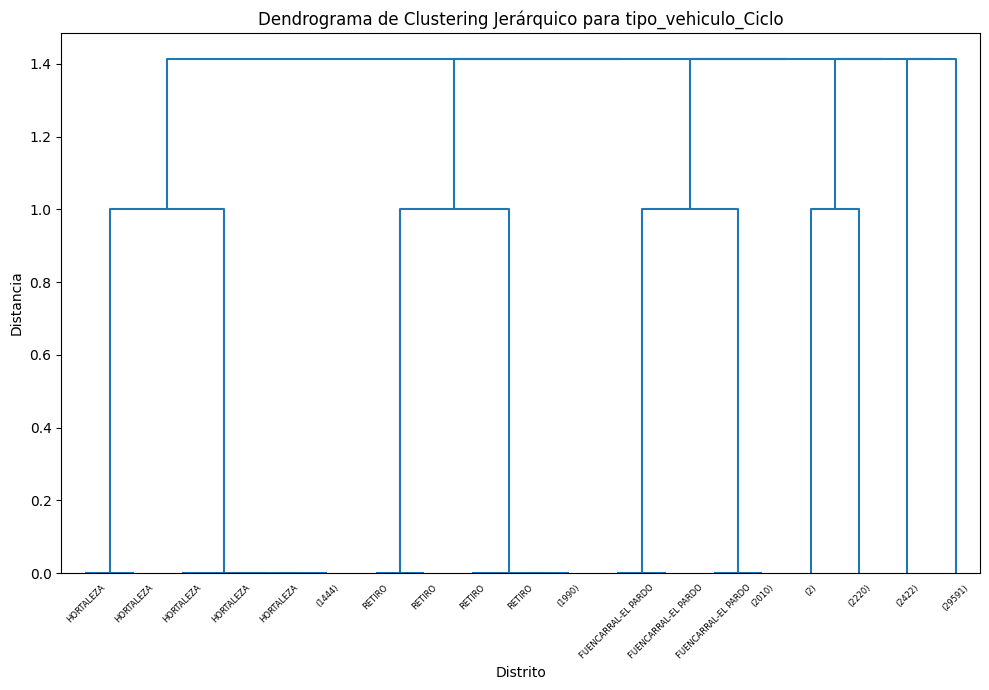

Número de clusters: 2, Silhouette Score: 0.0908
Número de clusters: 3, Silhouette Score: 0.1411
Número de clusters: 4, Silhouette Score: 0.1920
Número de clusters: 5, Silhouette Score: 0.2478
Número de clusters: 6, Silhouette Score: 0.3082
Número de clusters: 7, Silhouette Score: 0.3582
Número de clusters: 8, Silhouette Score: 0.4125
Número de clusters: 9, Silhouette Score: 0.4893
Número óptimo de clusters: 9, con Silhouette Score: 0.4893


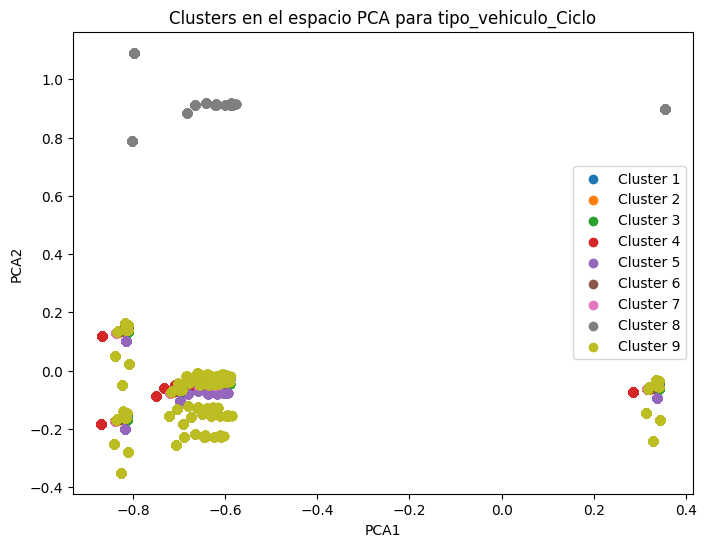

Análisis para tipo_vehiculo_Ciclomotor:
Varianza explicada por PCA: [0.08257911 0.07451892]


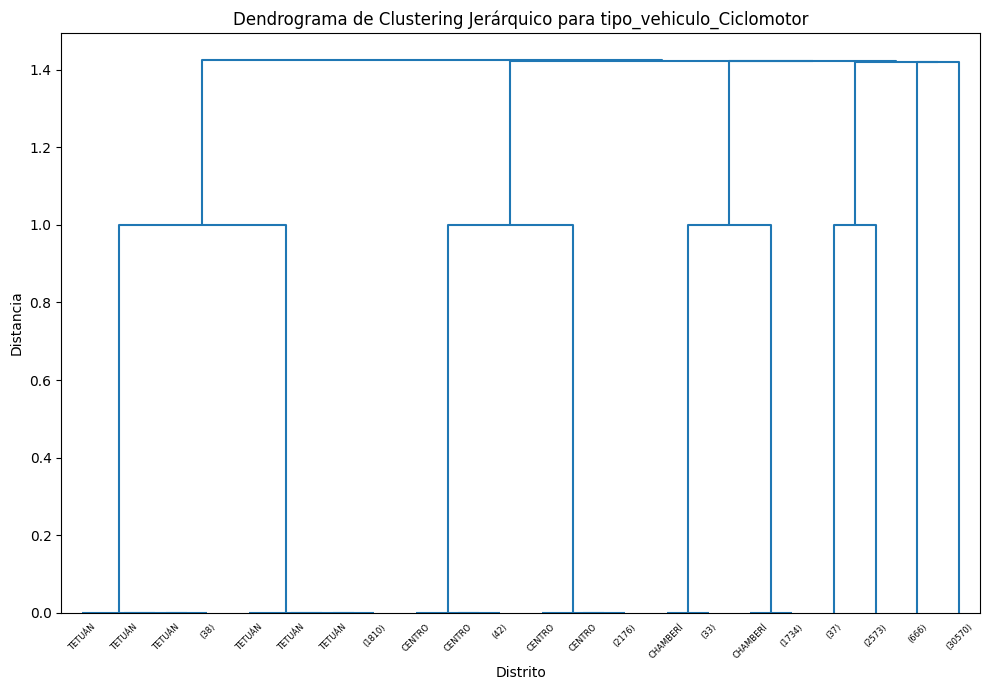

Número de clusters: 2, Silhouette Score: 0.1012
Número de clusters: 3, Silhouette Score: 0.1552
Número de clusters: 4, Silhouette Score: 0.1991
Número de clusters: 5, Silhouette Score: 0.2618
Número de clusters: 6, Silhouette Score: 0.2790
Número de clusters: 7, Silhouette Score: 0.3471
Número de clusters: 8, Silhouette Score: 0.4006
Número de clusters: 9, Silhouette Score: 0.4599
Número óptimo de clusters: 9, con Silhouette Score: 0.4599


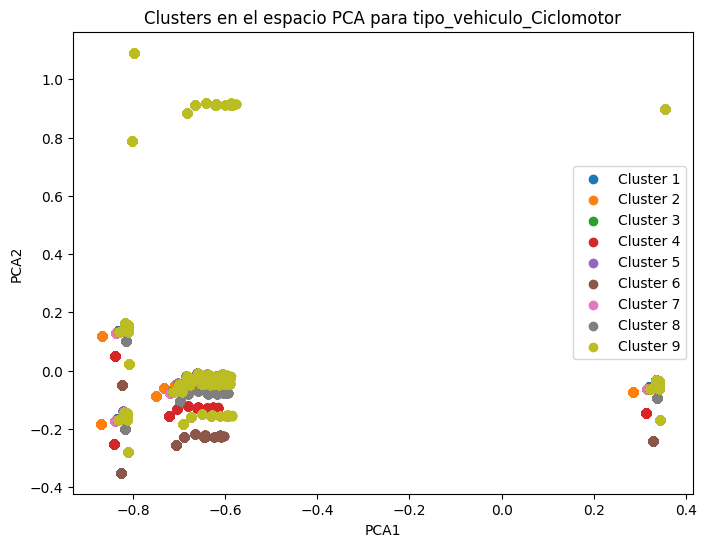

Análisis para tipo_vehiculo_Cuadriciclo ligero:
Varianza explicada por PCA: [0.08334922 0.07521508]


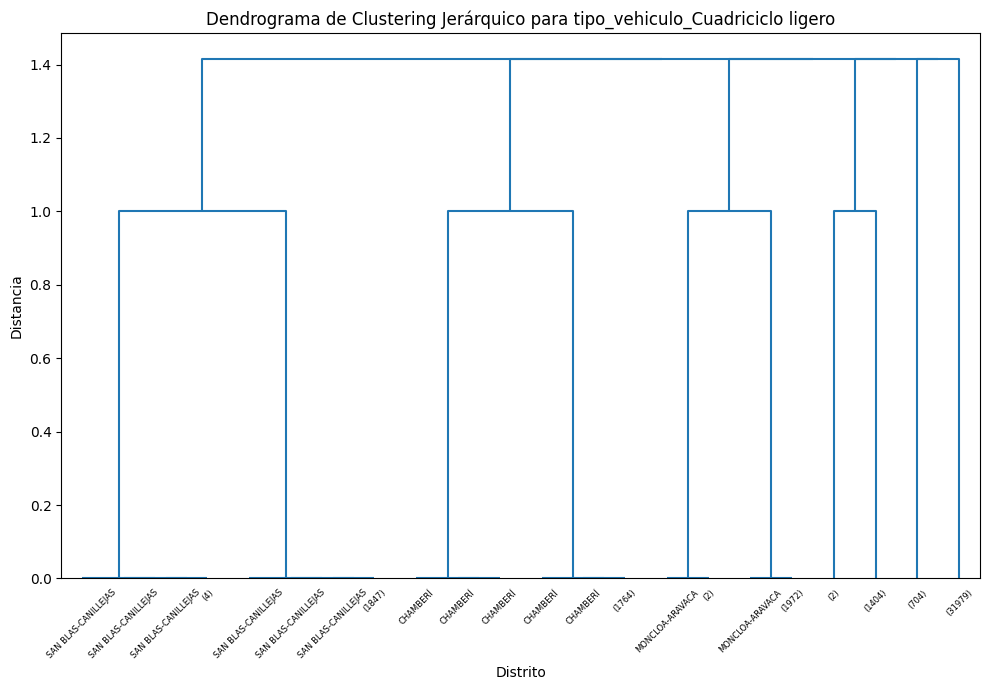

Número de clusters: 2, Silhouette Score: 0.1010
Número de clusters: 3, Silhouette Score: 0.1455
Número de clusters: 4, Silhouette Score: 0.1954
Número de clusters: 5, Silhouette Score: 0.2316
Número de clusters: 6, Silhouette Score: 0.2501
Número de clusters: 7, Silhouette Score: 0.3149
Número de clusters: 8, Silhouette Score: 0.3844
Número de clusters: 9, Silhouette Score: 0.4352
Número óptimo de clusters: 9, con Silhouette Score: 0.4352


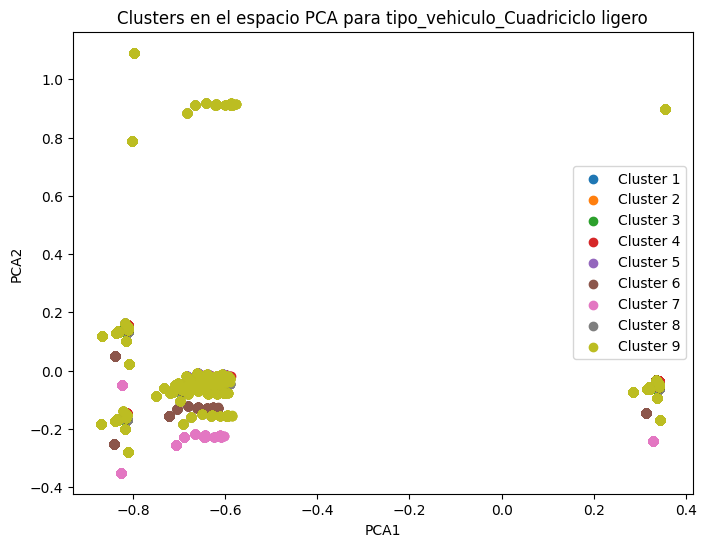

Análisis para tipo_vehiculo_Cuadriciclo no ligero:
Varianza explicada por PCA: [0.08339354 0.07525503]


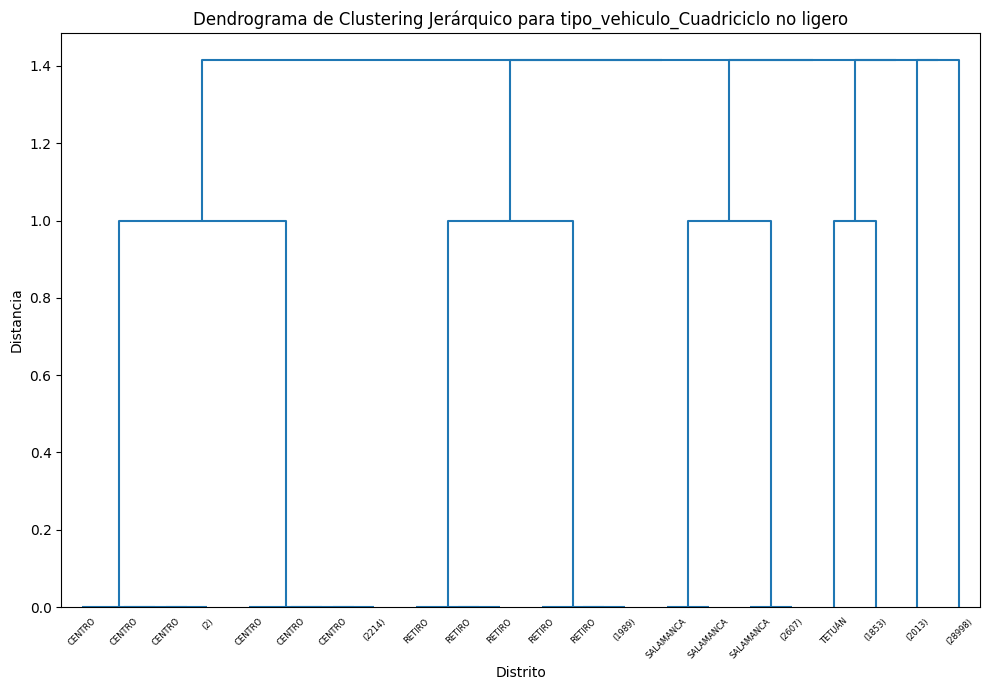

Número de clusters: 2, Silhouette Score: 0.1096
Número de clusters: 3, Silhouette Score: 0.1597
Número de clusters: 4, Silhouette Score: 0.2243
Número de clusters: 5, Silhouette Score: 0.2713
Número de clusters: 6, Silhouette Score: 0.3221
Número de clusters: 7, Silhouette Score: 0.3504
Número de clusters: 8, Silhouette Score: 0.3868
Número de clusters: 9, Silhouette Score: 0.4244
Número óptimo de clusters: 9, con Silhouette Score: 0.4244


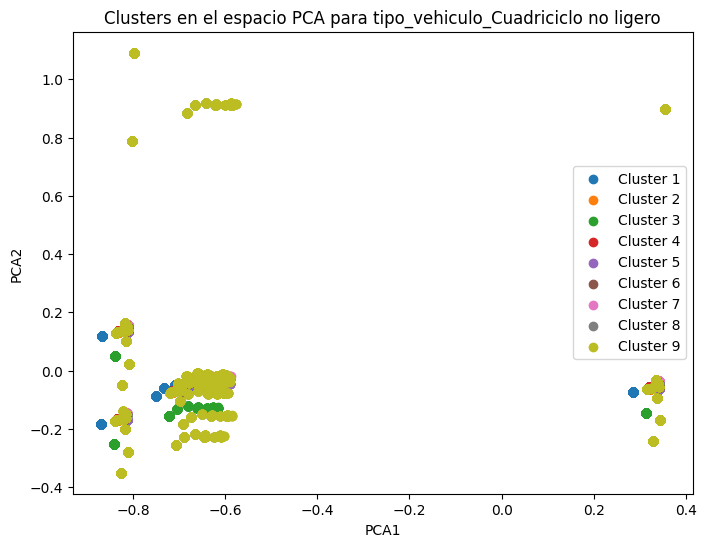

Análisis para tipo_vehiculo_Furgoneta:
Varianza explicada por PCA: [0.07840497 0.07078303]


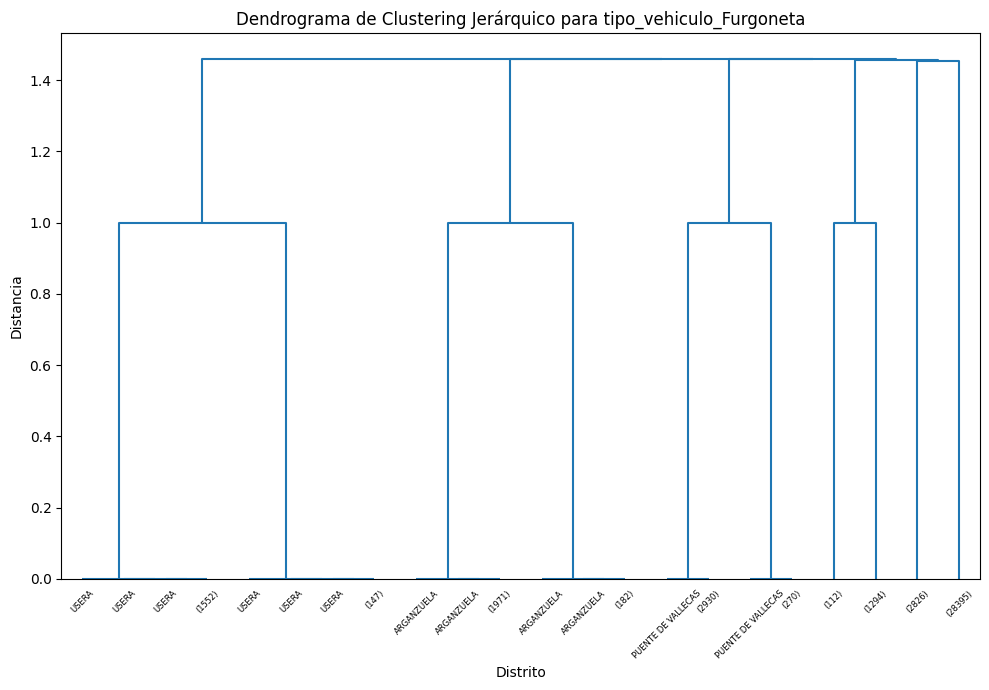

Número de clusters: 2, Silhouette Score: 0.0921
Número de clusters: 3, Silhouette Score: 0.1405
Número de clusters: 4, Silhouette Score: 0.2108
Número de clusters: 5, Silhouette Score: 0.2428
Número de clusters: 6, Silhouette Score: 0.3051
Número de clusters: 7, Silhouette Score: 0.3480
Número de clusters: 8, Silhouette Score: 0.4027
Número de clusters: 9, Silhouette Score: 0.4485
Número óptimo de clusters: 9, con Silhouette Score: 0.4485


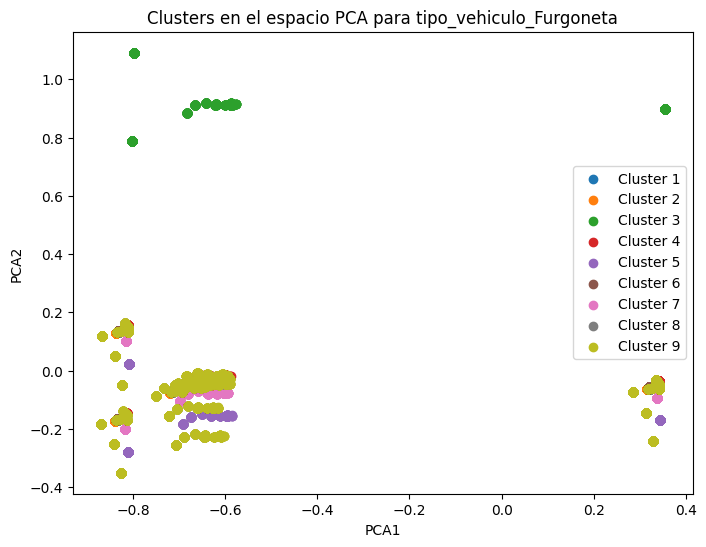

Análisis para tipo_vehiculo_Maquinaria de obras:
Varianza explicada por PCA: [0.08308965 0.0749812 ]


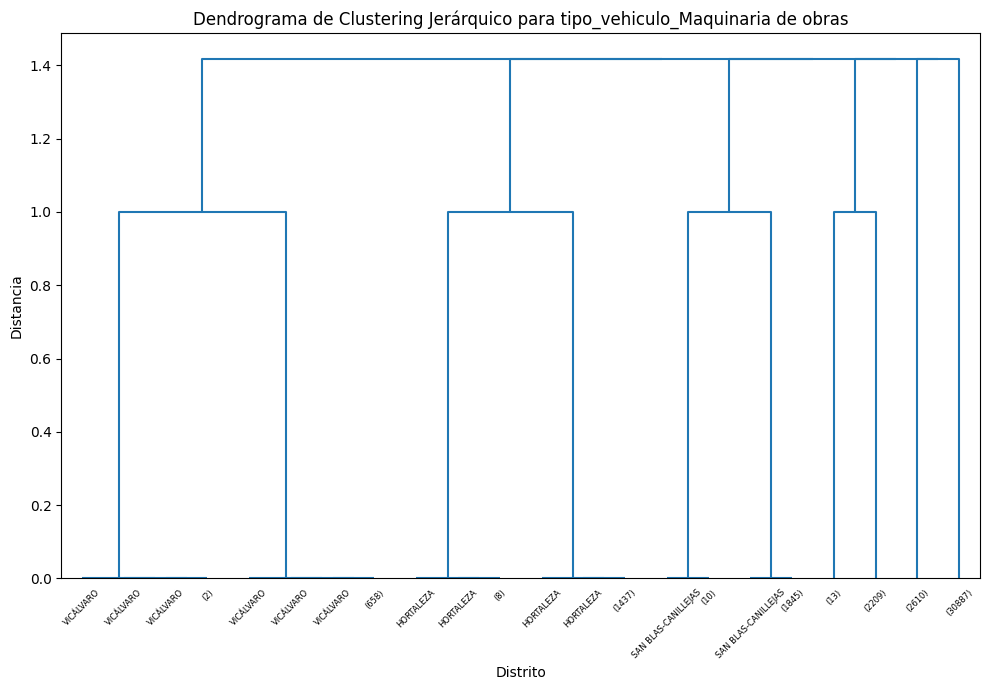

Número de clusters: 2, Silhouette Score: 0.0713
Número de clusters: 3, Silhouette Score: 0.1080
Número de clusters: 4, Silhouette Score: 0.1547
Número de clusters: 5, Silhouette Score: 0.2102
Número de clusters: 6, Silhouette Score: 0.2745
Número de clusters: 7, Silhouette Score: 0.3106
Número de clusters: 8, Silhouette Score: 0.3797
Número de clusters: 9, Silhouette Score: 0.3983
Número óptimo de clusters: 9, con Silhouette Score: 0.3983


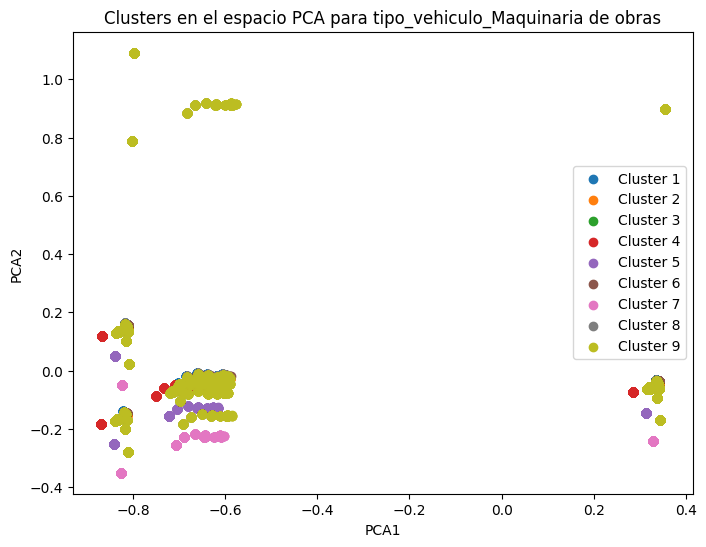

Análisis para tipo_vehiculo_Motocicleta > 125cc:
Varianza explicada por PCA: [0.08045169 0.07258696]


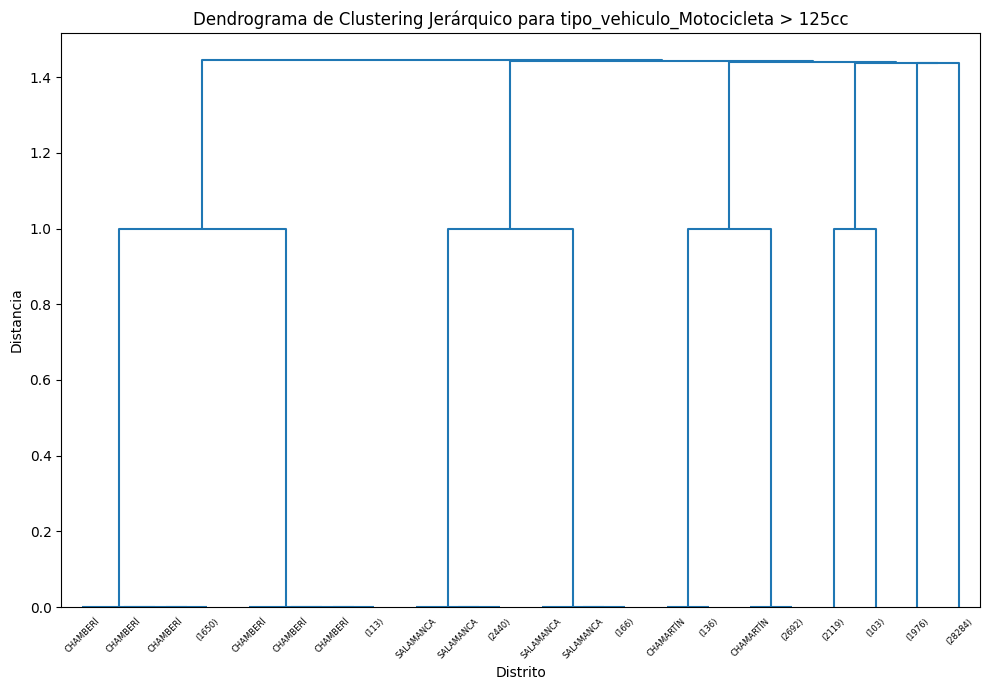

Número de clusters: 2, Silhouette Score: 0.0982
Número de clusters: 3, Silhouette Score: 0.1579
Número de clusters: 4, Silhouette Score: 0.2207
Número de clusters: 5, Silhouette Score: 0.2729
Número de clusters: 6, Silhouette Score: 0.3199
Número de clusters: 7, Silhouette Score: 0.3672
Número de clusters: 8, Silhouette Score: 0.3848
Número de clusters: 9, Silhouette Score: 0.4362
Número óptimo de clusters: 9, con Silhouette Score: 0.4362


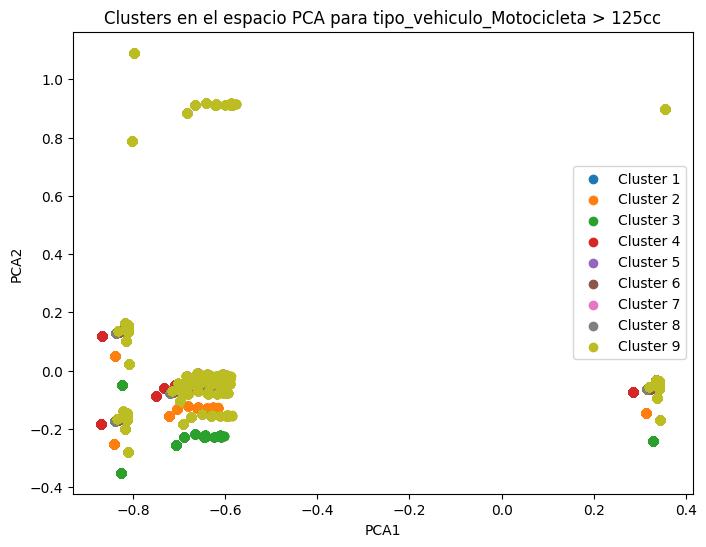

Análisis para tipo_vehiculo_Motocicleta hasta 125cc:
Varianza explicada por PCA: [0.07852181 0.07082934]


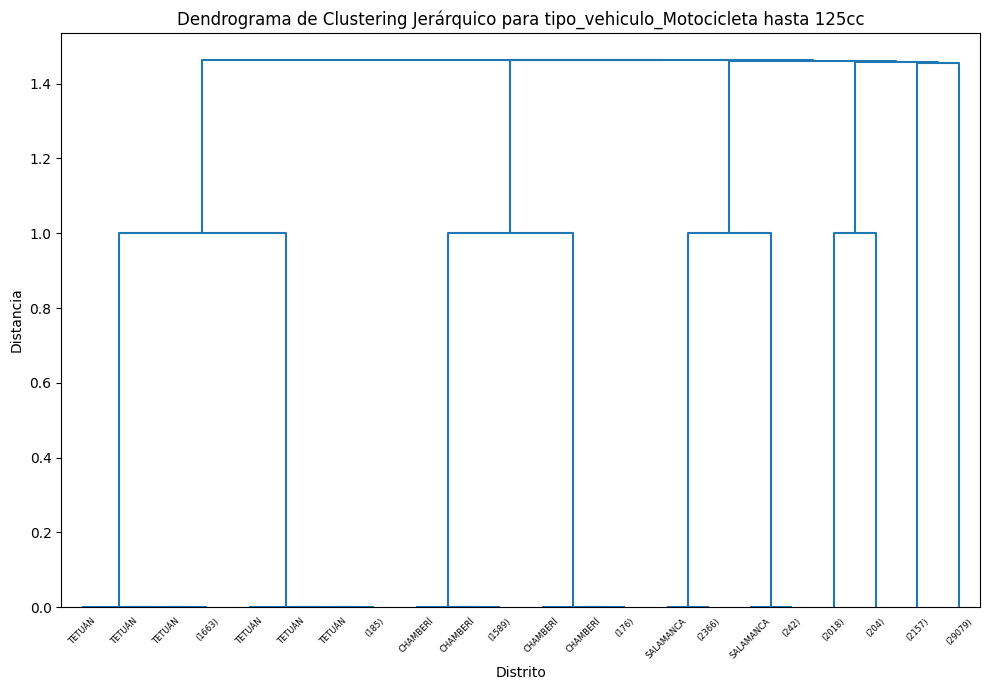

Número de clusters: 2, Silhouette Score: 0.0970
Número de clusters: 3, Silhouette Score: 0.1368
Número de clusters: 4, Silhouette Score: 0.1934
Número de clusters: 5, Silhouette Score: 0.2431
Número de clusters: 6, Silhouette Score: 0.2910
Número de clusters: 7, Silhouette Score: 0.3535
Número de clusters: 8, Silhouette Score: 0.3989
Número de clusters: 9, Silhouette Score: 0.4530
Número óptimo de clusters: 9, con Silhouette Score: 0.4530


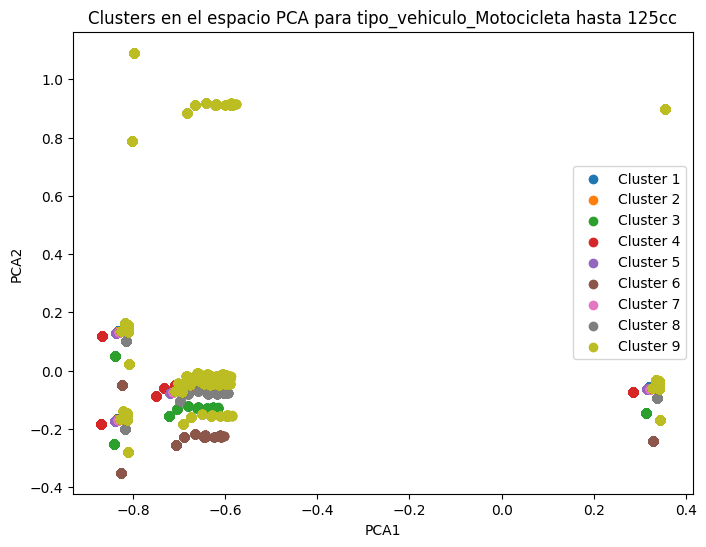

Análisis para tipo_vehiculo_Otros vehículos con motor:
Varianza explicada por PCA: [0.08310542 0.07499462]


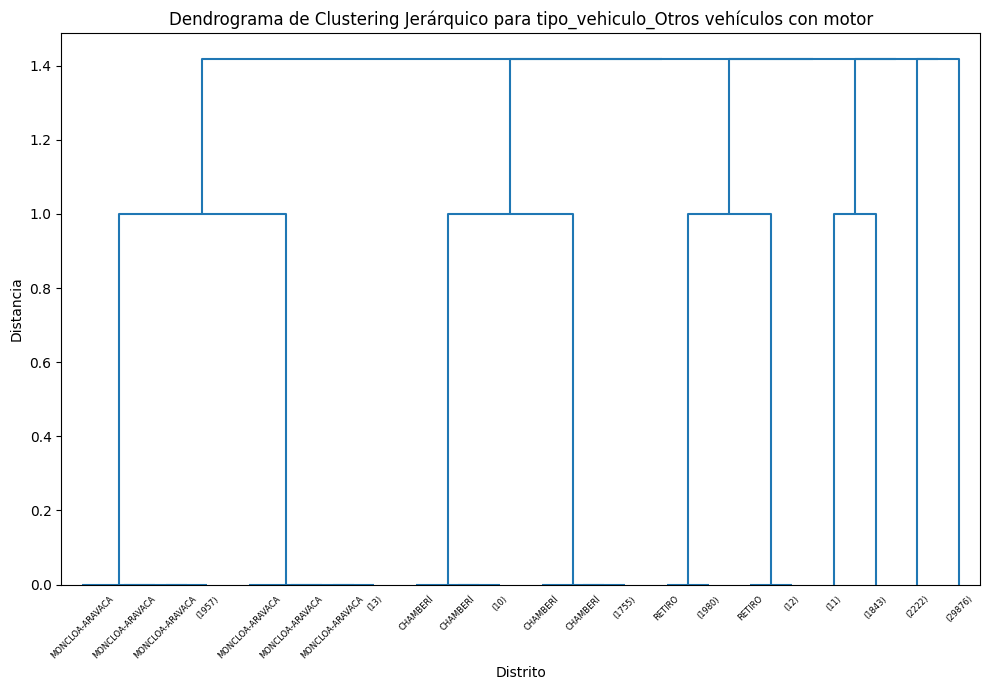

Número de clusters: 2, Silhouette Score: 0.1037
Número de clusters: 3, Silhouette Score: 0.1480
Número de clusters: 4, Silhouette Score: 0.1981
Número de clusters: 5, Silhouette Score: 0.2448
Número de clusters: 6, Silhouette Score: 0.3002
Número de clusters: 7, Silhouette Score: 0.3284
Número de clusters: 8, Silhouette Score: 0.3754
Número de clusters: 9, Silhouette Score: 0.4295
Número óptimo de clusters: 9, con Silhouette Score: 0.4295


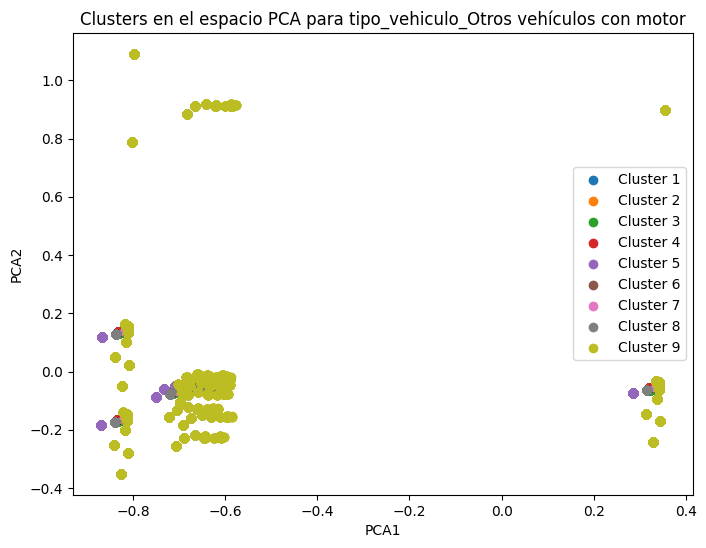

Análisis para tipo_vehiculo_Otros vehículos sin motor:
Varianza explicada por PCA: [0.08339132 0.07525303]


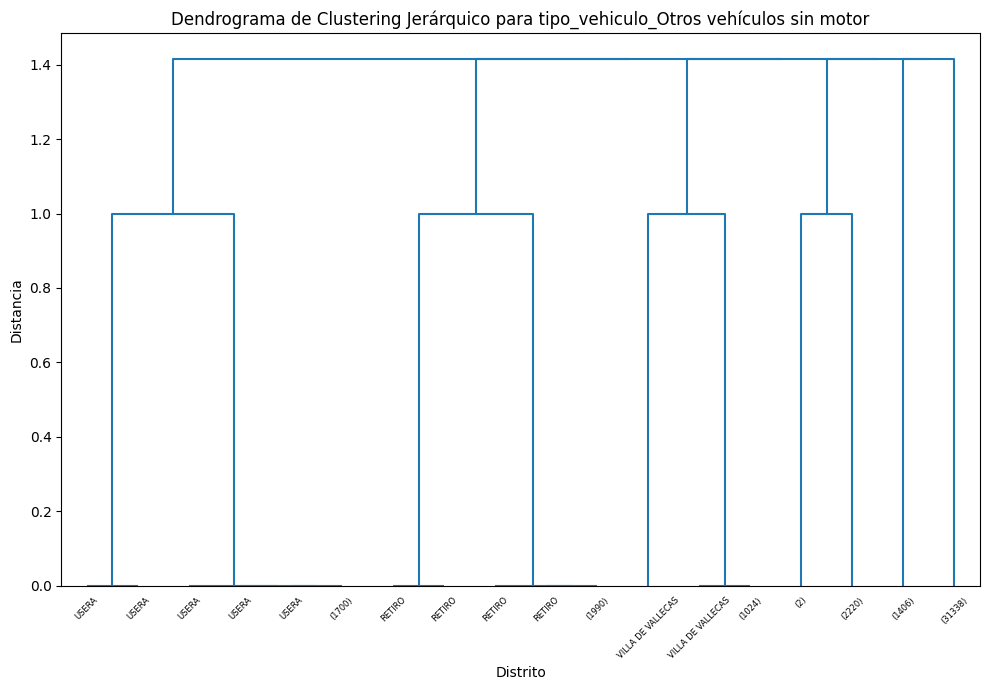

Número de clusters: 2, Silhouette Score: 0.0970
Número de clusters: 3, Silhouette Score: 0.1474
Número de clusters: 4, Silhouette Score: 0.1740
Número de clusters: 5, Silhouette Score: 0.2298
Número de clusters: 6, Silhouette Score: 0.2661
Número de clusters: 7, Silhouette Score: 0.3438
Número de clusters: 8, Silhouette Score: 0.3910
Número de clusters: 9, Silhouette Score: 0.4554
Número óptimo de clusters: 9, con Silhouette Score: 0.4554


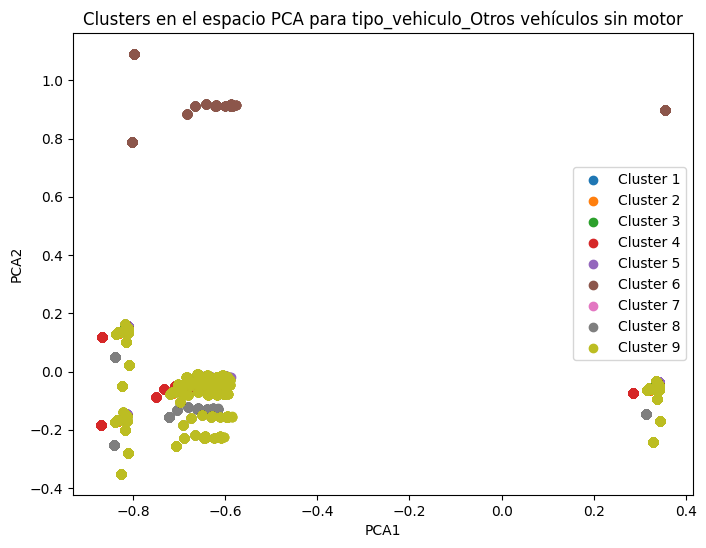

Análisis para tipo_vehiculo_Todo terreno:
Varianza explicada por PCA: [0.08191735 0.0739495 ]


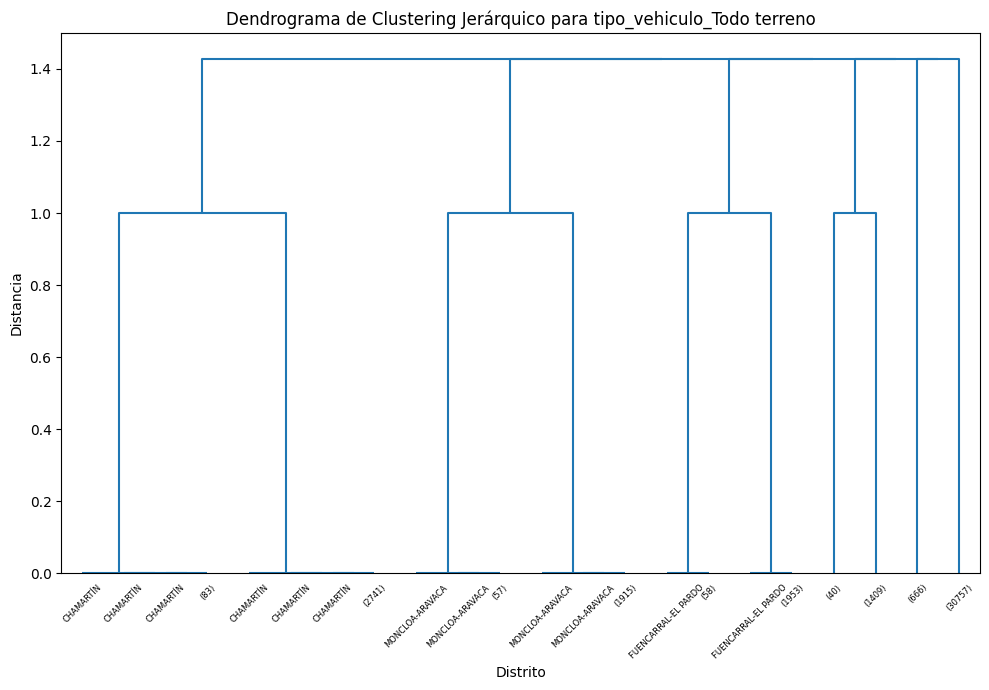

Número de clusters: 2, Silhouette Score: 0.1222
Número de clusters: 3, Silhouette Score: 0.1702
Número de clusters: 4, Silhouette Score: 0.2191
Número de clusters: 5, Silhouette Score: 0.2548
Número de clusters: 6, Silhouette Score: 0.2717
Número de clusters: 7, Silhouette Score: 0.3150
Número de clusters: 8, Silhouette Score: 0.3778
Número de clusters: 9, Silhouette Score: 0.4235
Número óptimo de clusters: 9, con Silhouette Score: 0.4235


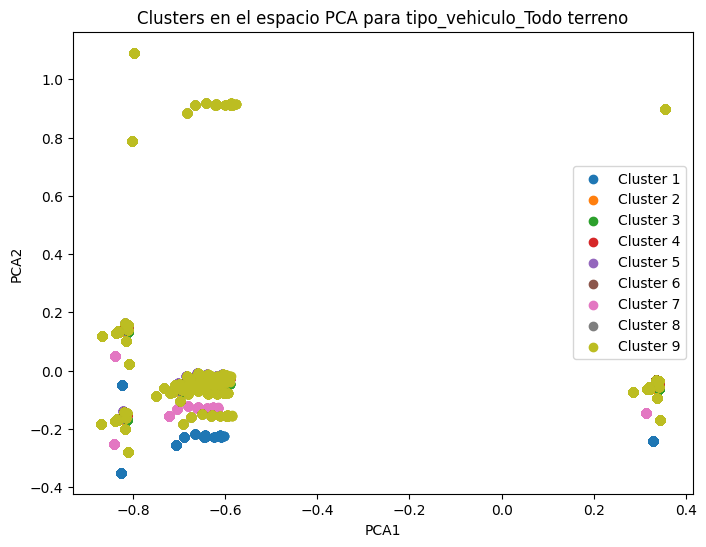

Análisis para tipo_vehiculo_Tractocamión:
Varianza explicada por PCA: [0.08301178 0.07490991]


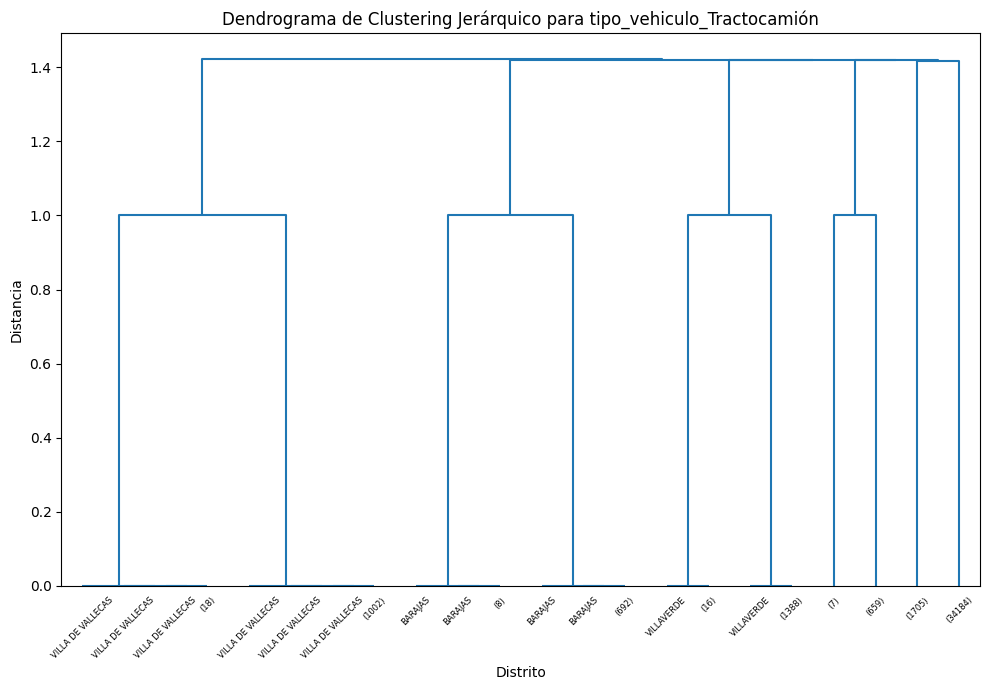

Número de clusters: 2, Silhouette Score: 0.0824
Número de clusters: 3, Silhouette Score: 0.0992
Número de clusters: 4, Silhouette Score: 0.1345
Número de clusters: 5, Silhouette Score: 0.1514
Número de clusters: 6, Silhouette Score: 0.1940
Número de clusters: 7, Silhouette Score: 0.2715
Número de clusters: 8, Silhouette Score: 0.3221
Número de clusters: 9, Silhouette Score: 0.3689
Número óptimo de clusters: 9, con Silhouette Score: 0.3689


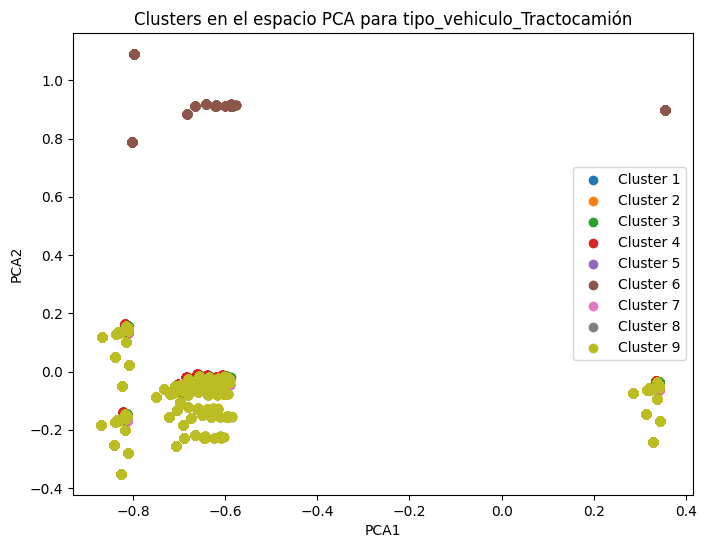

Análisis para tipo_vehiculo_Turismo:
Varianza explicada por PCA: [0.18549889 0.06792369]


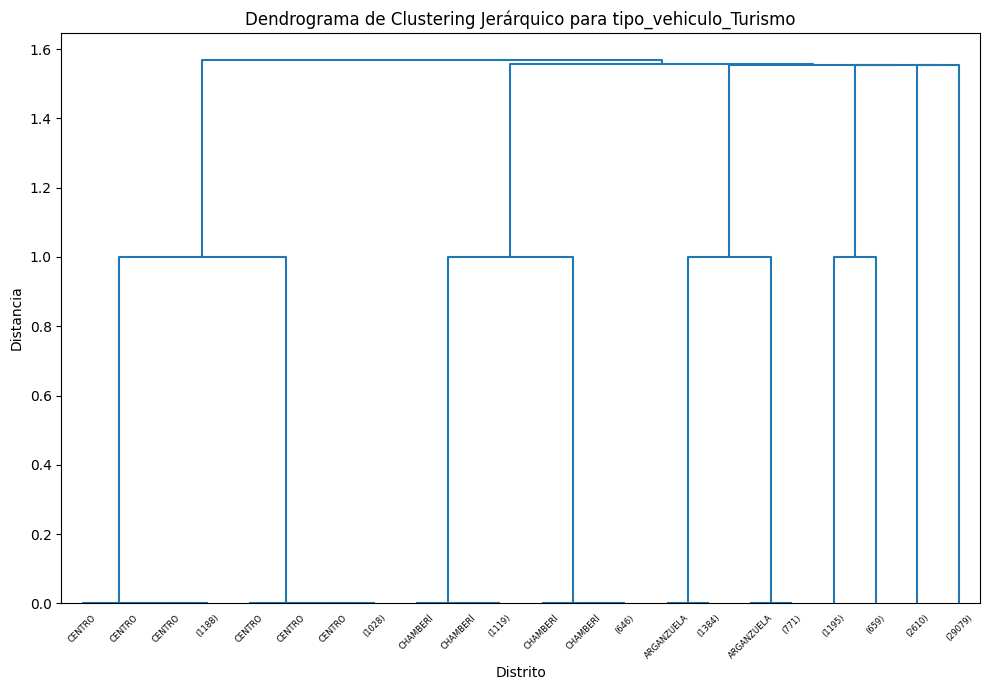

Número de clusters: 2, Silhouette Score: 0.0890
Número de clusters: 3, Silhouette Score: 0.1085
Número de clusters: 4, Silhouette Score: 0.1462
Número de clusters: 5, Silhouette Score: 0.1795
Número de clusters: 6, Silhouette Score: 0.2256
Número de clusters: 7, Silhouette Score: 0.2605
Número de clusters: 8, Silhouette Score: 0.2956
Número de clusters: 9, Silhouette Score: 0.3449
Número óptimo de clusters: 9, con Silhouette Score: 0.3449


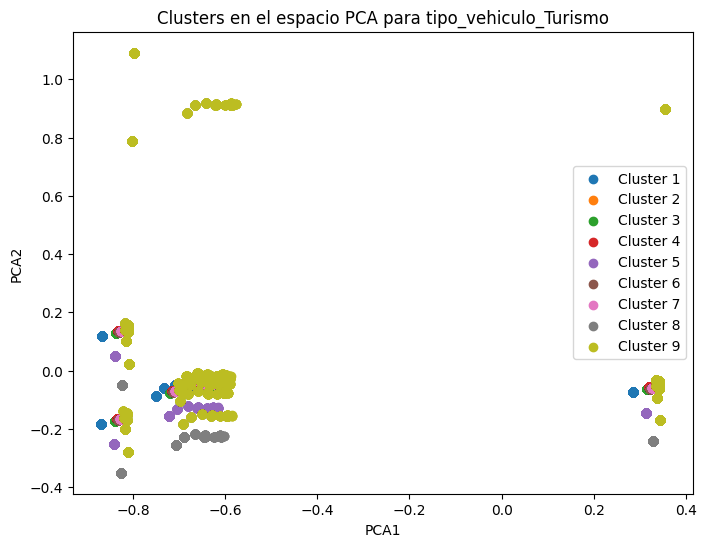

Análisis para tipo_vehiculo_VMU eléctrico:
Varianza explicada por PCA: [0.0819952 0.0740019]


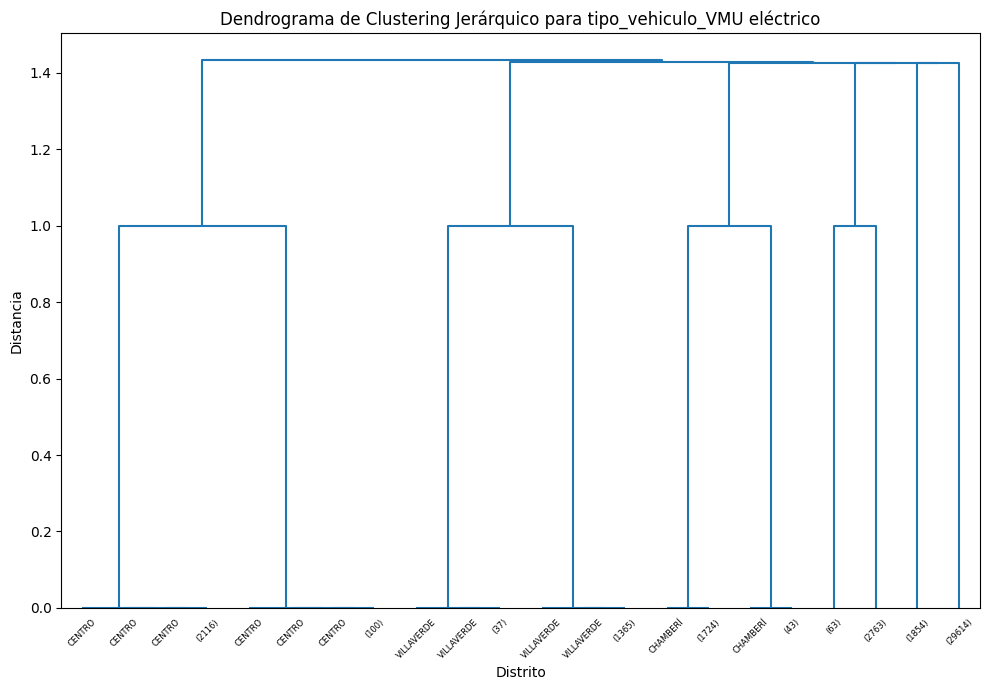

Número de clusters: 2, Silhouette Score: 0.1112
Número de clusters: 3, Silhouette Score: 0.1425
Número de clusters: 4, Silhouette Score: 0.1856
Número de clusters: 5, Silhouette Score: 0.2529
Número de clusters: 6, Silhouette Score: 0.2987
Número de clusters: 7, Silhouette Score: 0.3246
Número de clusters: 8, Silhouette Score: 0.3671
Número de clusters: 9, Silhouette Score: 0.4165
Número óptimo de clusters: 9, con Silhouette Score: 0.4165


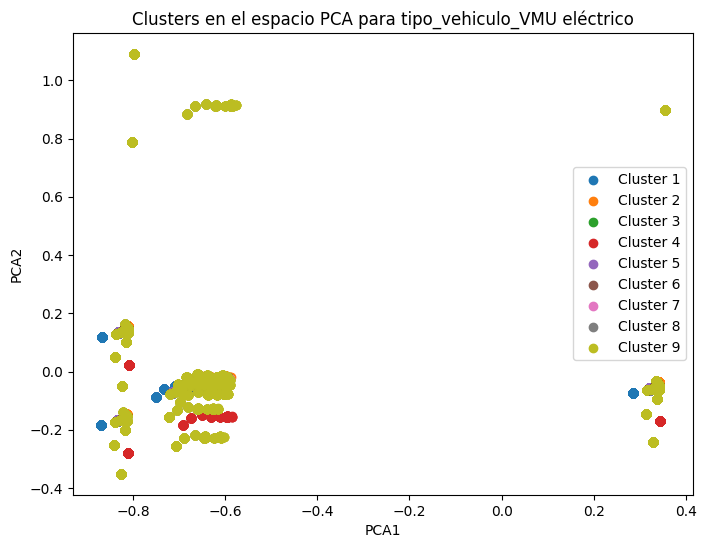

Análisis para tipo_vehiculo_Vehículo articulado:
Varianza explicada por PCA: [0.08311422 0.07500319]


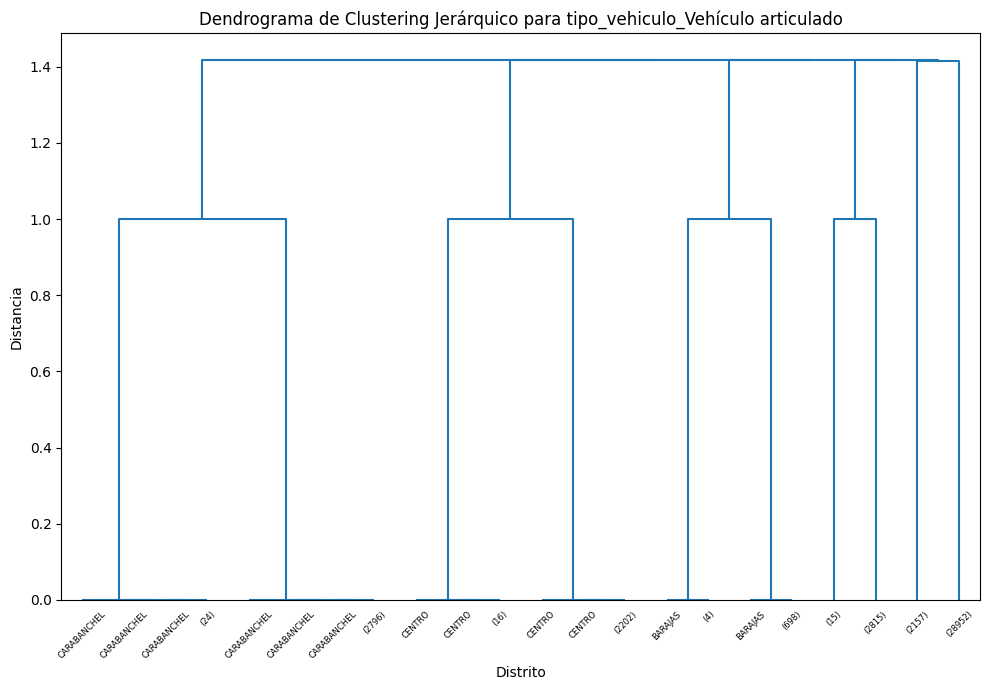

Número de clusters: 2, Silhouette Score: 0.1235
Número de clusters: 3, Silhouette Score: 0.1784
Número de clusters: 4, Silhouette Score: 0.1965
Número de clusters: 5, Silhouette Score: 0.2653
Número de clusters: 6, Silhouette Score: 0.3190
Número de clusters: 7, Silhouette Score: 0.3550
Número de clusters: 8, Silhouette Score: 0.4147
Número de clusters: 9, Silhouette Score: 0.4651
Número óptimo de clusters: 9, con Silhouette Score: 0.4651


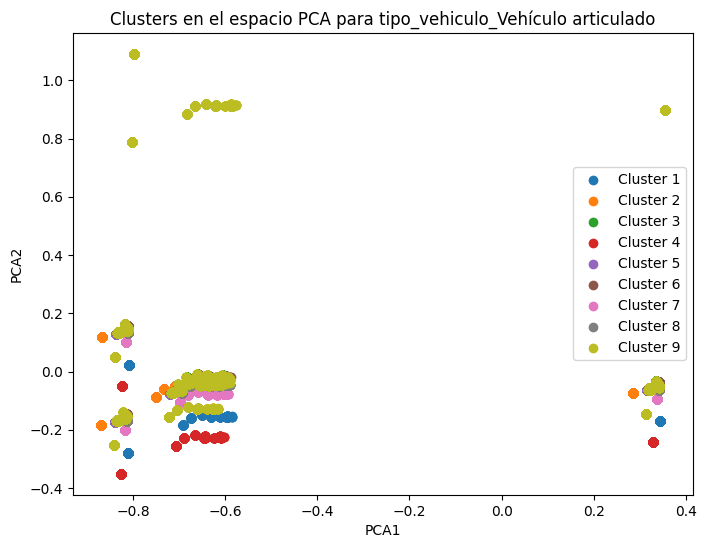


Resumen de clusters para tipo_vehiculo_Autobus EMT:
                                   tipo_vehiculo_Autobus EMT
cluster_tipo_vehiculo_Autobus EMT                           
1                                                       2610
2                                                       1026
3                                                       2422
4                                                       1976
5                                                       2222
6                                                       1449
7                                                       2826
8                                                       1085
9                                                      24075

Resumen de clusters para tipo_vehiculo_Autobús:
                               tipo_vehiculo_Autobús
cluster_tipo_vehiculo_Autobús                       
1                                               2222
2                                               1994
3              

In [813]:
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

vehiculo_columns = [col for col in df.columns if col.startswith('tipo_vehiculo_')]
distrito_columns = [col for col in df.columns if col.startswith('distrito_')]

for vehiculo in vehiculo_columns:
    print(f"Análisis para {vehiculo}:")
    
    X_vehiculo = df[[vehiculo] + distrito_columns].values
    
    pca = PCA(n_components=2)
    X_pca_vehiculo = pca.fit_transform(X_vehiculo)
    
    explained_variance = pca.explained_variance_ratio_
    print(f"Varianza explicada por PCA: {explained_variance}")
    
    Z = linkage(X_vehiculo, method='average')
    
    plt.figure(figsize=(10, 7))
    dendrogram(Z, labels=df['distrito'].values, leaf_rotation=90, leaf_font_size=6, color_threshold=0, truncate_mode='level', p=4)
    plt.title(f'Dendrograma de Clustering Jerárquico para {vehiculo}')
    plt.xlabel('Distrito')
    plt.ylabel('Distancia')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    best_clusters = 0
    best_score = -1
    for k in range(2, 10): 
        clusters = fcluster(Z, t=k, criterion='maxclust')
        score = silhouette_score(X_vehiculo, clusters)
        print(f"Número de clusters: {k}, Silhouette Score: {score:.4f}")
        if score > best_score:
            best_score = score
            best_clusters = k

    print(f"Número óptimo de clusters: {best_clusters}, con Silhouette Score: {best_score:.4f}")
    
    df[f'cluster_{vehiculo}'] = fcluster(Z, t=best_clusters, criterion='maxclust')
    
    plt.figure(figsize=(8, 6))
    for cluster in np.unique(df[f'cluster_{vehiculo}']):
        cluster_data = df[df[f'cluster_{vehiculo}'] == cluster]
        plt.scatter(cluster_data['PCA1'], cluster_data['PCA2'], label=f'Cluster {cluster}')
    plt.title(f'Clusters en el espacio PCA para {vehiculo}')
    plt.xlabel('PCA1')
    plt.ylabel('PCA2')
    plt.legend()
    plt.show()

for vehiculo in vehiculo_columns:
    print(f"\nResumen de clusters para {vehiculo}:")
    print(df[[vehiculo, f'cluster_{vehiculo}']].groupby(f'cluster_{vehiculo}').count())


Para entender mejor los resultados, graficamos cómo se distribuyen los clusters por distritos.

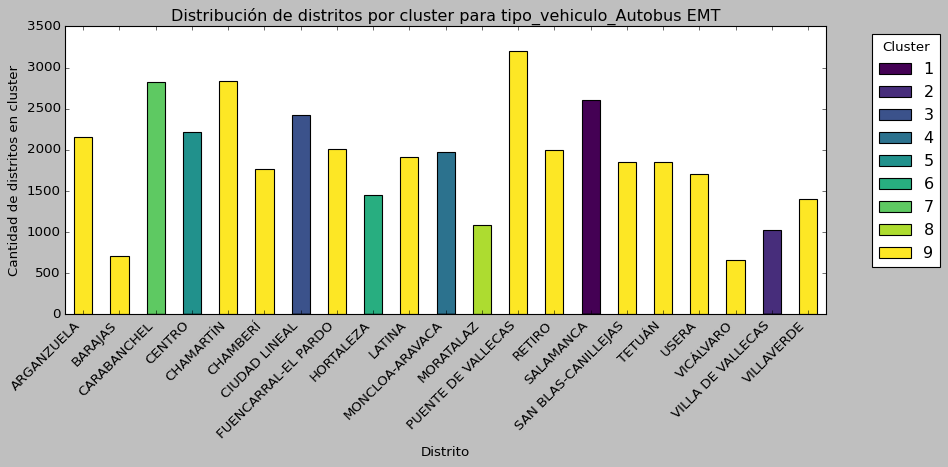

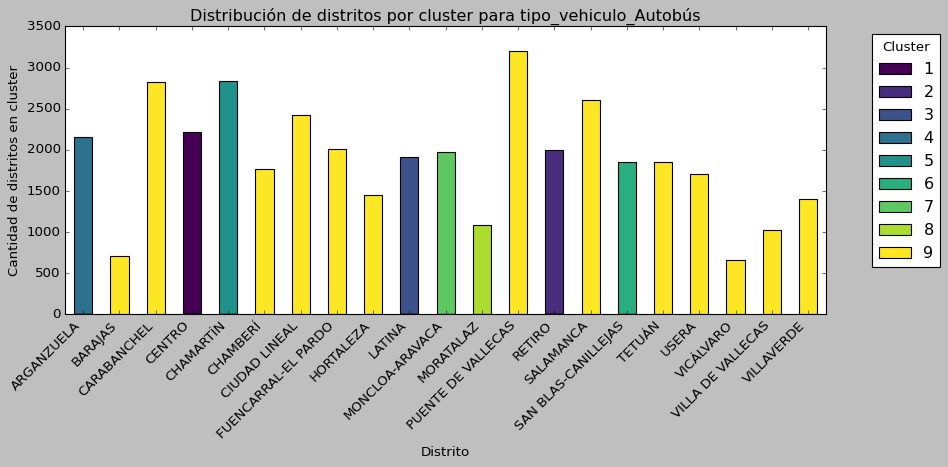

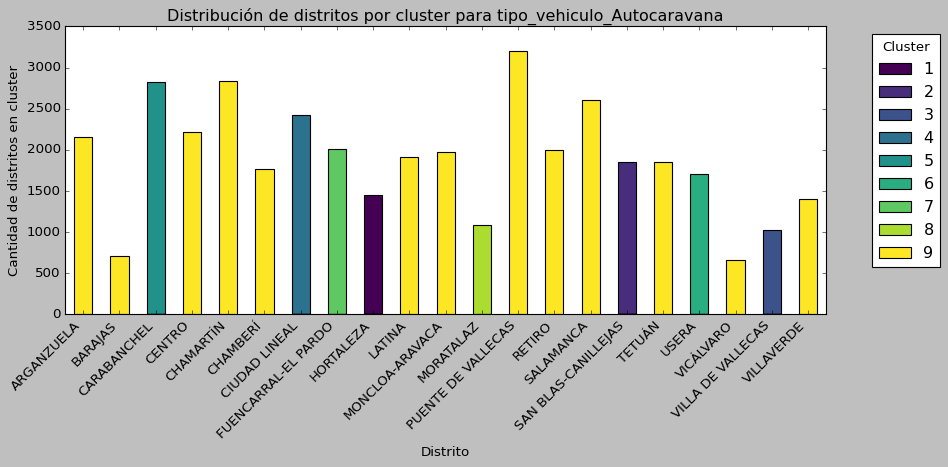

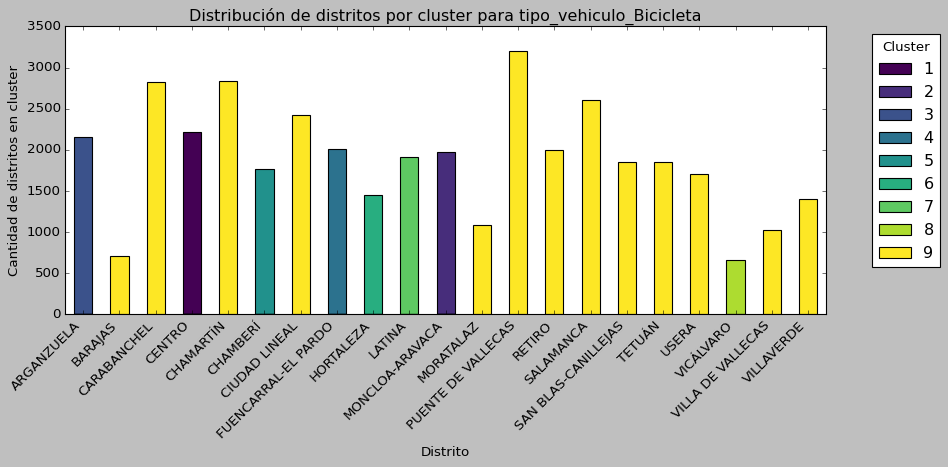

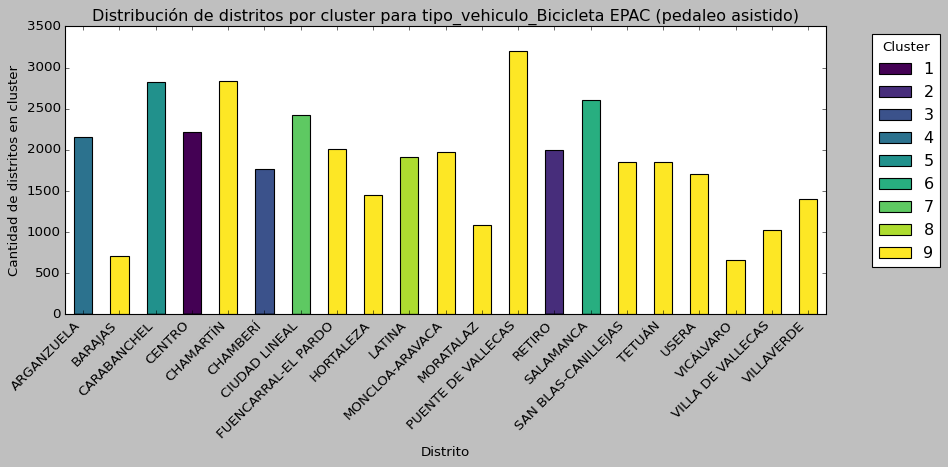

...

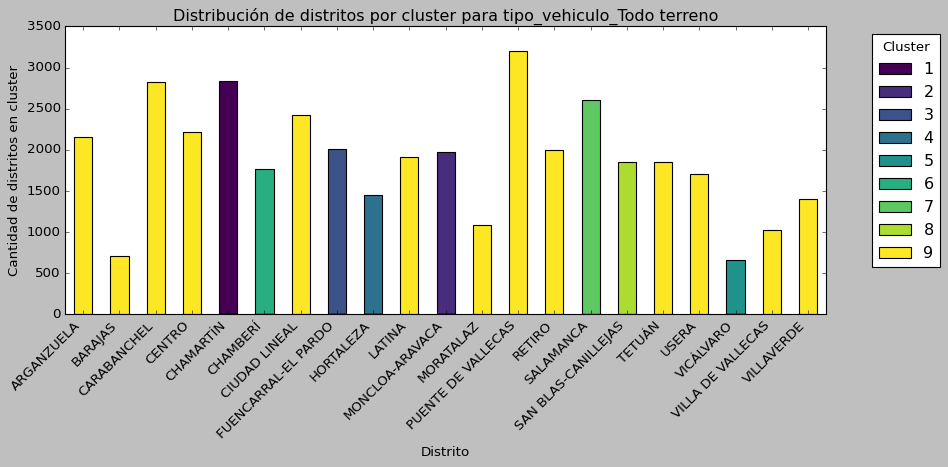

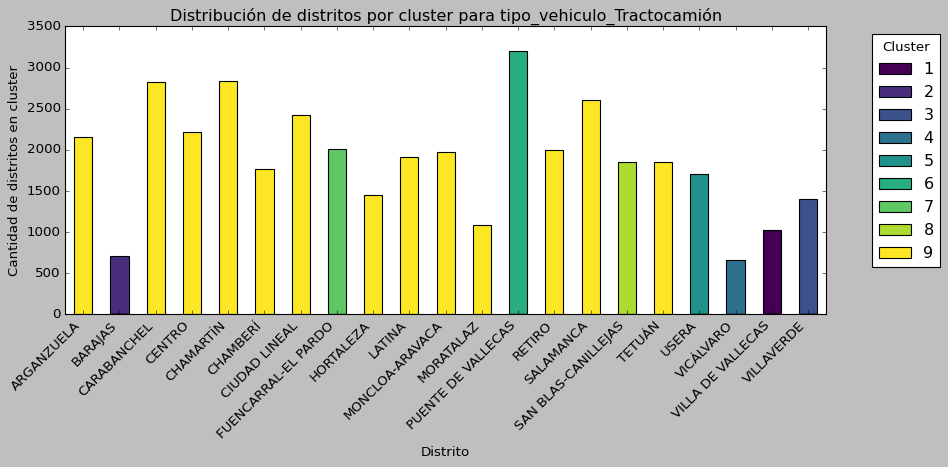

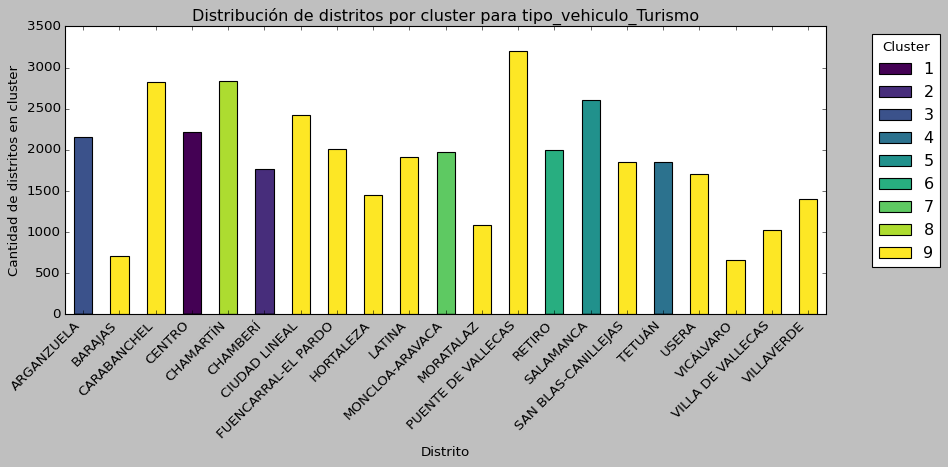

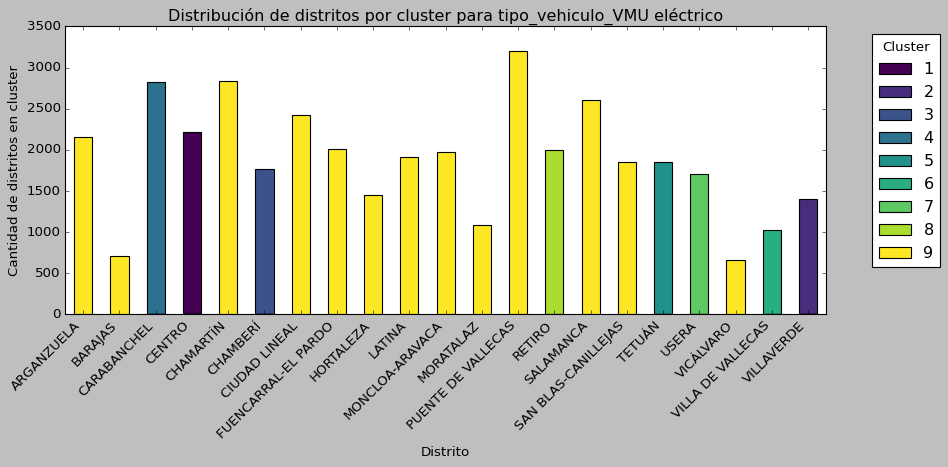

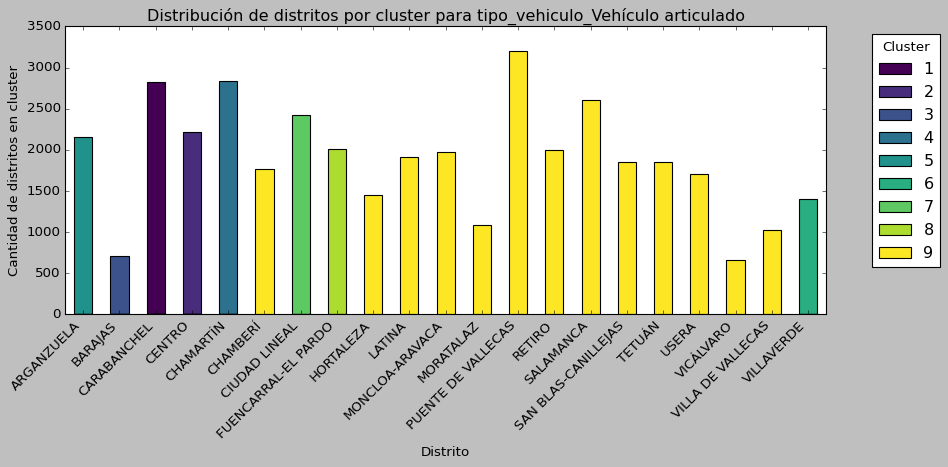

In [819]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('classic') 

for vehiculo in vehiculo_columns:
    cluster_col = f'cluster_{vehiculo}'
    cluster_distrito_counts = df.groupby([cluster_col, 'distrito']).size().unstack(fill_value=0)
    cluster_distrito_counts.T.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
    plt.title(f'Distribución de distritos por cluster para {vehiculo}')
    plt.xlabel('Distrito')
    plt.ylabel('Cantidad de distritos en cluster')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


Como podemos observar, zonas de Madrid sur como Puente de Vallecas, Usera, Vicálvaro, Arganzuela... y tirando un poco más hacia el este: Barajas, Canillejas... Suelen estar agrupadas en el mismo cluster, donde el índice de siniestralidad es mayor. Mientras que zonas del centro se agrupan en clusters distintos. Esto puede cambiar ya que por cada tipo de vehículo los resultados varían, pero en general los datos siguen esta línea . Vamos a verlo graficando las coordenadas de cada accidente como si fuera un mapa para entenderlo mejor.

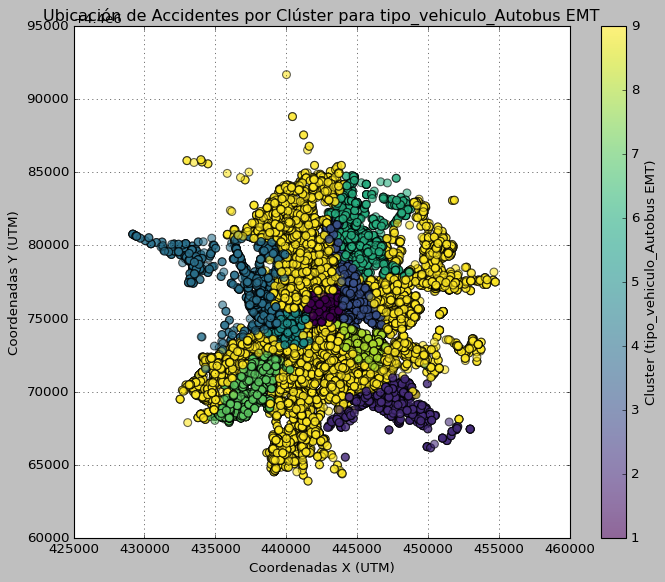

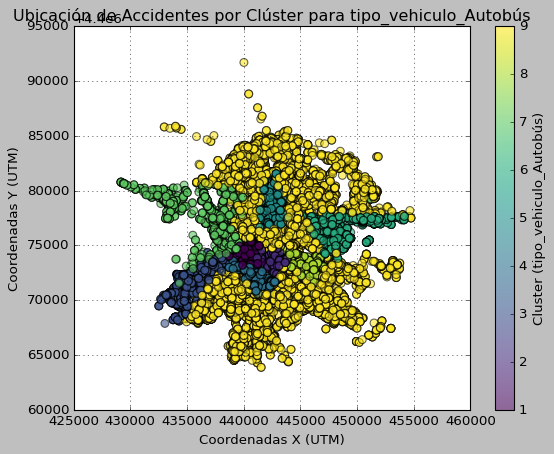

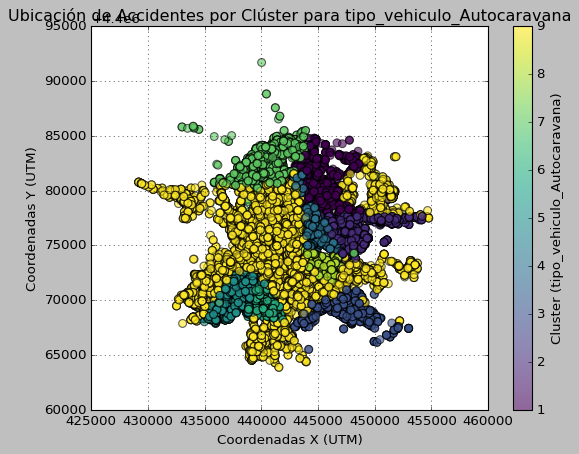

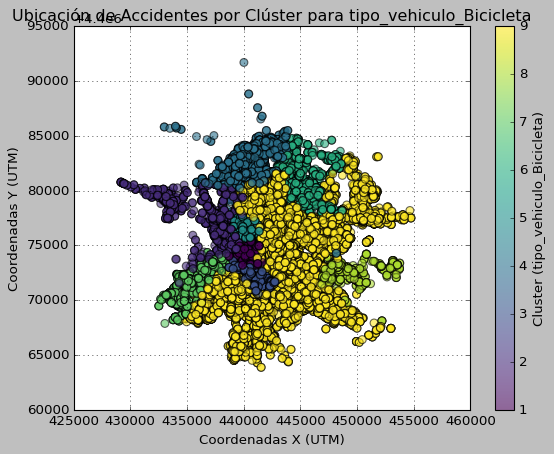

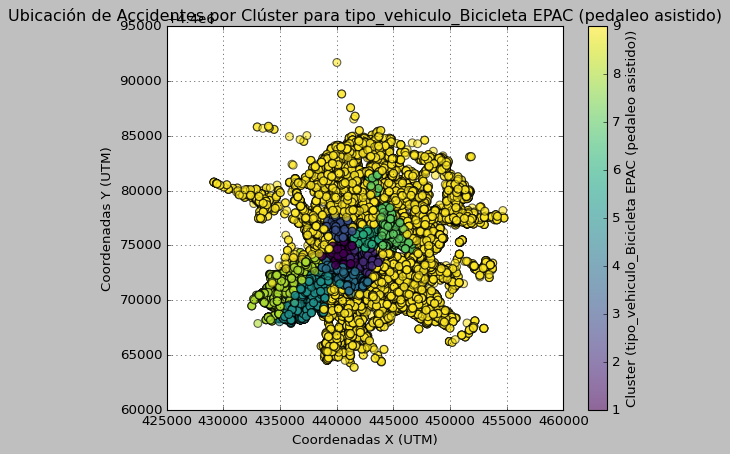

...

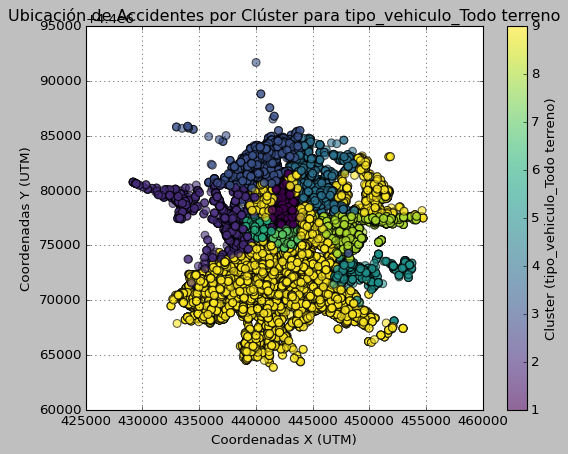

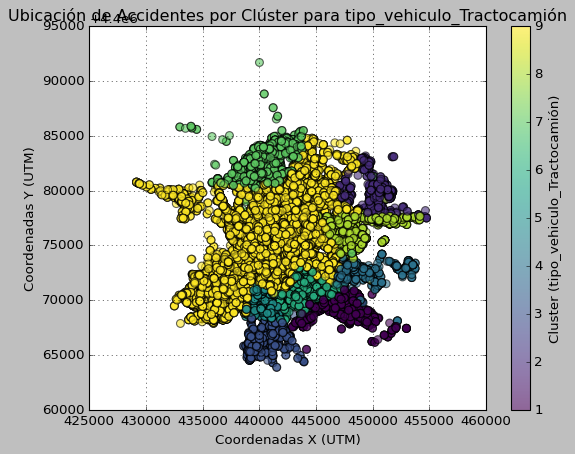

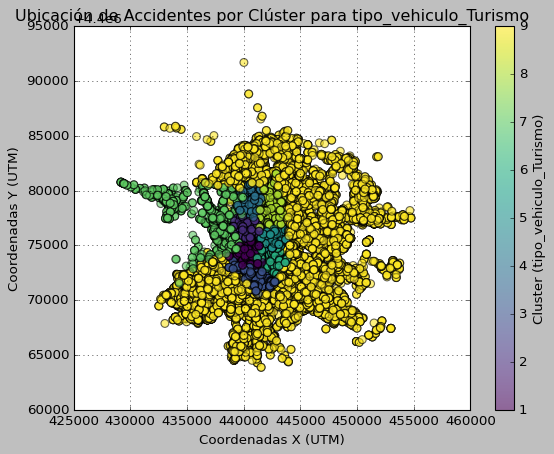

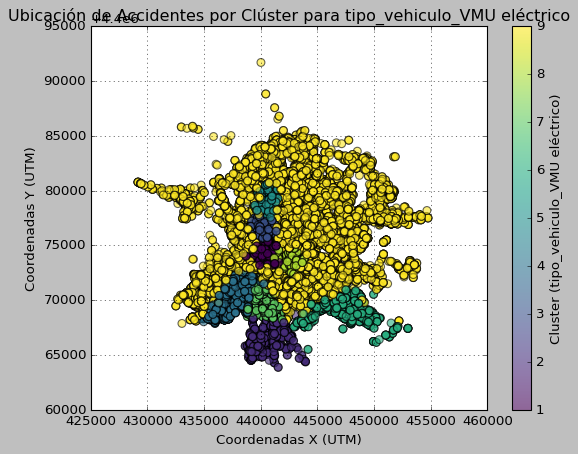

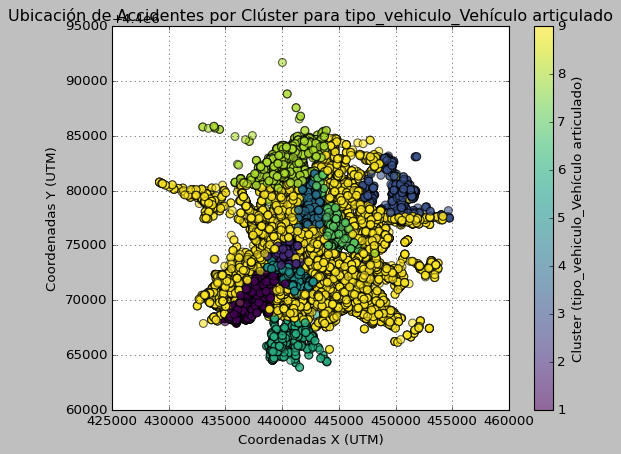

In [824]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(10, 8))

for vehiculo in vehiculo_columns:
    cluster_col = f'cluster_{vehiculo}'
    
    plt.scatter(df['coordenada_x_utm'], df['coordenada_y_utm'], c=df[cluster_col], cmap='viridis', alpha=0.6, edgecolors='k', s=50)
    
    plt.title(f'Ubicación de Accidentes por Clúster para {vehiculo}')
    plt.xlabel('Coordenadas X (UTM)')
    plt.ylabel('Coordenadas Y (UTM)')
    plt.colorbar(label=f'Cluster ({vehiculo})')
    plt.grid(True)
    plt.show()


En los mapas vemos mejor la distribución que hemos mencionado antes. Vamos a fijarnos en el gráfico del turismo ya que es el tipo de vehículo que más se repite con diferencia. vemos cómo se agrupan los accidentes por las zonas de madrid sur y el este debido a su proximidad causado por un gran número de accidentes cercanos. De este modo así lo agrupan las distancias de los algoritmos de clustering.
Por otro lado, vemos cómo se generan más clusters por el centro de Madrid y por la zona oeste donde la cantidad de accidentes es menor.